In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
%matplotlib inline
sns.set(font_scale = 2)
import scipy.stats as stat
import pylab 
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import chi2
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso

In [2]:
def identify_feature(data):
    """
        Method Name: identify_feature
        Description: This function identifies the categorical, continuous numerical and discrete numerical features in the datset.
        It also identifies datetime feature and extracts the relevant info from it.
        Output: df,data_cont_num_feature,data_dis_num_feature,data_cat_feature,dt_feature
    """
    # Initialize the variables
    df=data.copy()
    data_cat_feature=[]
    data_datetime=pd.DataFrame()
    
    # Identify datetime and categorical features in the dataset 
    for col in df.columns:
        if df[col].dtype == 'O' or df[col].dtype == 'category':
            try:
                data_datetime[col] = pd.to_datetime(df[col])
            except:
                data_cat_feature.append(col)
    
    # Save the name of datetime features in the list
    data_datetime_feature=data_datetime.columns 
    dt_feature=set()
    
    # Extract the year, month and hour information from the datetime featur, insert it in the main dataset and 
    # save their feature names in the set dt_feature.
    if len(data_datetime_feature)!=0:
        for i in data_datetime_feature:
            df[i+'_year']=data_datetime[i].dt.year
            dt_feature.add(i+'_year')
            df[i+'_month']=data_datetime[i].dt.month
            dt_feature.add(i+'_month')
            df[i+'_hour']=data_datetime[i].dt.hour
            dt_feature.add(i+'_hour')
    
    # convert the set in a list format
    dt_feature=list(dt_feature) 
    # Drop the datetime feature after info extraction
    df.drop(['datetime'],axis=1, inplace=True)
    
    # Identify the continuous and discrete numerical features in the DataFrame
    data_num_feature=[col for col in df.columns if (df[col].dtype!='O' and df[col].dtype!='category') or col not in data_cat_feature]
    data_dis_num_feature=[i for i in data_num_feature if len(df[i].value_counts())<=30 and i not in dt_feature]
    data_cont_num_feature=[i for i in data_num_feature if len(df[i].value_counts())>30]

    return df,data_cont_num_feature,data_dis_num_feature,data_cat_feature,dt_feature
 

In [3]:
def plot_nan_feature(data, continuous_features, discrete_features, categorical_features,dependent_var):
    """
        Method Name: plot_nan_feature
        Description: It identifies the missing values in the dataset and visualize them their impact on dependent feature.
        Output: df, nan_features
    """
    df=data.copy()
    total=df.isnull().sum().sort_values(ascending=False) # Feature wise missing value count in the dataset
    # Featurewise missing value percentage in the dataset
    pct=(df.isnull().sum()/df.count()).sort_values(ascending=False)
    missing_data=pd.concat([total,pct], axis=1, keys=['total', 'pct'])
    
    # Initialize parameters
    count=0
    nan_features=[]
    drop_col=[]
    
    # Identifies all the features containing NaN features 
    for col in df.columns:
        if missing_data['pct'][col]>0.01 and missing_data['pct'][col]<=0.3:
            nan_features.append(col)
        elif missing_data['pct'][col]<=0.01 and missing_data['pct'][col]>0:
            count=count+1
            nan_features.append(col)
        # Drop the whole feature if missing values percentage increases 30% of whole values
        elif missing_data['pct'][col]>0.3:
            df.drop(col,axis=1,inplace=True)
        else:
            pass       
    # Drop all the NaN values if they exist in all the features in less than 1%
    if len(df.columns)==count:
        df.dropna(inplace=True)  

    # Visualize all the NaN value features
    for feature in nan_features:
            print('_'*40+feature+'_'*40)
            fig, axes = plt.subplots(1, 2, figsize=(33, 10))
            # Plot a histogram
            fig1=sns.histplot(data=df,x=df[feature],bins=20,multiple='stack',color='blue', kde=True,line_kws={'linewidth':5},ax=axes[0])
            fig1.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Histogram plot for {a}'.format(a=feature))
            # Create a new feature inclues information about the presence of NaN values
            df[feature+'_nan']=np.where(df[feature].isnull(), 1,0)
            # Groupby the Data based on the presence and absence of the NaN values in a features and calculate the mean and median of the dependent feature 
            median=df.groupby(feature+'_nan')[dependent_var].median()
            median=pd.DataFrame(median)
            median['hue']='median'
            mean=df.groupby(feature+'_nan')[dependent_var].mean()
            mean=pd.DataFrame(mean)
            mean['hue']='mean'
            # Combine the mean and median values in a DataFrame with index representing presence and absence of the NaN values
            res=pd.concat([median,mean])
            fig2=sns.barplot(x=res.index,y=res[dependent_var],hue='hue', data=res,ax=axes[1])
            fig2.set(xlabel=feature, ylabel='Mean/Median count of rented cycles', title='Mean/Median count of rented cycles based on missing values')
            plt.show()
            if feature in discrete_features+categorical_features:
                _, axes = plt.subplots(figsize=(33, 10))
                # Plot a barplot to describe the relationship between the feature and dependent variable
                fig3=sns.barplot(x=df[feature].round(decimals = 1),y=df[dependent_var].values,color='green')
                fig3.set(xlabel=feature, ylabel='Count of rented cycles', title='Rented cycles as per {x} category'.format(x=feature))
                plt.show()
            if feature in continuous_features:
                # Plot a jointpolot to describe the relationship between the continuous feature and dependent variable
                fig3=sns.jointplot(x=df[feature].round(decimals = 1),y=df[dependent_var].values,color='green', height=10)
                fig3.set_axis_labels(xlabel=feature, ylabel='Count of rented cycles')
                fig3.fig.suptitle('Rented cycles as per {x} category'.format(x=feature), y=1)
                plt.show()
            # Drop the column containg the information about the presence and absence of NaN values
            df.drop([feature+'_nan'], axis=1)
    return df, nan_features



In [4]:
def visualize_imputation_impact(data,continuous_features, discrete_features, categorical_features,nan_features,dependent_var):
    """
        Method Name: visualize_imputation_impact
        Description: The function visualizes the impact of different NaN value impution on the distribution of values the feature.
        Output: None
    """
    df=data.copy()
    for feature in nan_features:
        print('_'*40+feature+'_'*40) 
        if feature in continuous_features+discrete_features:# Numerical feature
            if feature in continuous_features:# Continuous Features
                # Create new features from the features with NaN values, where NaN values are replaced with the mean value or value after the 3rd standard deviation
                df[feature+'_mean']=df[feature].fillna(df[feature].mean())
                end_distribution=df[feature].mean()+3*df[feature].std()
                df[feature+'_end_distribution']=df[feature].fillna(end_distribution)
            else:# Discrete feature
                # Create new features from the features with NaN values, where NaN values are replaced with the feature mode
                df[feature+'_mode']=df[feature].fillna(df[feature].dropna().mode()[0])
            
            # Create new features from the features with NaN values, where NaN values are replaced with the feature median
            df[feature+'_median']=df[feature].fillna(df[feature].median())
            
            # Replace NaN with the randomly selected values form the feature
            random_sample=df[feature].dropna().sample(df[feature].isnull().sum(),random_state=0)
            # Match the sampled value index with the feature's NaN index
            random_sample.index=df[df[feature].isnull()].index
            # Fill the NaN with randomly sampled values
            df.loc[df[feature].isnull(),feature+'_random']=random_sample
            print('Imputation for continuous feature {a}'.format(a=feature))
            # Print the change in the standart deviation after imputation
            if feature in continuous_features:
                print('Standard deviation changed from {a} to {b} after mean imputation in the feature {c}'.format(a=df[feature].std(),b=df[feature+'_mean'].std(),c=feature))
                print('Standard deviation changed from {a} to {b} after end of distribution imputation in the feature {c}'.format(a=df[feature].std(),b=df[feature+'_end_distribution'].std(),c=feature))
            else:
                print('Standard deviation changed from {a} to {b} after mode imputation in the feature {c}'.format(a=df[feature].std(),b=df[feature+'_mode'].std(),c=feature))

            print('Standard deviation changed from {a} to {b} after median imputation in the feature {c}'.format(a=df[feature].std(),b=df[feature+'_median'].std(),c=feature))
            print('Standard deviation changed from {a} to {b} after random imputation in the feature {c}'.format(a=df[feature].std(),b=df[feature+'_random'].std(),c=feature))
            
            # Visualize the impact of NaN imputation
            fig, ax = plt.subplots(figsize=(20,10))
            if feature in continuous_features:
                df[[feature,feature+'_mean',feature+'_median',feature+'_random',feature+'_end_distribution']].plot(kind='kde',ax=ax,color=['black','red','green','blue','pink'])
                ax.set_xlabel(feature)
                plt.show()
            else:
                df[[feature,feature+'_mode',feature+'_median',feature+'_random']].plot(kind='kde',ax=ax,color=['black','red','green','blue'])
                ax.set_xlabel(feature)
                plt.show()
        
        else:# Categorical features
            # Ensure the feature is categorical 
            df[feature]=df[feature].astype('category')
            fig, ax = plt.subplots(1, 2,figsize=(15,5))
            # # Create new features from the features with NaN values, where NaN values are replaced with the feature mode
            df[feature+'_nan']=df[feature].fillna(df[feature].dropna().mode()[0])
            # Create new features from the features with NaN values, where NaN values are replaced with the new category 'Missing'
            df[feature+'_nan1']=np.where(df[feature].isnull(),'Missing',df[feature])
            # Calculate the unique category count in the feature
            feature_count=df[feature].value_counts()
            feature_nan_count=df[feature+'_nan'].value_counts()
            feature_nan1_count=df[feature+'_nan1'].value_counts()
            fc=pd.DataFrame(feature_count)
            fc['hue']='Actual feature count'
            # Assign the value_count to the dataframe
            fc_nan=pd.DataFrame(feature_nan_count.values,index=feature_nan_count.index, columns=[feature])
            fc_nan['hue']='Imputed feature count'
            fc_nan1=pd.DataFrame(feature_nan1_count.values,index=feature_nan1_count.index, columns=[feature])
            res=pd.concat([fc_nan,fc])
            print('Total count of missing values {x}'.format(x=df[feature].isnull().sum()))
            category_feature=df[feature].dropna().mode()[0]
            # Caslculate the percentage change in the highest occuring category, before and after imputation
            pre_pct_feature=(feature_count[category_feature])/len(df[feature])
            post_pct_feature=(feature_nan_count[category_feature])/len(df[feature])
            difference=post_pct_feature-pre_pct_feature
            print('Percentage change in the category {a} of feature {b} (after NaN replacement)= {c}'.format(a=category_feature, b=feature, c=difference))
            
            # Visualize the impact of NaN imputation
            sns.barplot(res.index,res[feature], hue='hue',data=res, ax=ax[0]).set(xlabel=feature,ylabel='Counts per bin',title='Before and after mode imputation')
            sns.barplot(fc_nan1.index,fc_nan1[feature],ax=ax[1]).set(xlabel=feature,ylabel='Counts per bin',title='After replacing Nan values with new category')

            plt.show()



In [5]:
def nan_imputation(data,mean_feature,median_feature,mode_feature,random_feature,new_category):
    """
        Method Name: nan_imputation
        Description: The function imputes the NaN values in the feature as per the user input.
        Output: df
    """
    df=data.copy()
    for feature in mean_feature:
        # Mean imputation
        df[feature]=df[feature].fillna(df[feature].mean())
    for feature in median_feature:
        # Median imputation
        df[feature]=df[feature].fillna(df[feature].median())
    for feature in mode_feature:
        # Create a new feature containing info about the presence and absence of the NaN values
        df[feature+'_nan']=np.where(df[feature].isnull(),1,0)
        # Mode imputation
        df[feature]=df[feature].fillna(df[feature].dropna().mode()[0])
    for feature in random_feature:
        # Random sampling imputation
        random_sample=df[feature].dropna().sample(df[feature].isnull().sum(),random_state=0)
        random_sample.index=df[df[feature].isnull()].index
        df.loc[df[feature].isnull(),feature]=random_sample
    for name in new_category:
        # Create a new feature containing info about the presence and absence of the NaN values
        df[feature+'_nan']=np.where(df[feature].isnull(),1,0)
        # Fill NaN with a new category 'Missing'
        df[feature]=df[feature].fillna('Missing')
    return df


In [6]:
def outlier_removal(data,continuous_features,discrete_features,dependent_var,dependent_var_type,action):
    """
        Method Name: outlier_removal
        Description: The function visualizes the outlliers using the boxplot and removes them
        Output: df
    """
    df=data.copy()
    out_label=dependent_var
    if dependent_var_type=='Regression':
        std=df[out_label].std()
        fig, axes = plt.subplots(1, 2, figsize=(33, 10))
        fig1=sns.boxplot(data=df,x=out_label,ax=axes[0],color='green')
        fig1.set(xlabel=out_label,  title='Pre-Boxplot')
        df=df[np.abs(df[out_label]-df[out_label].mean())<=(3*df[out_label].std())] 
        fig2=sns.boxplot(data=df,x=out_label,ax=axes[1],color='green')
        fig2.set(xlabel=out_label,  title='Post Boxplot')
        plt.show()
        print('\n'*2)
        print('The change in standard deviation for feature {a} after outlier removal is {b}'.format(a=out_label, b=(df[out_label].std()-std)))
    if action=='remove':
        for feature in continuous_features:
            std=df[out_label].std()
            fig, axes = plt.subplots(1, 2, figsize=(33, 10))
            fig1=sns.boxplot(data=df,x=feature,ax=axes[0],color='green')
            fig1.set(xlabel=feature,  title='Pre-Boxplot')
            df=df[np.abs(df[feature]-df[feature].mean())<=(3*df[feature].std())]
            fig2=sns.boxplot(data=df,x=feature,ax=axes[1],color='green')
            fig2.set(xlabel=feature,  title='Post Boxplot')
            plt.show()
            print('\n'*2)
            print('The change in standard deviation for feature {a} after outlier removal is {b}'.format(a=out_label, b=(df[feature].std()-std)))
            
    for feature in continuous_features:
        if feature==out_label:
            # Plot the box plot to see the presence of outliers
            fig, axes = plt.subplots(1, 2, figsize=(33, 10))
            fig2=sns.boxplot(data=df,x=feature,ax=axes[0],color='green')
            fig2.set(xlabel=feature,  title='Pre-Boxplot')

            # Calculate the lower and upper limit using the the IQR and standard deviation 
            std=df[feature].std()
            IQR=df[feature].quantile(0.75)-df[feature].quantile(0.25)
            lower=df[feature].quantile(0.25)-IQR*1.5
            higher=df[feature].quantile(0.75)+IQR*1.5
            # Confine the outliers at the edge of the limits
            df.loc[df[feature]>=higher,feature]=higher
            if lower>0:
                df.loc[df[feature]<=lower,feature]=lower
            else:
                df.loc[df[feature]<0,feature]=0

            # Visualize the feature after outlier removal
            fig3=sns.boxplot(data=df,x=feature,ax=axes[1],color='green')
            fig3.set(xlabel=feature,  title='Post Boxplot')
            plt.show()
            # Chage in the std after outlier removal
            diff=df[feature].std()-std
            print('\n'*2)
            print('The change in standard deviation for feature {a} after outlier treatment is {b}'.format(a=feature, b=diff))
        else:
            print('\n'*4)
            print('_'*40+feature+'_'*40) 
            print('\n'*4)
            # Visualize the feature relation with the dependent variable
            fig1=sns.jointplot(x=df[feature].round(decimals = 1),y=df[out_label].values,kind='reg',color='green', height=10)
            fig1.set_axis_labels(xlabel=feature, ylabel='Count of rented cycles')
            fig1.fig.suptitle('Rented cycles based on feature {x}'.format(x=feature), y=1)
            plt.show()
            # Plot the box plot to see the presence of outliers
            fig, axes = plt.subplots(1, 2, figsize=(33, 10))
            fig2=sns.boxplot(data=df,x=feature,ax=axes[0],color='green')
            fig2.set(xlabel=feature,  title='Pre-Boxplot')

            # Calculate the lower and upper limit using the the IQR and standard deviation 
            std=df[feature].std()
            IQR=df[feature].quantile(0.75)-df[feature].quantile(0.25)
            lower=df[feature].quantile(0.25)-IQR*1.5
            higher=df[feature].quantile(0.75)+IQR*1.5
            # Confine the outliers at the edge of the limits
            df.loc[df[feature]>=higher,feature]=higher
            if lower>0:
                df.loc[df[feature]<=lower,feature]=lower
            else:
                df.loc[df[feature]<0,feature]=0

            # Visualize the feature after outlier removal
            fig3=sns.boxplot(data=df,x=feature,ax=axes[1],color='green')
            fig3.set(xlabel=feature,  title='Post Boxplot')
            plt.show()
            # Chage in the std after outlier removal
            diff=df[feature].std()-std
            print('\n'*2)
            print('The change in standard deviation for feature {a} after outlier treatment is {b}'.format(a=feature, b=diff))

            # Visualize the change in feature with respect to dependent feature after outlier removal
            if diff!=0:
                fig1=sns.jointplot(x=df[feature].round(decimals = 1),y=df[out_label].values,kind='reg',color='green', height=10)
                fig1.set_axis_labels(xlabel=feature, ylabel='Count of rented cycles')
                fig1.fig.suptitle('Rented cycles based on feature {x}, after outlier treatment'.format(x=feature), y=1)
                plt.show()       
            else:
                pass
    return df



In [7]:
def outlier_removal1(data,continuous_features,discrete_features,dependent_var,dependent_var_type,action):
    """
        Method Name: outlier_removal
        Description: The function visualizes the outlliers using the boxplot and removes them
        Output: df
    """
    df=data.copy()
    out_label=dependent_var
    if dependent_var_type=='Regression':
        std=df[out_label].std()
        fig, axes = plt.subplots(1, 2, figsize=(33, 10))
        fig1=sns.boxplot(data=df,x=out_label,ax=axes[0],color='green')
        fig1.set(xlabel=out_label,  title='Pre-Boxplot')
        df=df[np.abs(df[out_label]-df[out_label].mean())<=(3*df[out_label].std())] 
        fig2=sns.boxplot(data=df,x=out_label,ax=axes[1],color='green')
        fig2.set(xlabel=out_label,  title='Post Boxplot')
        plt.show()
        print('\n'*2)
        print('The change in standard deviation for feature {a} after outlier removal is {b}'.format(a=out_label, b=(df[out_label].std()-std)))

            
    for feature in continuous_features:
        if feature==out_label:
            # Plot the box plot to see the presence of outliers
            fig, axes = plt.subplots(1, 2, figsize=(33, 10))
            fig2=sns.boxplot(data=df,x=feature,ax=axes[0],color='green')
            fig2.set(xlabel=feature,  title='Pre-Boxplot')

            # Calculate the lower and upper limit using the the IQR and standard deviation 
            std=df[feature].std()
            IQR=df[feature].quantile(0.75)-df[feature].quantile(0.25)
            lower=df[feature].quantile(0.25)-IQR*1.5
            higher=df[feature].quantile(0.75)+IQR*1.5
            # Confine the outliers at the edge of the limits
            df.loc[df[feature]>=higher,feature]=higher
            if lower>0:
                df.loc[df[feature]<=lower,feature]=lower
            else:
                df.loc[df[feature]<0,feature]=0

            # Visualize the feature after outlier removal
            fig3=sns.boxplot(data=df,x=feature,ax=axes[1],color='green')
            fig3.set(xlabel=feature,  title='Post Boxplot')
            plt.show()
            # Chage in the std after outlier removal
            diff=df[feature].std()-std
            print('\n'*2)
            print('The change in standard deviation for feature {a} after outlier treatment is {b}'.format(a=feature, b=diff))
        else:
            print('\n'*4)
            print('_'*40+feature+'_'*40) 
            print('\n'*4)
            # Visualize the feature relation with the dependent variable
            fig1=sns.jointplot(x=df[feature].round(decimals = 1),y=df[out_label].values,kind='reg',color='green', height=10)
            fig1.set_axis_labels(xlabel=feature, ylabel='Count of rented cycles')
            fig1.fig.suptitle('Rented cycles based on feature {x}'.format(x=feature), y=1)
            plt.show()
            # Plot the box plot to see the presence of outliers
            fig, axes = plt.subplots(1, 2, figsize=(33, 10))
            fig2=sns.boxplot(data=df,x=feature,ax=axes[0],color='green')
            fig2.set(xlabel=feature,  title='Pre-Boxplot')

            # Calculate the lower and upper limit using the the IQR and standard deviation 
            std=df[feature].std()
            IQR=df[feature].quantile(0.75)-df[feature].quantile(0.25)
            lower=df[feature].quantile(0.25)-IQR*1.5
            higher=df[feature].quantile(0.75)+IQR*1.5
            # Confine the outliers at the edge of the limits
            df.loc[df[feature]>=higher,feature]=higher
            if lower>0:
                df.loc[df[feature]<=lower,feature]=lower
            else:
                df.loc[df[feature]<0,feature]=0

            # Visualize the feature after outlier removal
            fig3=sns.boxplot(data=df,x=feature,ax=axes[1],color='green')
            fig3.set(xlabel=feature,  title='Post Boxplot')
            plt.show()
            # Chage in the std after outlier removal
            diff=df[feature].std()-std
            print('\n'*2)
            print('The change in standard deviation for feature {a} after outlier treatment is {b}'.format(a=feature, b=diff))

            # Visualize the change in feature with respect to dependent feature after outlier removal
            if diff!=0:
                fig1=sns.jointplot(x=df[feature].round(decimals = 1),y=df[out_label].values,kind='reg',color='green', height=10)
                fig1.set_axis_labels(xlabel=feature, ylabel='Count of rented cycles')
                fig1.fig.suptitle('Rented cycles based on feature {x}, after outlier treatment'.format(x=feature), y=1)
                plt.show()       
            else:
                pass
    return df



In [8]:
def cross_visualization(data,continuous_features,discrete_features, categorical_features,dt_features):
    """
        Method Name: cross_visualization
        Description: The function visualise the relationship between the different independent features
        Output: None
    """
    df=data.copy()
    continuous_features2=[]
    
    # Create a variable containing continuous feature names, excluding dependent feature
    for i in continuous_features:
        if i!='count':
            continuous_features2.append(i)
    
    # Identfies the posibble number of rows required to show the relation with the feature. Will be used in subplot function.
    if len(continuous_features2)<=3:
        cont_rows=1
    elif len(continuous_features2)%3==0:
        cont_rows=len(continuous_features2)//3
    else:
        cont_rows=int(len(continuous_features2)/3)+1
    if len(categorical_features)<=3:
        cat_rows=1
    elif len(categorical_features)%3==0:
        cat_rows=len(categorical_features)//3
    else:
        cat_rows=int(len(categorical_features)/3)+1
    if len(discrete_features)<=3:
        dis_rows=1
    elif len(discrete_features)%3==0:
        dis_rows=len(discrete_features)//3
    else:
        dis_rows=int(len(discrete_features)/3)+1
    if len(dt_features)<=3:
        dt_rows=1
    elif len(dt_features)%3==0:
        dt_rows=len(dt_features)//3
    else:
        dt_rows=int(len(dt_features)/3)+1
    

    
    for feature in categorical_features+discrete_features+continuous_features2+dt_features:
        if feature in continuous_features2:
            print('\n'*2)
            print('_'*40+feature+'_'*40) 
            # Initialize the variables
            cont_count=0
            cat_count=0
            dis_count=0
            dis_row_count=0
            cont_row_count=0
            cat_row_count=0
            if len(continuous_features2)>1:
                print('_'*20+'Comparision of feature {a} with all the other continuous features'.format(a=feature)+'_'*20) 
                print('\n'*2)
                
                # Calculate the rows required to show the feature relation with other continuous features           
                if (len(continuous_features2)-1)<=3:
                    cont_rows2=1
                elif (len(continuous_features2)-1)%3==0:
                    cont_rows2=(len(continuous_features2)-1)//3
                else:
                    cont_rows2=int((len(continuous_features2)-1)/3)+1
                
                # Create suplots
                fig, ax = plt.subplots(cont_rows2, 3, figsize=(33, 10))
                plt.subplots_adjust(hspace=0.3, wspace=0.2)
                for i,cont_feature in enumerate(continuous_features2):
                    if feature!=cont_feature:

                        if cont_row_count==i:
                            row=i//3
                        else:
                            row=(i-1)//3
                        
                        # Plot the scatter plots for the continuous features
                        if cont_rows>1:
                            ax[row,cont_count].scatter(df[feature],df[cont_feature])
                            ax[row,cont_count].set(xlabel=feature,ylabel=cont_feature)
                        else:
                            ax[cont_count].scatter(df[feature],df[cont_feature])
                            ax[cont_count].set(xlabel=feature,ylabel=cont_feature)
                        
                        # updates the row and column number for the subplot
                        if cont_count==2:
                            cont_count=0
                        else:
                            cont_count=cont_count+1
                        cont_row_count=cont_row_count+1
                plt.show()




            print('\n'*2)
            print('_'*20+'Comparision of feature {a} with all the other discrete features'.format(a=feature)+'_'*20) 
            
            # Create suplots
            fig, ax = plt.subplots(dis_rows, 3, figsize=(33, 10))
            plt.subplots_adjust(hspace=0.3, wspace=0.2)
            for i,dis_feature in enumerate(discrete_features):
                
                # Groupby the data on feature and calcualte the mean and median to use as hue in the visualization
                df_group1=df.groupby(dis_feature).median()
                df_group2=df.groupby(dis_feature).mean()
                df_group1['hue']='Median'
                df_group2['hue']='Mean'
                res=pd.concat([df_group1,df_group2])

                # Calculate the rows required to show the feature relation with other discrete features
                if dis_row_count==i:
                    row=i//3
                else:
                    row=(i-1)//3
                    
                # Visualize the continuous features with discrete ones
                if dis_rows>1:
                    if len(res.index.unique())<25 and len(res.index.unique())>12:
                        plot_=sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[row,dis_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                    elif len(res.index.unique())>25:
                        plot_=sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[row,dis_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/5)))
                    else:
                        sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[row,dis_count])
                else:
                    if len(res.index.unique())<25 and len(res.index.unique())>12:
                        plot_=sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[dis_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                    elif len(res.index.unique())>25:
                        plot_=sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[dis_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/5)))
                    else:
                        sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[dis_count])
                
                # updates the row and column number for the subplot
                if dis_count==2:
                    dis_count=0
                else:
                    dis_count=dis_count+1
                dis_row_count=dis_row_count+1
            plt.show()


            print('\n'*2)
            print('_'*20+'Comparision of feature {a} with all the other categotical features'.format(a=feature)+'_'*20) 
            
            # Create suplots
            fig, ax = plt.subplots(cat_rows, 3, figsize=(33, 10))
            plt.subplots_adjust(hspace=0.3, wspace=0.2)
            for i,cat_feature in enumerate(categorical_features):
                
                # Calculate the rows required to show the feature relation with other categorical features
                if cat_row_count==i:
                    row=i//3
                else:
                    row=(i-1)//3
                
                # Groupby the data on feature and calcualte the mean and median to use as hue in the visualization
                df_group1=df.groupby(cat_feature).median()
                df_group2=df.groupby(cat_feature).mean()
                df_group1['hue']='Median'
                df_group2['hue']='Mean'
                res=pd.concat([df_group1,df_group2])
                
                # Visualize the continuous features with discrete ones
                if cat_rows>1:
                    sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[row,cat_count])
                else:
                    sns.barplot(res.index.astype('int'),res[feature],data=res,hue='hue',ax=ax[cat_count])
                
                # updates the row and column number for the subplot
                if cat_count==2:
                        cat_count=0
                else:
                    cat_count=cat_count+1
                cat_row_count=cat_row_count+1
            plt.show()

        elif feature in categorical_features:
            print('\n'*2)
            print('_'*40+feature+'_'*40) 
            cat_count=0
            dis_count=0
            dis_row_count=0
            cat_row_count=0
            print('_'*20+'Comparision of feature {a} with all the other discrete features'.format(a=feature)+'_'*20) 
            print('\n'*2)
            
            # Create suplots
            fig, ax = plt.subplots(dis_rows, 3, figsize=(33, 10))
            plt.subplots_adjust(hspace=0.3, wspace=0.2)
            for i,dis_feature in enumerate(discrete_features):
                if feature!=dis_feature:
                    
                    # Calculate the rows required to show the feature relation with other discrete features
                    if cat_row_count==i:
                        row=i//3
                    else:
                        row=(i-1)//3  
                    
                    # Groupby the data on feature and calcualte the mean and median to use as hue in the visualization
                    df_group1=df.groupby(feature).median()
                    df_group2=df.groupby(feature).mean()
                    df_group1['hue']='Median'
                    df_group2['hue']='Mean'
                    res=pd.concat([df_group1,df_group2])
                    
                    # Visualize the continuous features with categorical ones
                    if dis_rows>1:
                        sns.barplot(res.index,res[dis_feature],data=res,hue='hue',ax=ax[row,cat_count])
                    else:
                        sns.barplot(res.index,res[dis_feature],data=res,hue='hue',ax=ax[cat_count])
                    
                    # updates the row and column number for the subplot
                    if cat_count==2:
                        cat_count=0
                    else:
                        cat_count=cat_count+1
                    cat_row_count=cat_row_count+1
            plt.show()


        elif feature in discrete_features:
            if len(discrete_features)>1:
                print('\n'*2)
                print('_'*40+feature+'_'*40) 
                dis_count=0
                dis_row_count=0
                print('_'*20+'Comparision of feature {a} with all the other discrete features'.format(a=feature)+'_'*20) 
                print('\n'*2)
                if (len(discrete_features)-1)<=3:
                    dis_rows2=1
                elif (len(discrete_features)-1)%3==0:
                    dis_rows2=(len(discrete_features)-1)//3
                else:
                    dis_rows2=int((len(discrete_features)-1)/3)+1
                
                # Create suplots
                fig, ax = plt.subplots(dis_rows2, 3, figsize=(33, 10))
                plt.subplots_adjust(hspace=0.3, wspace=0.2)
                for i,dis_feature in enumerate(discrete_features):
                    if feature!=dis_feature:
                        
                        # Calculate the rows required to show the feature relation with other discrete features
                        if dis_row_count==i:
                            row=i//3
                        else:
                            row=(i-1)//3  
                        
                        # Groupby the data on feature and calcualte the mean and median to use as hue in the visualization
                        df_group1=df.groupby(feature).median()
                        df_group2=df.groupby(feature).mean()
                        df_group1['hue']='Median'
                        df_group2['hue']='Mean'
                        res=pd.concat([df_group1,df_group2])
                        
                        # Visualize the discrete features with other discrete ones
                        if dis_rows2>1:
                            if len(res.index.unique())<25 and len(res.index.unique())>12:
                                plot_=sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[row,dis_count])
                                plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                            elif len(res.index.unique())>25:
                                plot_=sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[row,dis_count])
                                plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/5)))
                            else:
                                sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[row,dis_count])
                        else:
                            if len(res.index.unique())<25 and len(res.index.unique())>12:
                                plot_=sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[dis_count])
                                plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                            elif len(res.index.unique())>25:
                                plot_=sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[dis_count])
                                plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/5)))
                            else:
                                sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[dis_count])
                        
                        # updates the row and column number for the subplot
                        if dis_count==2:
                            dis_count=0
                        else:
                            dis_count=dis_count+1
                        dis_row_count=dis_row_count+1
                plt.show()
        
        
        elif feature in dt_features:
            print('\n'*2)
            print('_'*40+feature+'_'*40) 
            cont_count=0
            cont_row_count=0
            dis_count=0
            dis_row_count=0
            print('_'*20+'Comparision of feature {a} with all the other continuous features'.format(a=feature)+'_'*20) 
            print('\n'*2)
            
            # Create suplots
            fig, ax = plt.subplots(cont_rows, 3, figsize=(33, 10))
            plt.subplots_adjust(hspace=0.3, wspace=0.2)
            for i,cont_feature in enumerate(continuous_features):
                
                # Calculate the rows required to show the feature relation with other continuous features
                if cont_row_count==i:
                    row=i//3
                else:
                    row=(i-1)//3  
                
                # Groupby the data on feature and calcualte the mean and median to use as hue in the visualization
                df_group1=df.groupby(feature).median()
                df_group2=df.groupby(feature).mean()
                df_group1['hue']='Median'
                df_group2['hue']='Mean'
                res=pd.concat([df_group1,df_group2])
                
                # Visualize the datetime features with continuous ones
                if cont_rows>1:
                    if len(res.index.unique())>12:
                        plot_=sns.barplot(res.index.astype('int'),res[cont_feature],data=res,hue='hue',ax=ax[row,cont_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                       
                    else:
                        sns.barplot(res.index.astype('int'),res[cont_feature],data=res,hue='hue',ax=ax[row,cont_count])
                else:
                    if len(res.index.unique())<25 and len(res.index.unique())>12:
                        plot_=sns.barplot(res.index.astype('int'),res[cont_feature],data=res,hue='hue',ax=ax[cont_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                   
                    else:
                        sns.barplot(res.index.astype('int'),res[cont_feature],data=res,hue='hue',ax=ax[cont_count])
                
                # updates the row and column number for the subplot
                if cont_count==2:
                    cont_count=0
                else:
                    cont_count=cont_count+1
                cont_row_count=cont_row_count+1
            plt.show()
            
            print('_'*20+'Comparision of feature {a} with all the other discrete features'.format(a=feature)+'_'*20) 
            print('\n'*2)
            
            # Create suplots
            fig, ax = plt.subplots(dis_rows, 3, figsize=(33, 10))
            plt.subplots_adjust(hspace=0.3, wspace=0.2)
            for i,dis_feature in enumerate(discrete_features):
                
                # Calculate the rows required to show the feature relation with other discrete features
                if dis_row_count==i:
                    row=i//3
                else:
                    row=(i-1)//3  
                
                # Groupby the data on feature and calcualte the mean and median to use as hue in the visualization
                df_group1=df.groupby(feature).median()
                df_group2=df.groupby(feature).mean()
                df_group1['hue']='Median'
                df_group2['hue']='Mean'
                res=pd.concat([df_group1,df_group2])
                
                # Visualize the datetime features with discrete ones
                if dis_rows>1:
                    if len(res.index.unique())>12:
                        plot_=sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[row,dis_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                       
                    else:
                        sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[row,dis_count])
                else:
                    if len(res.index.unique())>12:
                        plot_=sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[dis_count])
                        plot_.set(xticks=range(res.index.min().astype('int'),res.index.max().astype('int'),int((res.index.max()-res.index.min())/10)))
                   
                    else:
                        sns.barplot(res.index.astype('int'),res[dis_feature],data=res,hue='hue',ax=ax[dis_count])
                
                # updates the row and column number for the subplot
                if dis_count==2:
                    dis_count=0
                else:
                    dis_count=dis_count+1
                dis_row_count=dis_row_count+1
            plt.show()
    return continuous_features2




    
    

In [9]:
def dependent_independent_visualization(data,continuous_features,discrete_features, categorical_features,dt_features,dependent_feature): 
    """
        Method Name: dependent_independent_visualization
        Description: The function visualise the relationship between the different independent features
        Output: None
    """
    df=data.copy()
    out_label=dependent_feature
    
    # Identfies the posibble number of rows required to show the relation with the feature. Will be used in subplot function.
    if (len(categorical_features)+2)<=3:
        rows=1
    elif (len(categorical_features)+2)%3==0:
        rows=(len(categorical_features)+2)//3
    else:
        rows=int((len(categorical_features)+2)/3)+1

    for feature in continuous_features+discrete_features:
        if feature==dependent_feature:
            pass
        else:
            print('\n'*4)
            if len(categorical_features)>0:
                print('_'*40+'Plots between continuous and discrete features with hue as a categorical feature '+'_'*40) 
            else:
                print('_'*40+'Plots between continuous and discrete features'+'_'*40) 
                row=0
            print('_'*40+feature+'_'*40) 
            print('\n'*4)
            
            # Create suubplots
            fig, ax = plt.subplots(rows, 3, figsize=(33, 10))
            fig.tight_layout(pad=3.0)
            cat_row_count=0
            cat_count=0
            for i,cat_feature  in enumerate(categorical_features):
                
                # Calculate the rows required to show the feature relation with other categorical features
                if cat_row_count==i:
                    row=i//3
                else:
                    row=(i-1)//3  
                
                # Visualize the feature and use categoricals as hue in plot
                if rows>1:
                    fig1=sns.histplot(data=df,x=df[feature],bins=20,hue=cat_feature,multiple='stack',color='blue', kde=True,line_kws={'linewidth':5},ax=ax[row,cat_count])
                    fig1.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Histogram plot for {a} based on {b}'.format(a=feature,b=cat_feature))
                else:
                    fig1=sns.histplot(data=df,x=df[feature],bins=20,hue=cat_feature,multiple='stack',color='blue', kde=True,line_kws={'linewidth':5},ax=ax[cat_count])
                    fig1.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Histogram plot for {a} based on {b}'.format(a=feature,b=cat_feature)) 
                
                # updates the row and column number for the subplot
                if cat_count==2:
                    cat_count=0
                else:
                    cat_count=cat_count+1
                cat_row_count=cat_row_count+1

            if cat_count==0:
                row=row+1
            
            # Plot histogram of feature without hue
            if rows>1:
                fig2=sns.histplot(data=df,x=df[feature],bins=20,multiple='stack',color='blue', kde=True,line_kws={'linewidth':5},ax=ax[row,cat_count])
            else:
                fig2=sns.histplot(data=df,x=df[feature],bins=20,multiple='stack',color='blue', kde=True,line_kws={'linewidth':5},ax=ax[cat_count])
            fig2.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Histogram plot for {a}'.format(a=feature))

            
            # updates the row and column number for the subplot
            if cat_count==2:
                row=row+1
                cat_count=0
            else:
                cat_count=cat_count+1
            
            # Show the relation between feature and dependent variable using barplot
            if rows>1:
                fig3=sns.barplot(x=df[feature].round(decimals = 1),y=df[out_label],color='green',ax=ax[row,cat_count]).set(xlabel=feature, ylabel='Dependent feature {x} '.format(x=out_label), title='Bivariate bar plot between {a} and {b}'.format(a=feature, b=out_label))
            else:
                fig3=sns.barplot(x=df[feature].round(decimals = 1),y=df[out_label],color='green',ax=ax[cat_count]).set(xlabel=feature, ylabel='Dependent feature {x} '.format(x=out_label), title='Bivariate bar plot between {a} and {b}'.format(a=feature, b=out_label))
            diff=int((df[feature].max()-df[feature].min())//10)
            if diff>0:
                xtick=[i for i in range(int(df[feature].min()),int(df[feature].max()),diff)]
                plt.xticks(xtick)
            plt.show()
            
            # Show the relation between the feature and dependent variable using jointplot
            fig3=sns.jointplot(x=df[feature].round(decimals = 1),y=df[out_label].values,kind='reg',color='green', height=7)
            fig3.set_axis_labels(xlabel=feature, ylabel='Count of independent variable')
            fig3.fig.suptitle('Plot between dependent {x} and independent {m} features'.format(x=out_label,m=feature), y=1)
            plt.show()




    if len(dt_features)>0:
        print('\n'*4)
        print('_'*40+'Count of rented cycles based on datetime features'+'_'*40) 
        print('\n'*4)
        
        # Calculate the rows required to show the datetime feature relation with dependent
        if len(dt_features)<=3:
            rows=1
        elif len(dt_features)%3==0:
            rows=len(dt_features)//3
        else:
            rows=int(len(dt_features)/3)+1
        
        # Create subplot
        fig, axes = plt.subplots(rows, 3, figsize=(33, 10))
        fig.tight_layout(pad=3.0)
        dt_row_count=0
        dt_count=0
        for i,feature in enumerate(dt_features):
            
            
            if dt_row_count==i:
                row=i//3
            else:
                row=(i-1)//3  
            
            # Group the data on datetime feature and sum the dependent feature
            res=df.groupby(feature)[out_label].agg('sum')
            res=pd.DataFrame(res)
            
            #  Show the relation of datetime feature with dependent variable using barplot
            if rows>1:
                plot_=sns.barplot(x=res.index,y=res[out_label],ax=axes[row,dt_count])
            else:
                if len(res.index.unique())>12:
                    plot_=sns.barplot(x=res.index,y=res[out_label],ax=axes[dt_count])
                    diff=int((res.index.max()-res.index.min())/10)
                    if diff>0:
                        xtick=range(res.index.min().astype('int'),res.index.max().astype('int'),diff)
                        plot_.set(xticks=xtick)

                else:
                    sns.barplot(x=res.index,y=res[out_label],ax=axes[dt_count])
            
            ## updates the row and column number for the subplot
            if dt_count==2:
                dt_count=0
            else:
                dt_count=dt_count+1
            dt_row_count=dt_row_count+1
        plt.show()
            
       

In [10]:

def transformation_visualization(data,continuous_features,discrete_features,dependent_feature): 
    """
        Method Name: transformation_visualization
        Description: The function visualize the feature after performing various transormation techniques.
        Output: None
    """
    df=data.copy()
    out_label=dependent_feature
    for feature in continuous_features+discrete_features:
        if feature==out_label:
            pass
        else:
            print('\n'*4)
            print('_'*40+feature+'_'*40) 
            print('\n'*4)
            fig, ax = plt.subplots(6, 2, figsize=(20, 50))
            fig.tight_layout(pad=3.0)
            # Show the actual data in histogram and its Q-Q plot
            fig1=sns.histplot(data=df,x=df[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0,0])
            fig1.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Actual(skew={a},kurt={b})'.format(a=df[feature].skew(),b=df[feature].kurtosis()))
            stat.probplot(df[feature],dist='norm',plot=ax[0,1])

            # Perform Log transformation
            if len(d.loc[d[feature].astype('int')==0])==0:
                df[feature+'_log']=np.log(df[feature])
            else:
                df[feature+'_log']=np.log(df[feature]+1)        
            
            # Show the log transformed data in histogram and its Q-Q plot
            fig3=sns.histplot(data=df,x=df[feature+'_log'],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[1,0])
            fig3.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Log transformation(skew={a},kurt={b})'.format(a=df[feature+'_log'].skew(),b=df[feature+'_log'].kurtosis()))
            stat.probplot(df[feature],dist='norm',plot=ax[1,1])

            # Perform reciprocal transformation
            if len(d.loc[d[feature].astype('int')==0])==0:
                df[feature+'_reciprocal']=1/df[feature]
            else:
                df[feature+'_reciprocal']=1/(df[feature]+1)
            
            # Show the reciprocal transformed data in histogram and its Q-Q plot
            fig5=sns.histplot(data=df,x=df[feature+'_reciprocal'],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[2,0])
            fig5.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Reciprocal transformation(skew={a},kurt={b})'.format(a=df[feature+'_reciprocal'].skew(),b=df[feature+'_reciprocal'].kurtosis()))
            stat.probplot(df[feature],dist='norm',plot=ax[2,1])

            # Perform square root transformation
            df[feature+'_sqrt']=df[feature]**0.5
            
            # Show the square root transformed data in histogram and its Q-Q plot
            fig7=sns.histplot(data=df,x=df[feature+'_sqrt'],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[3,0])
            fig7.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Square root transformation(skew={a},kurt={b})'.format(a=df[feature+'_sqrt'].skew(),b=df[feature+'_sqrt'].kurtosis()))
            stat.probplot(df[feature],dist='norm',plot=ax[3,1])

            # Perform exponential transformation
            df[feature+'_exp']=df[feature]**(1/1.2)
            
            # Show the exponentially transformed data in histogram and its Q-Q plot
            fig9=sns.histplot(data=df,x=df[feature+'_exp'],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[4,0])
            fig9.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Exponential transformation(skew={a},kurt={b})'.format(a=df[feature+'_exp'].skew(),b=df[feature+'_exp'].kurtosis()))
            stat.probplot(df[feature],dist='norm',plot=ax[4,1])

            # Perform boxcox transformation
            if len(d.loc[d[feature].astype('int')==0])==0:
                df[feature+'_Boxcox'],parameters=stat.boxcox(df[feature])
            else:
                df[feature+'_Boxcox'],parameters=stat.boxcox(df[feature]+1)
            
            # Show the boxcox transformed data in histogram and its Q-Q plot
            fig11=sns.histplot(data=df,x=df[feature+'_Boxcox'],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[5,0])
            fig11.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Boxcox transformation(skew={a},kurt={b})'.format(a=df[feature+'_Boxcox'].skew(),b=df[feature+'_Boxcox'].kurtosis()))
            stat.probplot(df[feature],dist='norm',plot=ax[5,1])
            plt.show()
        
        



In [11]:
def feature_transformation(train_data,test_data,continuous_features,discrete_features,transformation,dependent_feature): 
    """
        Method Name: feature_transformation
        Description: The function performing the feature transormation technique as per the user input.
        Output: X_data,t_data
    """
    X_data=train_data.copy()
    t_data=test_data.copy()
    out_label=dependent_feature
    for feature in continuous_features+discrete_features:
        if feature==out_label:
            pass
        else:
            print('\n'*4)
            print('_'*40+feature+'_'*40) 
            print('\n'*4)
            fig, ax = plt.subplots(1, 2, figsize=(20, 10))
            fig.tight_layout(pad=3.0)
            if transformation=='none':
                # No transformation
                fig1=sns.histplot(data=X_data,x=X_data[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0])
                fig1.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Actual'.format(a=feature))
                stat.probplot(X_data[feature],dist='norm',plot=ax[1])
            
            elif transformation=='log':
                # Perform log transformation
                if len(X_data.loc[X_data[feature].astype('int')==0])==0:
                    X_data[feature]=np.log(X_data[feature])
                    t_data[feature]=np.log(t_data[feature])
                else:
                    X_data[feature]=np.log(X_data[feature]+1)        
                    t_data[feature]=np.log(t_data[feature]+1)        
                # Show the log transformed data in histogram and its Q-Q plot
                fig3=sns.histplot(data=X_data,x=X_data[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0])
                fig3.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Log transformation'.format(a=feature))
                stat.probplot(X_data[feature],dist='norm',plot=ax[1])

            elif transformation=='reciprocal':
                # Perform reciprocal root transformation
                if len(X_data.loc[X_data[feature].astype('int')==0])==0:
                    X_data[feature]=1/X_data[feature]
                    t_data[feature]=1/t_data[feature]
                else:
                    X_data[feature]=1/(X_data[feature]+1)
                    t_data[feature]=1/(t_data[feature]+1)
                
                # Show the reciprocal transformed data in histogram and its Q-Q plot
                fig5=sns.histplot(data=X_data,x=X_data[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0])
                fig5.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Reciprocal transformation'.format(a=feature))
                stat.probplot(X_data[feature],dist='norm',plot=ax[1])

            elif transformation=='sqrt':
                # Perform square root transformation
                X_data[feature]=X_data[feature]**0.5
                t_data[feature]=t_data[feature]**0.5
                # Show the square root transformed data in histogram and its Q-Q plot
                fig7=sns.histplot(data=X_data,x=X_data[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0])
                fig7.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Square root transformation'.format(a=feature))
                stat.probplot(X_data[feature],dist='norm',plot=ax[1])

            elif transformation=='exp':
                # Perform exponential transformation
                X_data[feature]=X_data[feature]**(1/1.2)
                t_data[feature]=t_data[feature]**(1/1.2)
                
                # Show the exponentially transformed data in histogram and its Q-Q plot
                fig9=sns.histplot(data=X_data,x=X_data[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0])
                fig9.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Exponential transformation'.format(a=feature))
                stat.probplot(X_data[feature],dist='norm',plot=ax[1])

            elif transformation=='boxcox':
                # Perform boxcox transformation
                if len(X_data.loc[X_data[feature].astype('int')==0])==0:
                    X_data[feature],parameters=stat.boxcox(X_data[feature])
                    t_data[feature],parameters=stat.boxcox(t_data[feature])
                else:
                    X_data[feature],parameters=stat.boxcox(X_data[feature]+1)
                    t_data[feature],parameters=stat.boxcox(t_data[feature]+1)
                
                # Show the boxcox transformed data in histogram and its Q-Q plot
                fig11=sns.histplot(data=X_data,x=X_data[feature],bins=20,color='blue', kde=True,line_kws={'linewidth':5},ax=ax[0])
                fig11.set(xlabel=feature, ylabel='Frequency per {x} bin'.format(x=feature), title='Boxcox transformation'.format(a=feature))
                stat.probplot(X_data[feature],dist='norm',plot=ax[1])
            plt.show()
    return X_data,t_data
        



In [12]:
def categorical_transformation(train_data,categorical_encoding):
    """
        Method Name: categorical_transformation
        Description: This function transforms the categorical featres in the numerical ones using encoding techniques
        Output: X_data,t_data
    """
    X_data=train_data.copy()
    for encode,feature_list in categorical_encoding.items():
        # Perform one hot encoding  on the feature
        if encode=='one_hot_encoding':
            if len(feature_list)>0:
                for one_hot_feature in feature_list:
                    if len(X_data[one_hot_feature].unique())>10:
                        # List top 10 categories of the feature 
                        list10=X_data[one_hot_feature].value_counts().sort_values(ascending=True).head(10).index.to_list()
                        for i in list10:
                            # Preform one-hot encoding for top 10 features
                            X_data[one_hot_feature+i]=np.where(X_data[one_hot_feature]==i,1,0)
                    else:
                        X_data=pd.get_dummies(X_data, columns=[one_hot_feature], drop_first=True)
        
        # Perform frequency encoding on the feature
        elif encode=='frequency_encoding':
            if len(feature_list)>0:
                for freq_encode_feature in feature_list:
                    freq=X_data[freq_encode_feature].value_counts().to_dict()
                    X_data[freq_encode_feature]=X_data[freq_encode_feature].map(freq)

        # Perform mean encoding on the feature
        elif encode=='mean_encoding':
            if len(feature_list)>0:
                for mean_encode_feature in feature_list:
                    freq=X_data.groupby(mean_encode_feature)[out_label].mean().to_dict()
                    X_data[mean_encode_feature]=X_data[mean_encode_feature].map(freq)

        # Perform target_guided_ordinal_encoding encoding on the feature
        elif encode=='target_guided_ordinal_encoding':
            if len(feature_list)>0:
                X_data=X_data.map(feature_list)
                    
    return X_data
    


In [13]:
def feature_selection(Xtrain,ytrain, threshold, feature_selection_tech,data_type, filter_type):
    """
        Method Name: feature_selection
        Description: This function performs the feature selection based on the dependent and independent features
        Output: X_data,t_data
    """
    # For numerical input and numerical optput
    if filter_type=='in_num_out_num':
        col_corr = set()  # Set of all the names of correlated columns
        if data_type =='linear':# Using pearson correlation for linear dependency
            corr_matrix = Xtrain.corr(method='pearson')
        else:# Using spearman correlation for non-linear dependency
            corr_matrix = Xtrain.corr(method='spearman')
            print(len(corr_matrix.columns))
        
        # Identify columns with correlation higher than the threshold
        for i in range(len(corr_matrix.columns)):
            for j in range(i):
                print(j)
                if abs(corr_matrix.iloc[i, j]) > threshold: 
                    colname = corr_matrix.columns[i]  # getting the name of column
                    col_corr.add(colname)
        # Plot a heatmap of correlation
        sns.heatmap(corr_matrix, annot=True, cmap=plt.cm.CMRmap_r)
        plt.show()
        print(col_corr)
        # Drop the highly correlated features from the dataframe
        Xtrain.drop(col_corr,axis=1,inplace=True)
        feature_df=pd.DataFrame(corr_matrix)
        print(' Highly corelated features have been dropped from the dataset')
        return Xtrain,feature_df
    
    # For mix of input and  optput
    elif filter_type=='in_num_out_cat' or filter_type=='in_cat_out_num':
        col_corr = set()  # Set of all the names of correlated columns
        if data_type=='linear':# Perform anova for linear dependency
            f_p_values=f_classif(Xtrain,ytrain)
            value=f_p_values[1]# Use p-value for feature selection
            feature_df=pd.DataFrame(value,index=Xtrain.columns)
            print(' You have to manually delete the Highly corelated features from the dataset')
            return Xtrain, feature_df  
        else:
            # Using kendall correlation for non-linear dependency
            corr_matrix = Xtrain.corr(method='kendall')
            for i in range(len(corr_matrix.columns)):
                for j in range(i):
                    if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                        colname = corr_matrix.columns[i]  # getting the name of column
                        col_corr.add(colname)
            # Plot a heatmap of correlation
            sns.heatmap(corr_matrix, annot=True, cmap=plt.cm.CMRmap_r)
            plt.show()
            # Drop the highly correlated features from the dataframe
            Xtrain.drop(col_corr,axis=1,inplace=True)
            feature_df=pd.DataFrame(corr_matrix)
            print(' Highly corelated features have been dropped from the dataset')
            return Xtrain, feature_df
        
    # For categorical input and categorical optput
    elif filter_type=='in_cat_out_cat':
        if data_type =='chi_square_test':
            f_p_values=chi2(Xtrain,ytrain)
            feature_df=pd.DataFrame(f_p_values[1], index=Xtrain.columns)# Use p-value for feature selection
            print(' You have to manually delete the Highly corelated features from the dataset')
            return Xtrain, feature_df
        else:
            mutual_info =mutual_info_classif(Xtrain,ytrain)
            feature_df=pd.DataFrame(mutual_info , index=Xtrain.columns)# Use p-value for feature selection
            print(' You have to manually delete the Highly corelated features from the dataset')
            return Xtrain, feature_df



In [14]:
def convert_dtype(data,categorical_features):
    """
        Method Name: convert_dtype
        Description: This function converts the categorical fetaures containing the numeric values but presented as categorical into the int format
        Output: df
    """
    df=data.copy()
    for i in categorical_features:
        df[i]=df[i].astype("int16") # Change the datatype format
    return df


# Problem statement as classification

# Dataset Description
datetime    = hourly date + timestamp  
season      =  1 = spring, 2 = summer, 3 = fall, 4 = winter 
holiday     = whether the day is considered a holiday
workingday  = whether the day is neither a weekend nor holiday
weather     = 1: Clear, Few clouds, Partly cloudy, Partly cloudy
              2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
              3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
              4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog 
temp        = temperature in Celsius
atemp       = "feels like" temperature in Celsius
humidity    = relative humidity
windspeed   = wind speed
casual      = number of non-registered user rentals initiated
registered  = number of registered user rentals initiated
count       = number of total rentals

In [15]:
df = pd.read_csv('train_bikes.csv')# read the dataset

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [17]:
df.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [18]:
df.isnull().sum()# check for the count of null values in the 

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64






________________________________________temp________________________________________







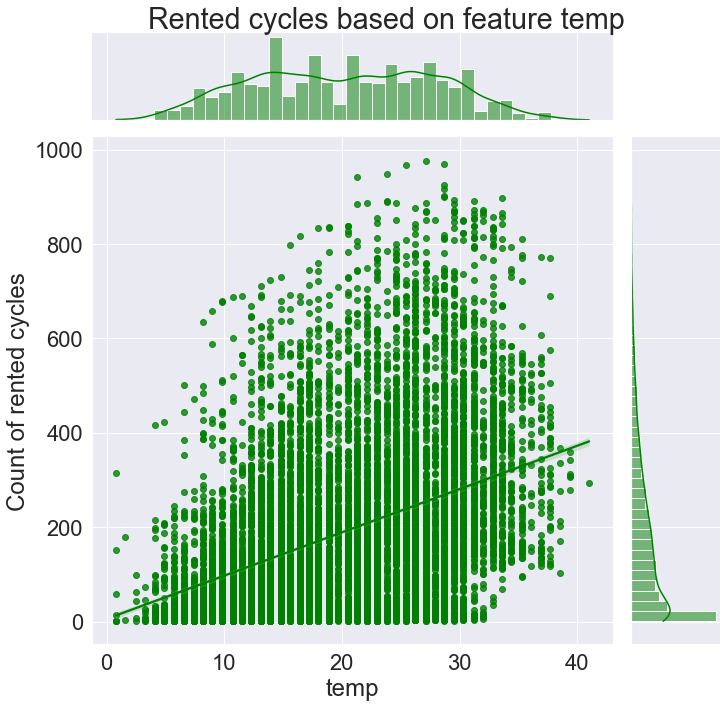

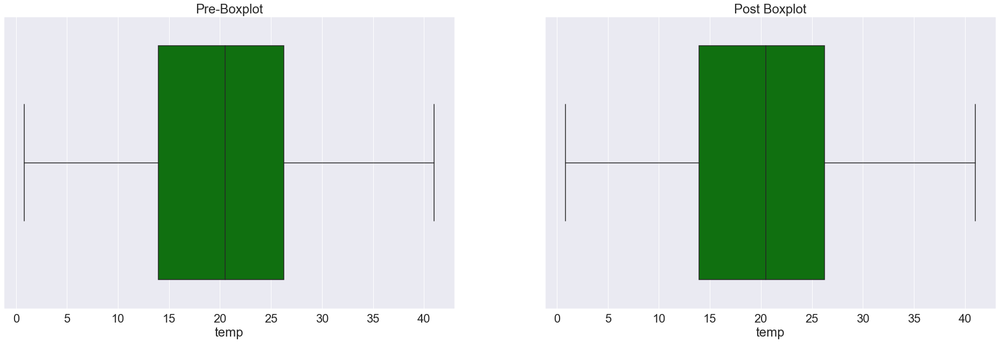




The change in standard deviation for feature temp after outlier treatment is 0.0





________________________________________atemp________________________________________







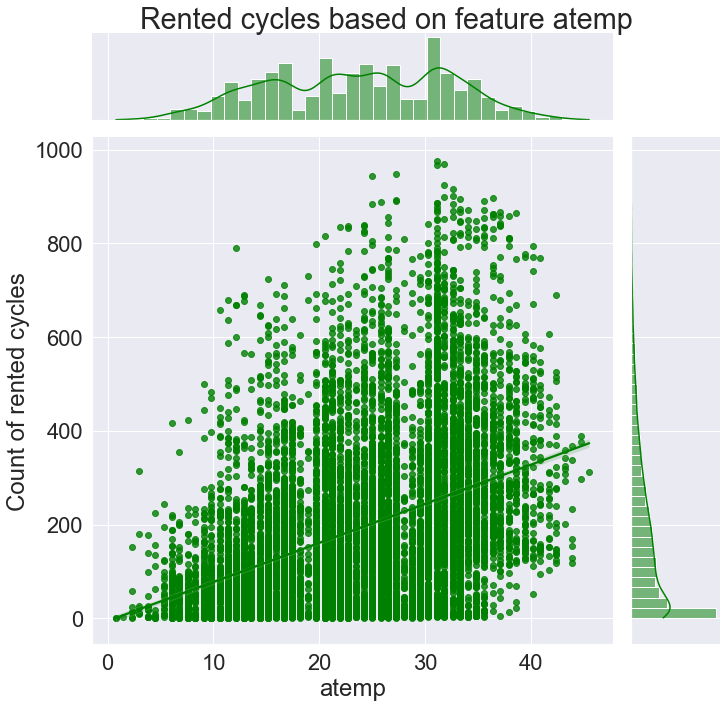

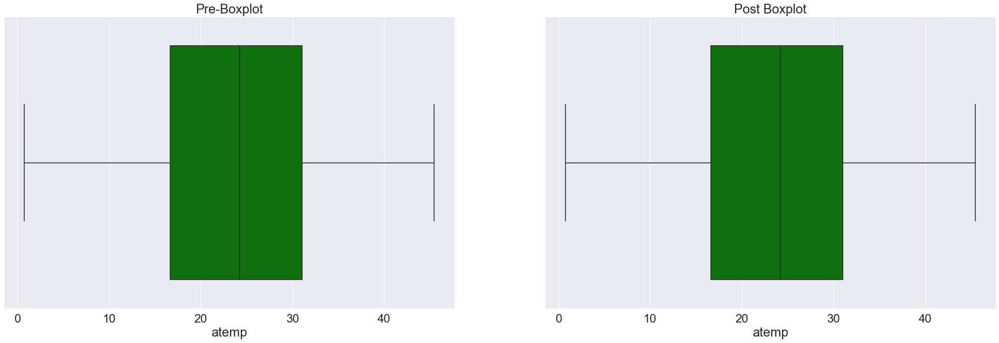




The change in standard deviation for feature atemp after outlier treatment is 0.0





________________________________________humidity________________________________________







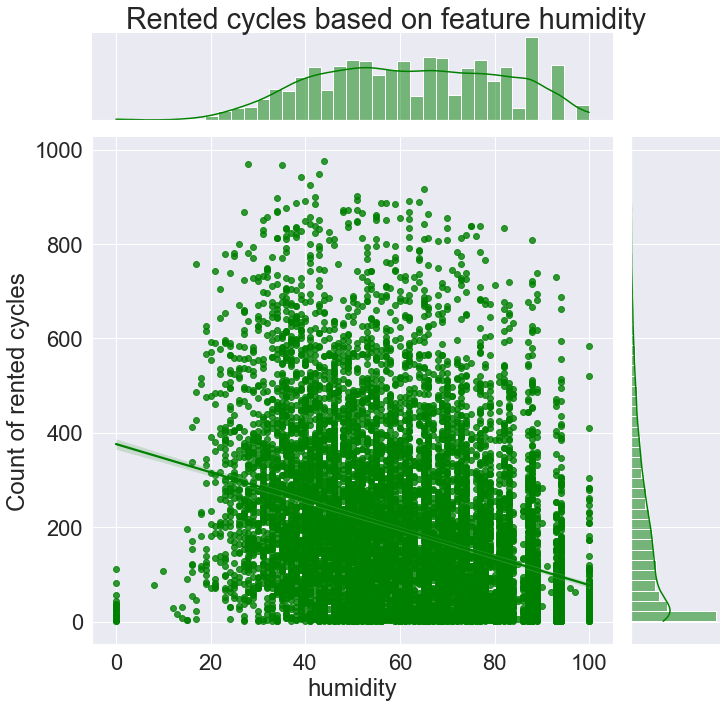

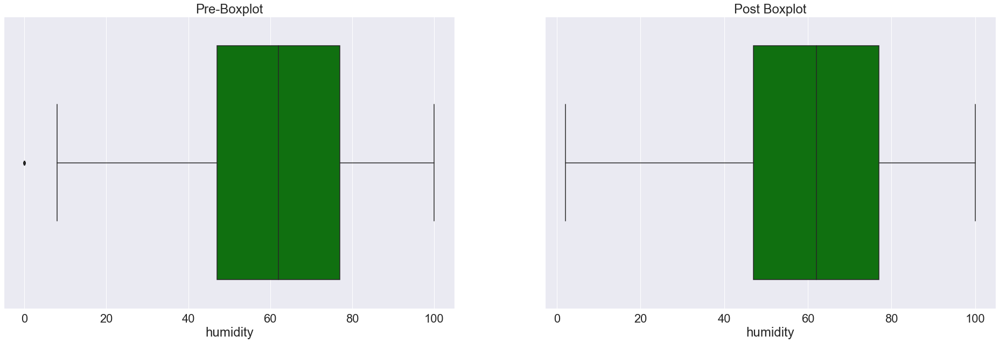




The change in standard deviation for feature humidity after outlier treatment is -0.012793373789399709


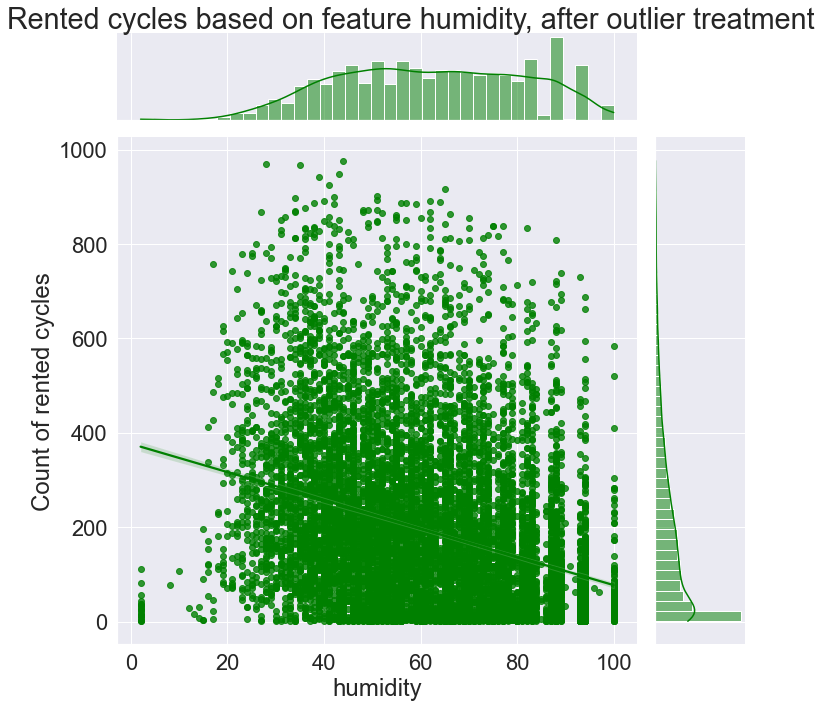






________________________________________casual________________________________________







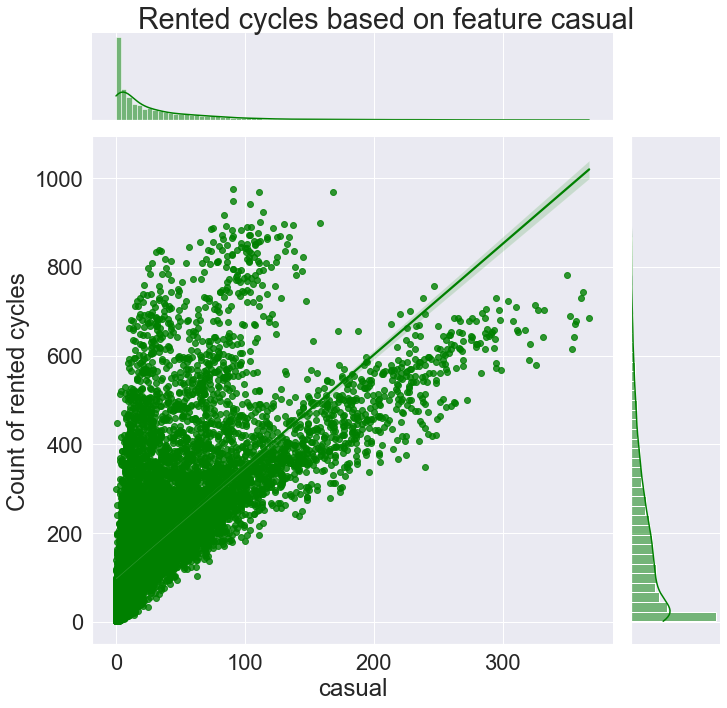

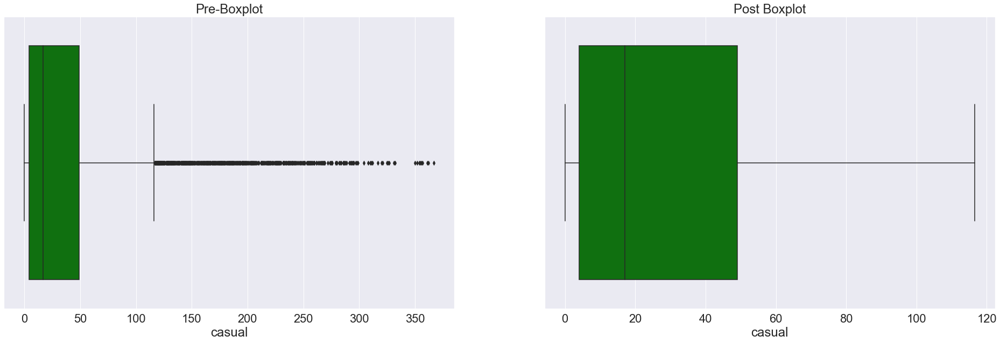




The change in standard deviation for feature casual after outlier treatment is -14.458368493640783


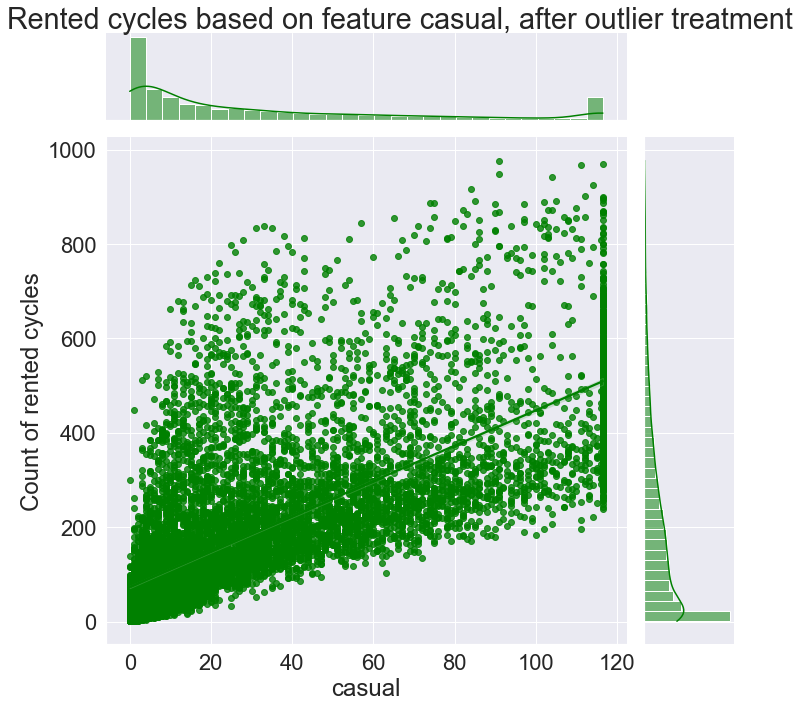






________________________________________registered________________________________________







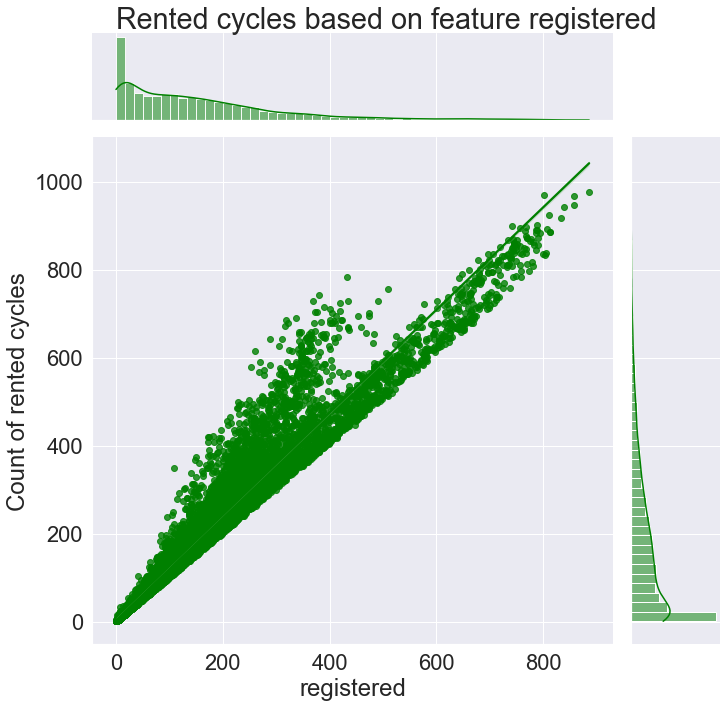

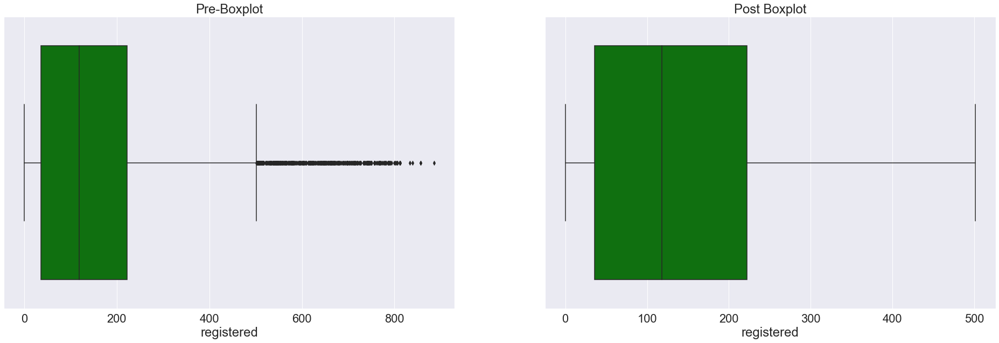




The change in standard deviation for feature registered after outlier treatment is -15.66893084560536


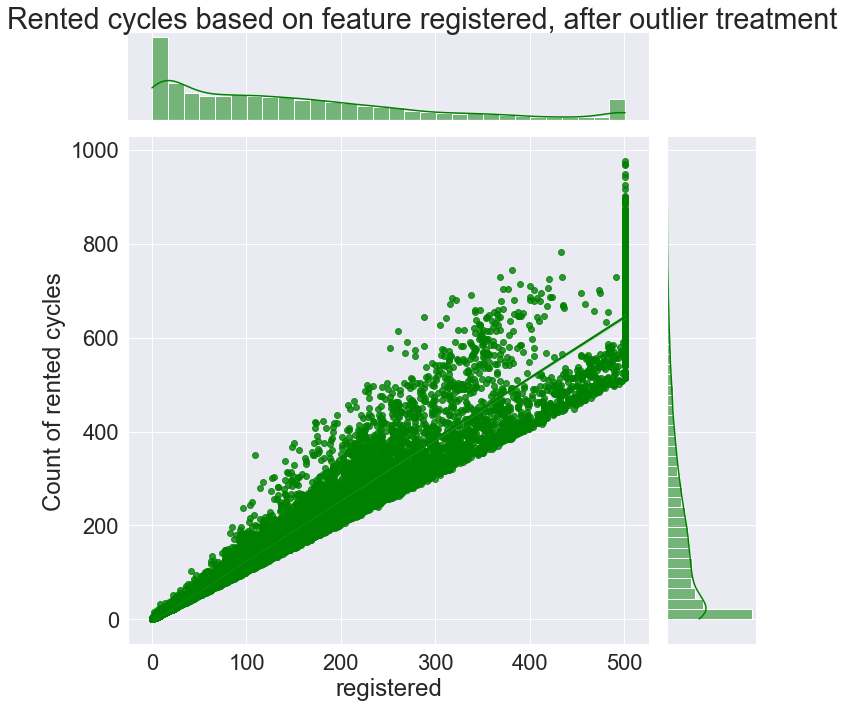

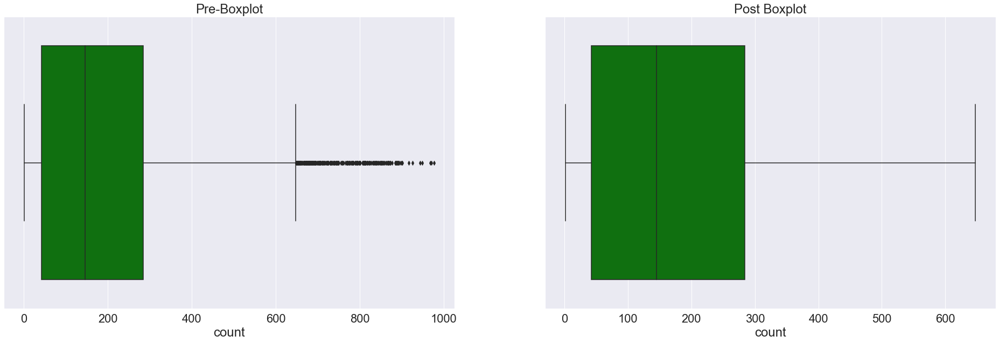




The change in standard deviation for feature count after outlier treatment is -8.72805262365938


In [19]:
# Identify the colums names containg numeric (continuous or discrete) or categorical features
df,cont, dis,cat, t=identify_feature(df)
# Treat the outliers present in the dataset
df=outlier_removal1(df,cont,dis,'count','classification','not-remove')




________________________________________season________________________________________
____________________Comparision of feature season with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

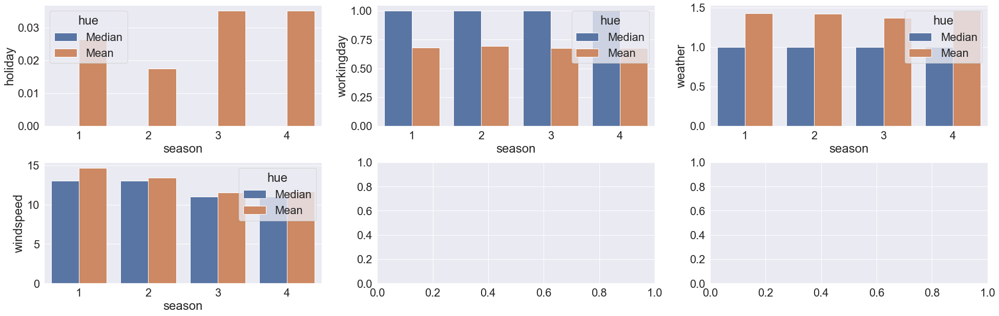




________________________________________holiday________________________________________
____________________Comparision of feature holiday with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

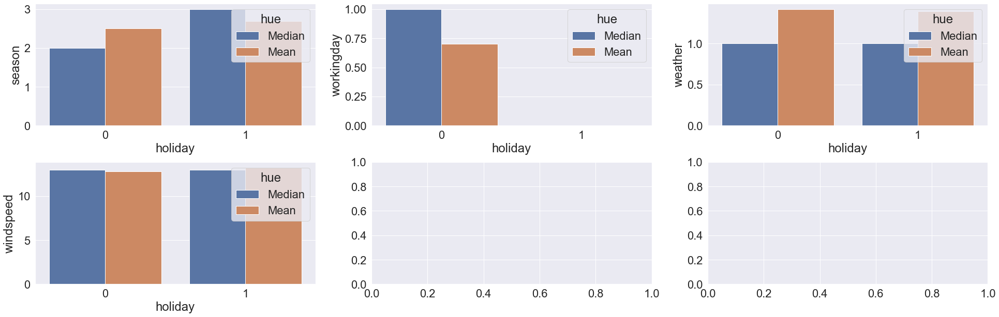




________________________________________workingday________________________________________
____________________Comparision of feature workingday with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

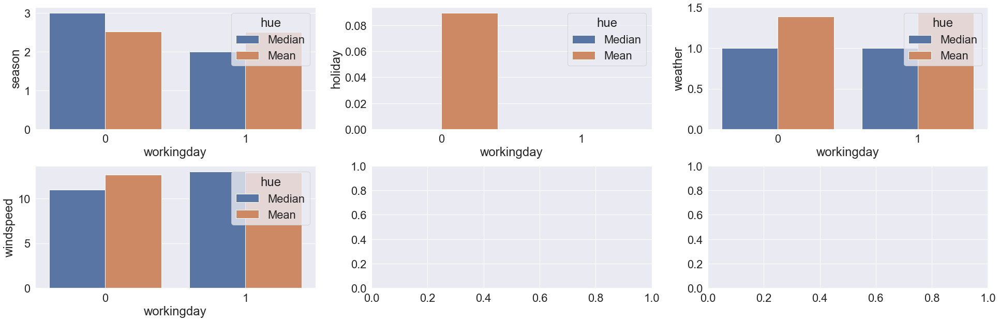




________________________________________weather________________________________________
____________________Comparision of feature weather with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

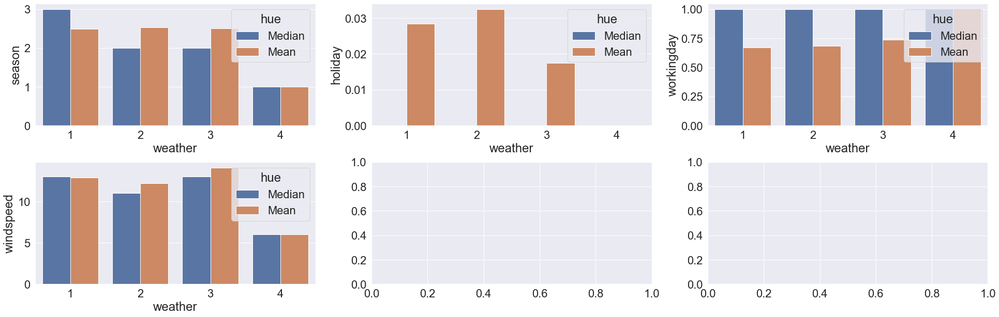




________________________________________windspeed________________________________________
____________________Comparision of feature windspeed with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

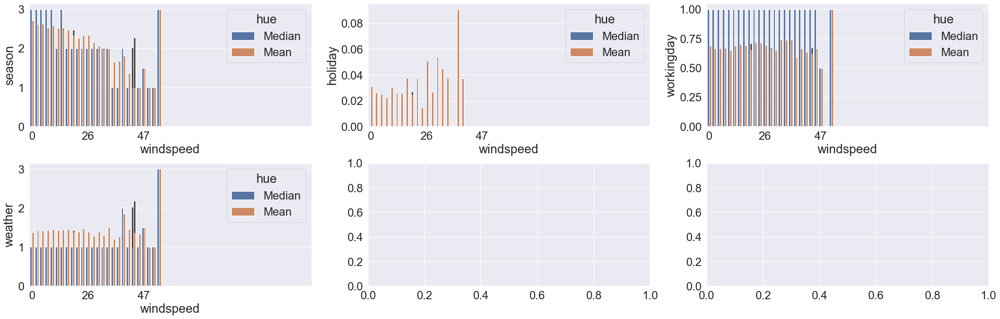




________________________________________temp________________________________________
____________________Comparision of feature temp with all the other continuous features____________________





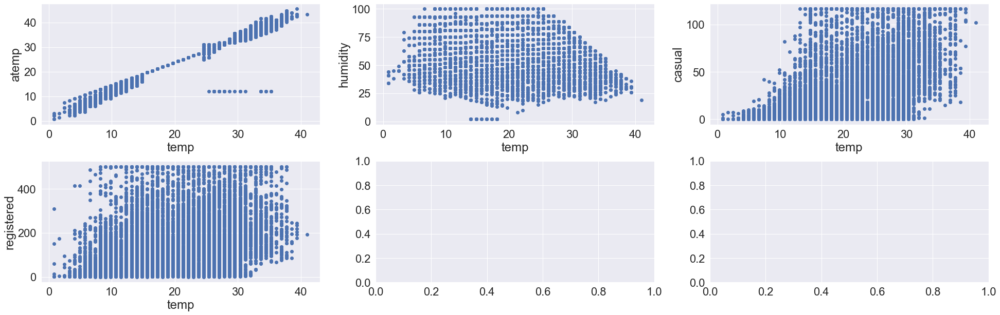




____________________Comparision of feature temp with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

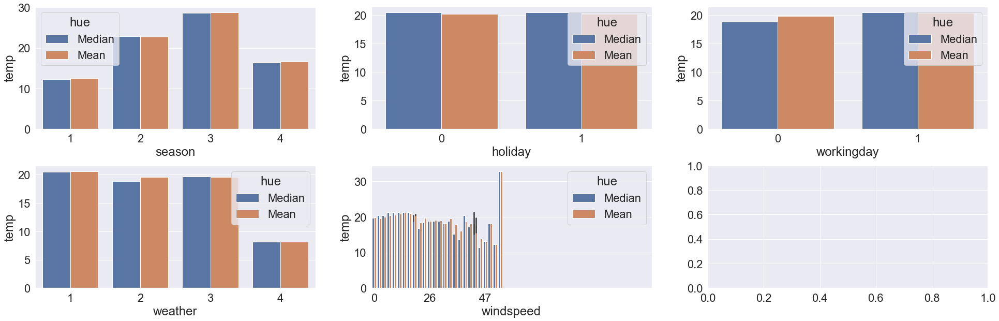




____________________Comparision of feature temp with all the other categotical features____________________


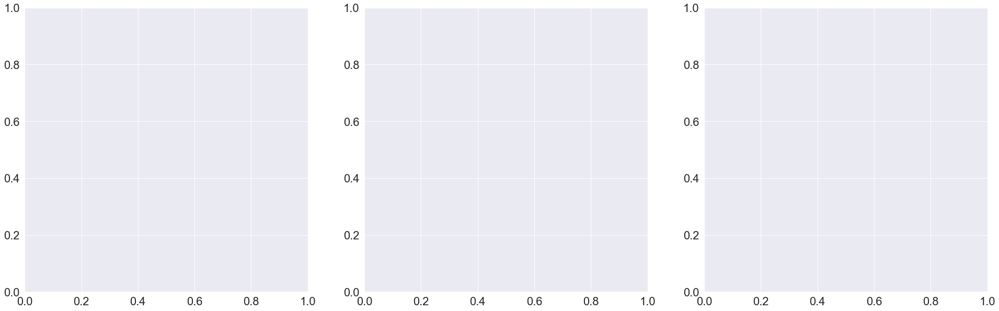




________________________________________atemp________________________________________
____________________Comparision of feature atemp with all the other continuous features____________________





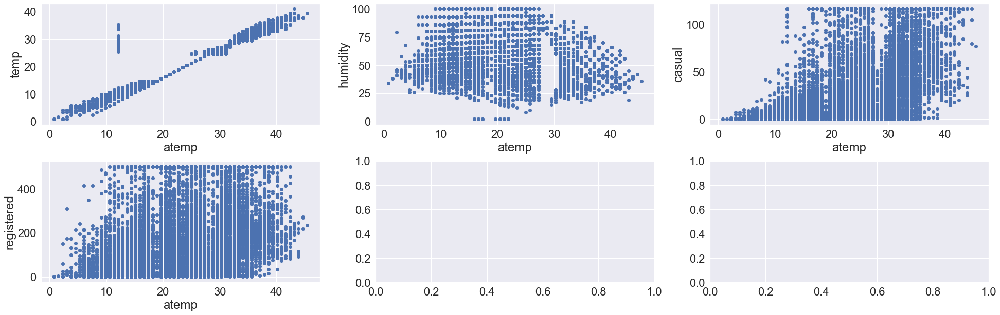




____________________Comparision of feature atemp with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

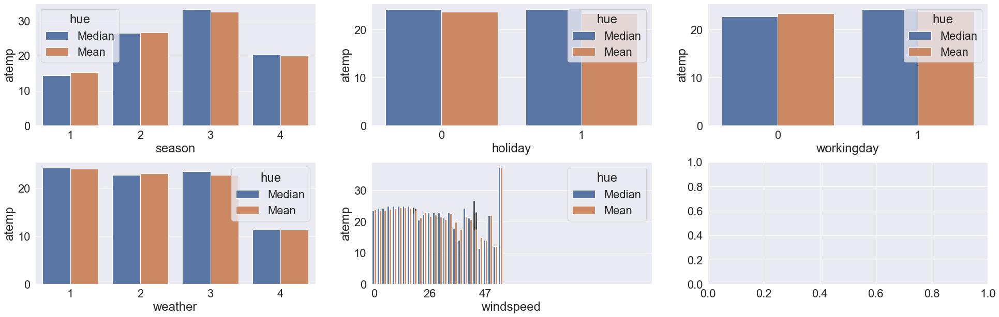




____________________Comparision of feature atemp with all the other categotical features____________________


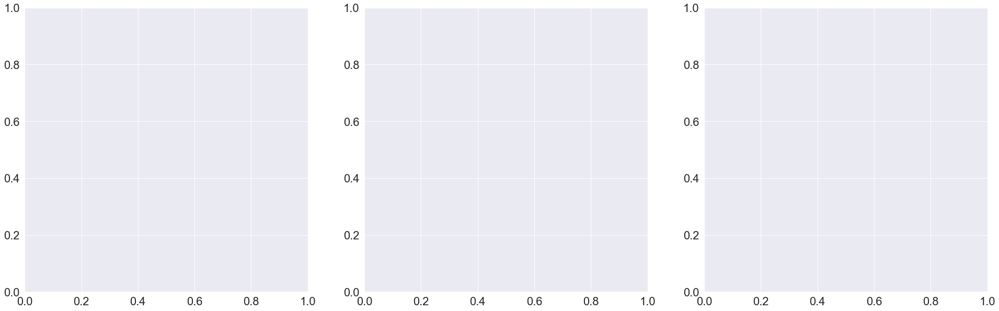




________________________________________humidity________________________________________
____________________Comparision of feature humidity with all the other continuous features____________________





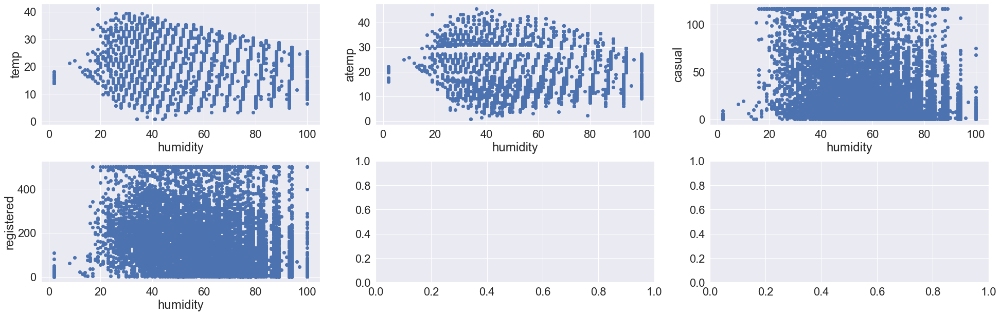




____________________Comparision of feature humidity with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

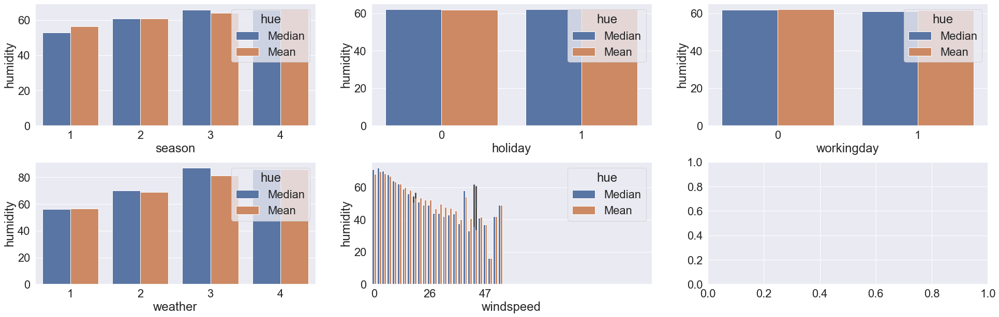




____________________Comparision of feature humidity with all the other categotical features____________________


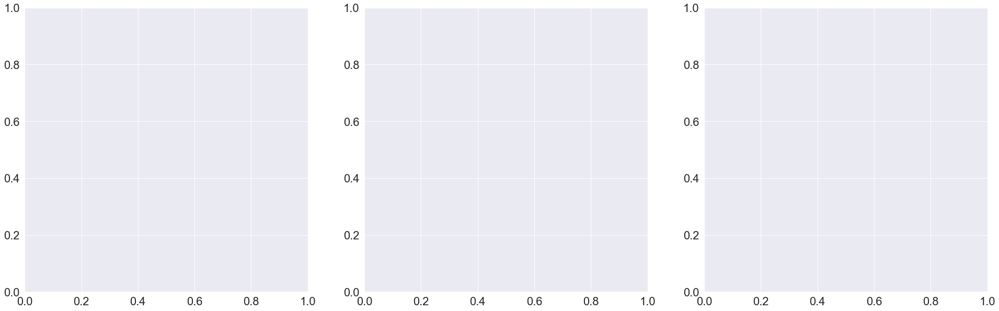




________________________________________casual________________________________________
____________________Comparision of feature casual with all the other continuous features____________________





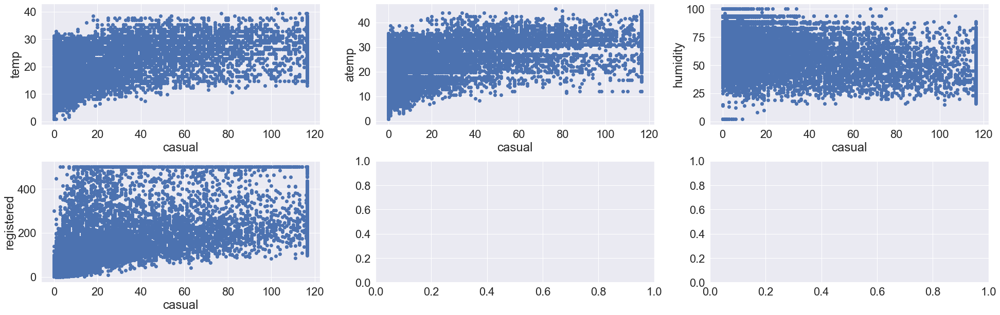




____________________Comparision of feature casual with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

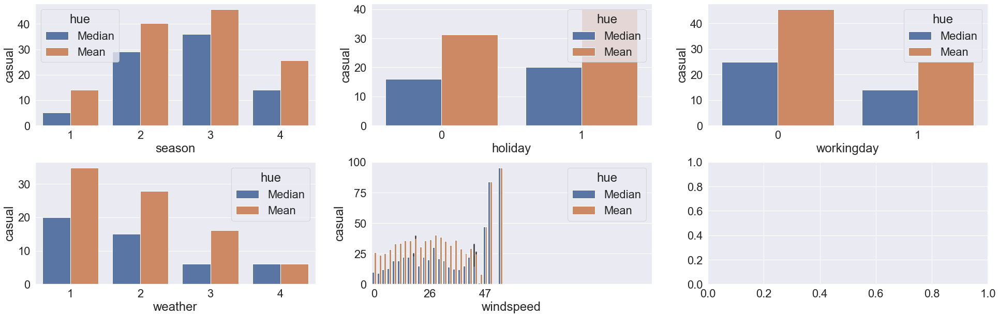




____________________Comparision of feature casual with all the other categotical features____________________


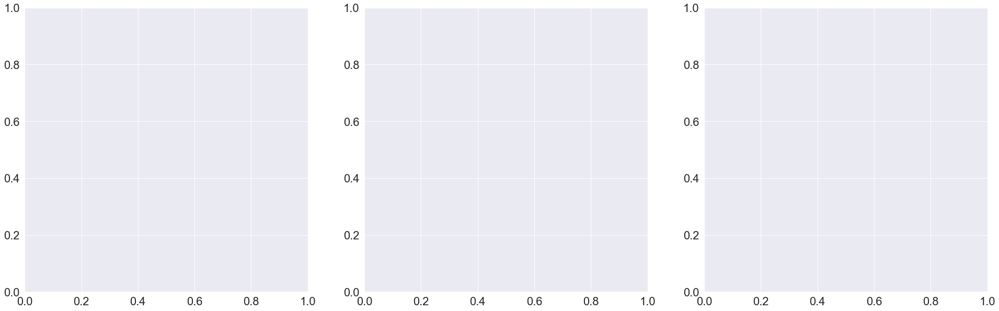




________________________________________registered________________________________________
____________________Comparision of feature registered with all the other continuous features____________________





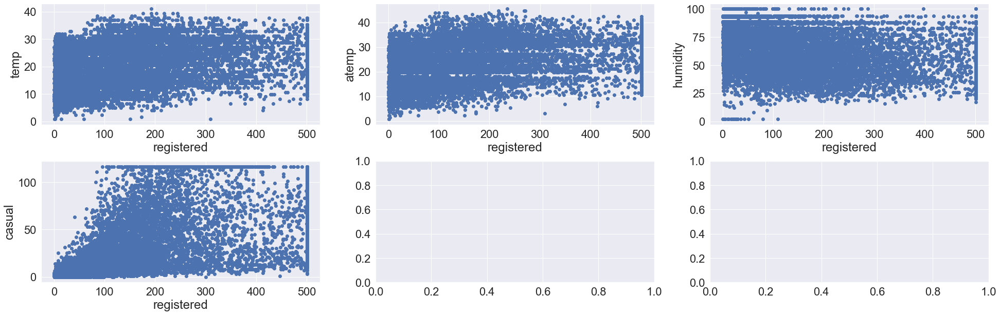




____________________Comparision of feature registered with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

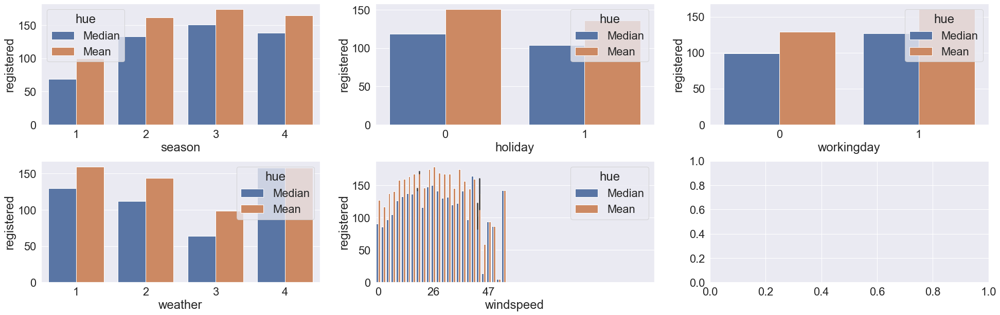




____________________Comparision of feature registered with all the other categotical features____________________


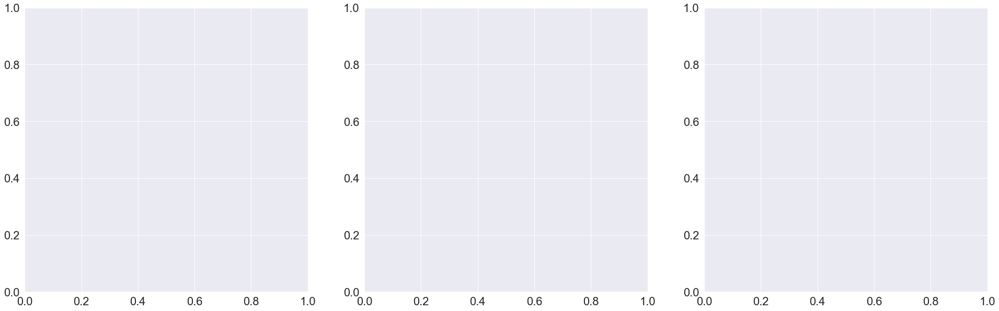




________________________________________datetime_hour________________________________________
____________________Comparision of feature datetime_hour with all the other continuous features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

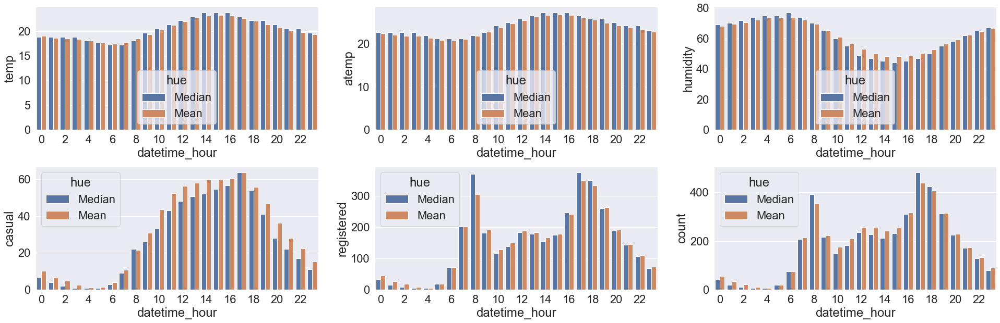

____________________Comparision of feature datetime_hour with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

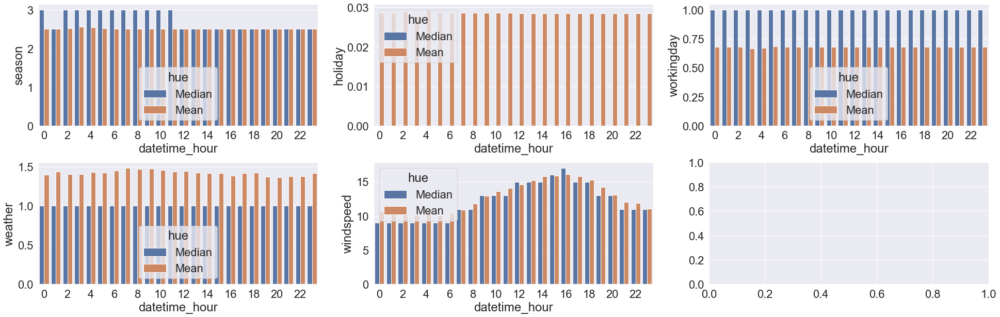




________________________________________datetime_year________________________________________
____________________Comparision of feature datetime_year with all the other continuous features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

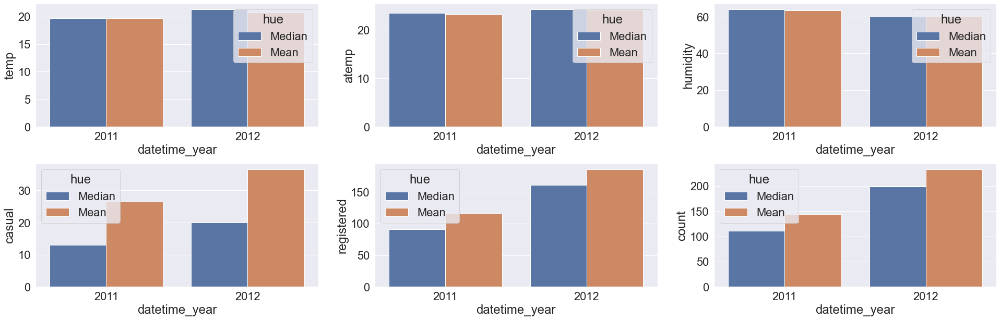

____________________Comparision of feature datetime_year with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

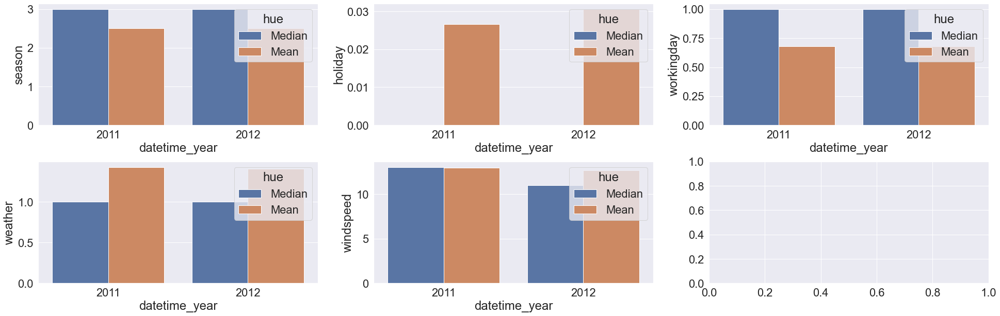




________________________________________datetime_month________________________________________
____________________Comparision of feature datetime_month with all the other continuous features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

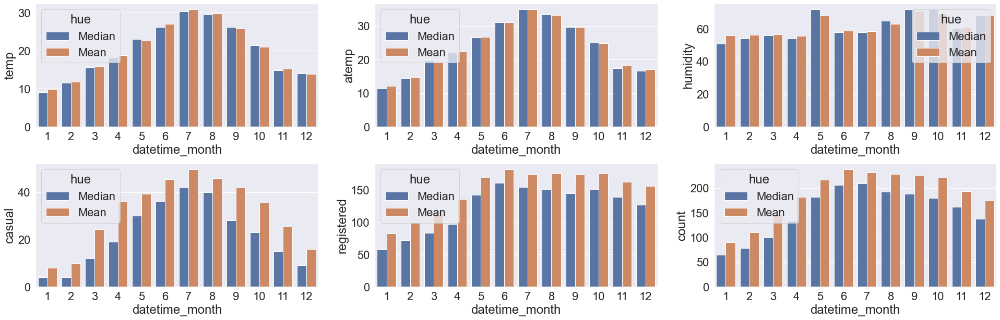

____________________Comparision of feature datetime_month with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

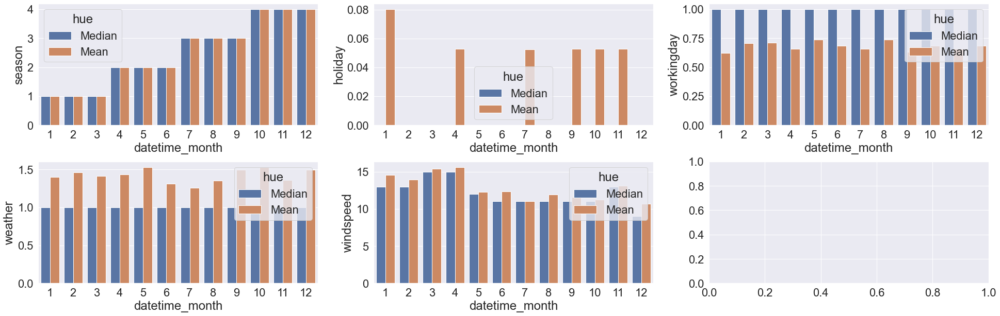

In [20]:
# Plot the feature with other independent features
cont2=cross_visualization(df,cont,dis,cat,t)






________________________________________Plots between continuous and discrete features________________________________________
________________________________________temp________________________________________







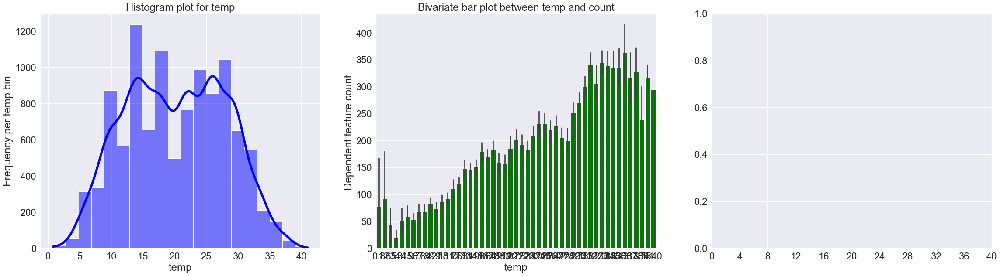

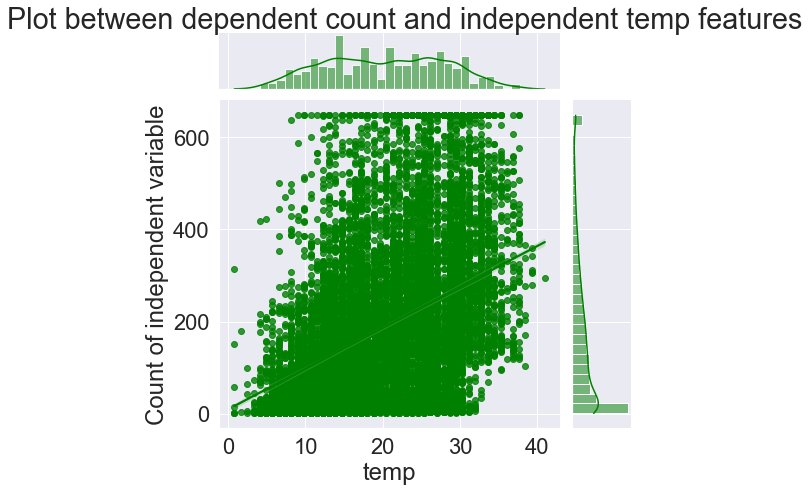






________________________________________Plots between continuous and discrete features________________________________________
________________________________________atemp________________________________________







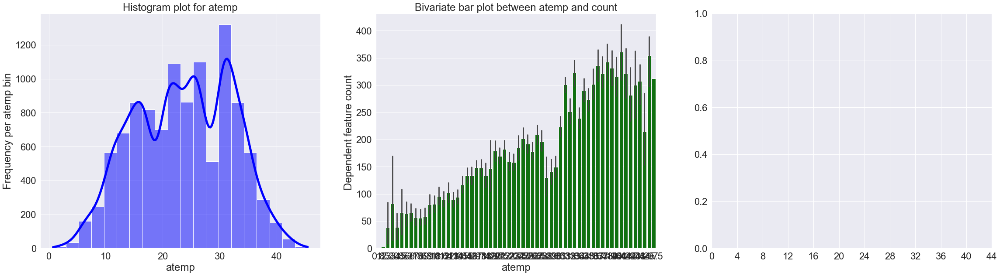

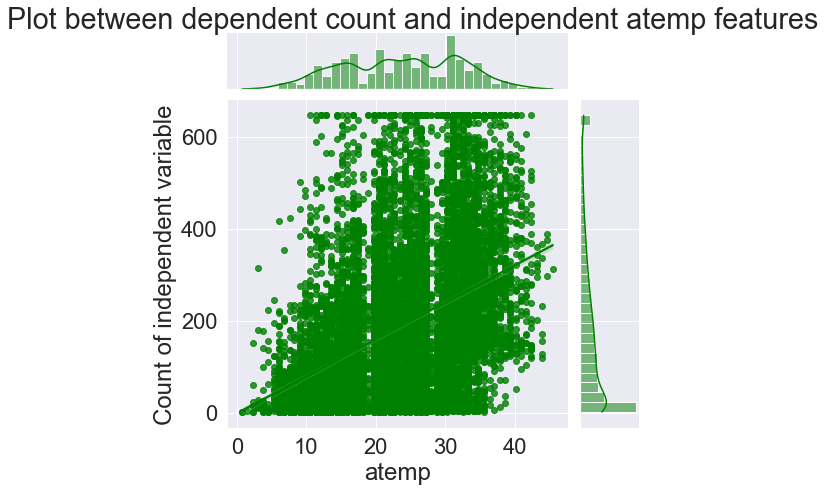






________________________________________Plots between continuous and discrete features________________________________________
________________________________________humidity________________________________________







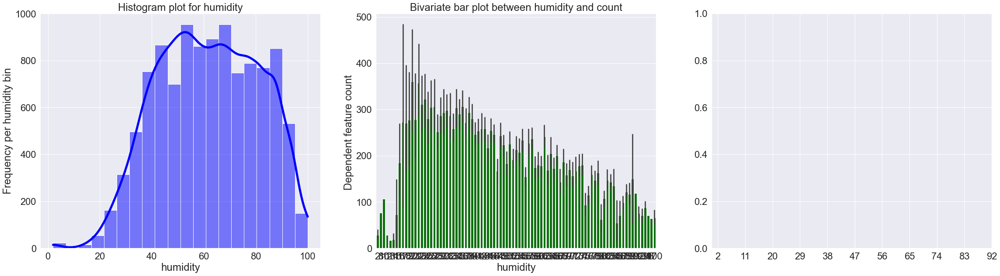

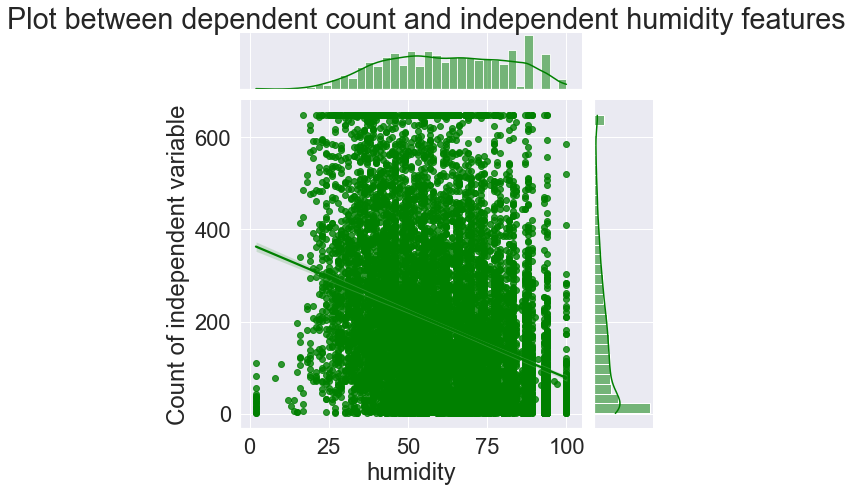






________________________________________Plots between continuous and discrete features________________________________________
________________________________________casual________________________________________







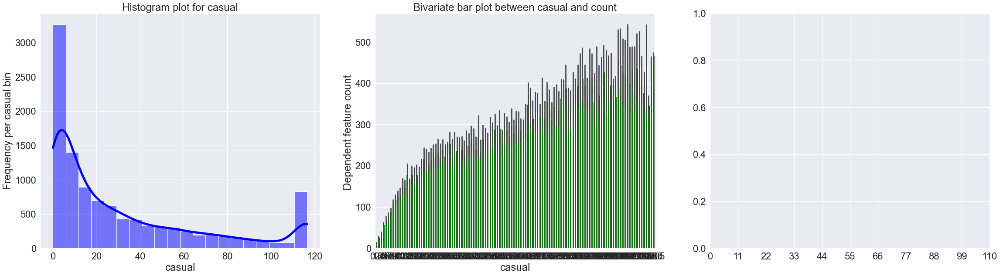

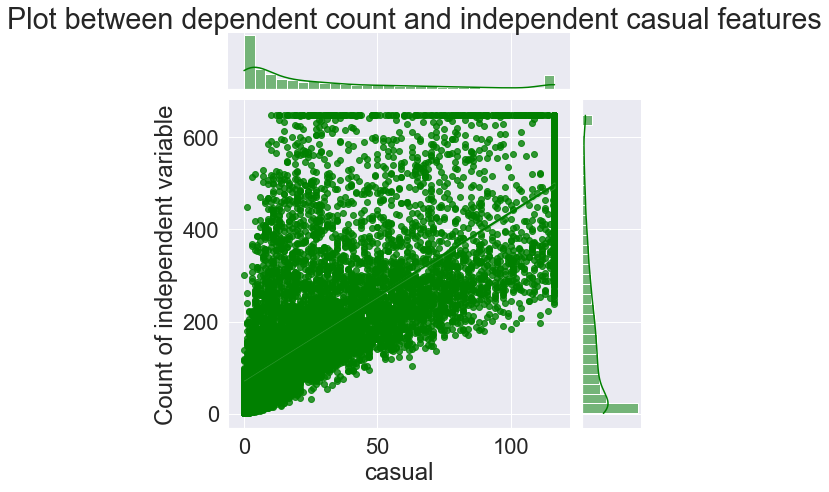






________________________________________Plots between continuous and discrete features________________________________________
________________________________________registered________________________________________







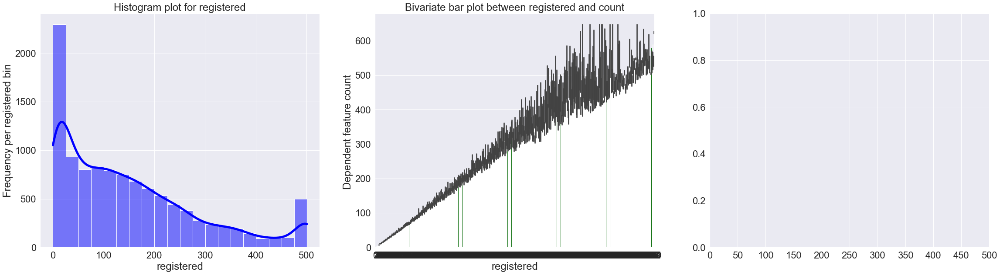

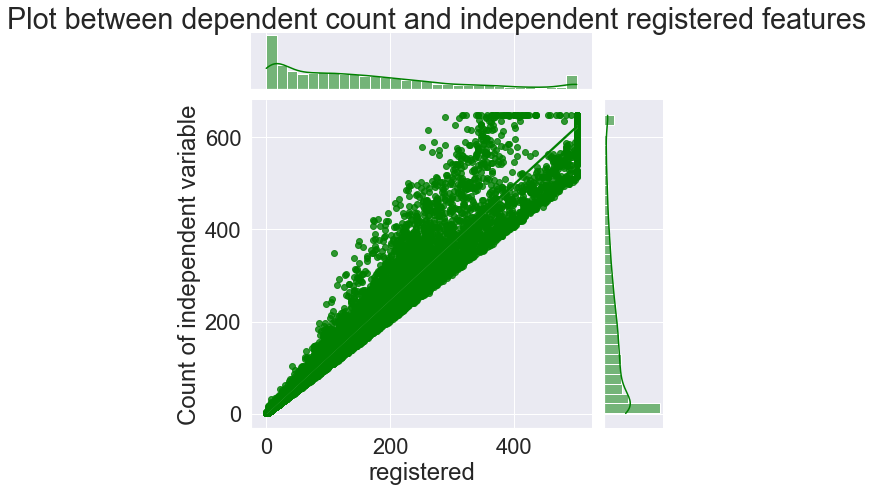






________________________________________Plots between continuous and discrete features________________________________________
________________________________________season________________________________________







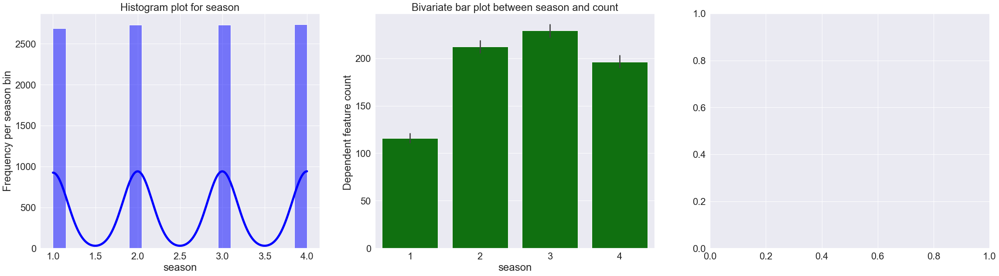

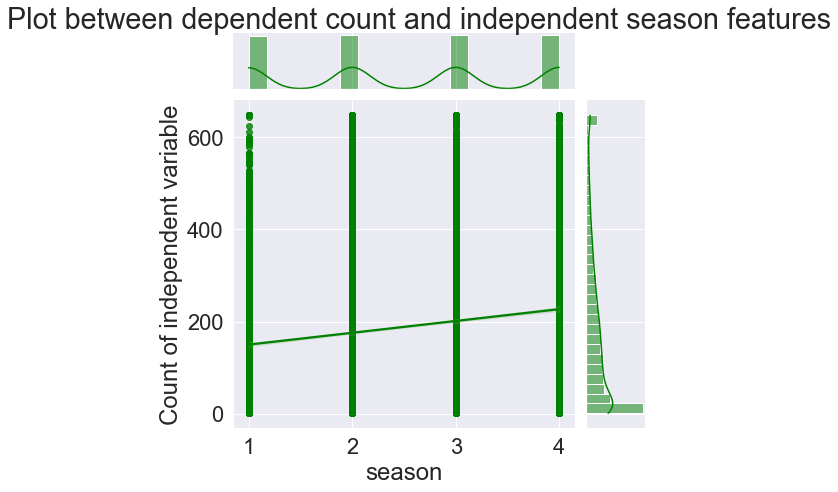






________________________________________Plots between continuous and discrete features________________________________________
________________________________________holiday________________________________________







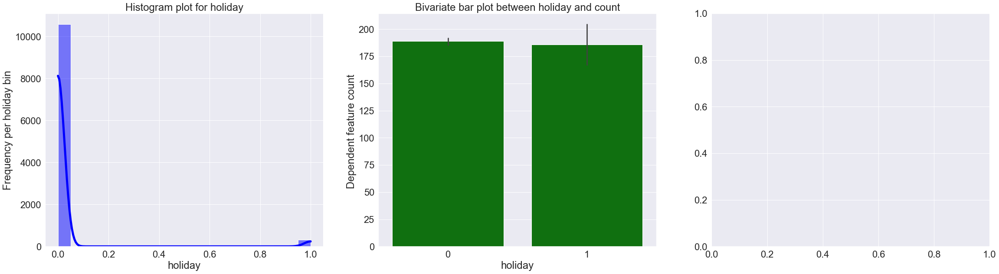

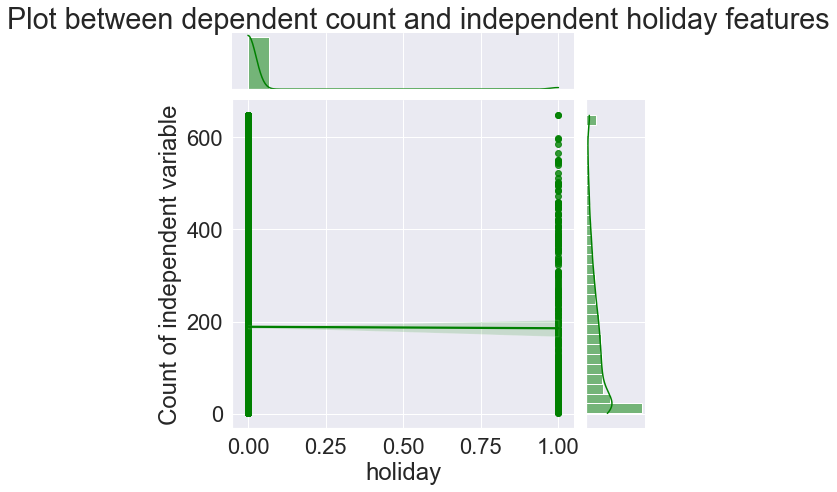






________________________________________Plots between continuous and discrete features________________________________________
________________________________________workingday________________________________________







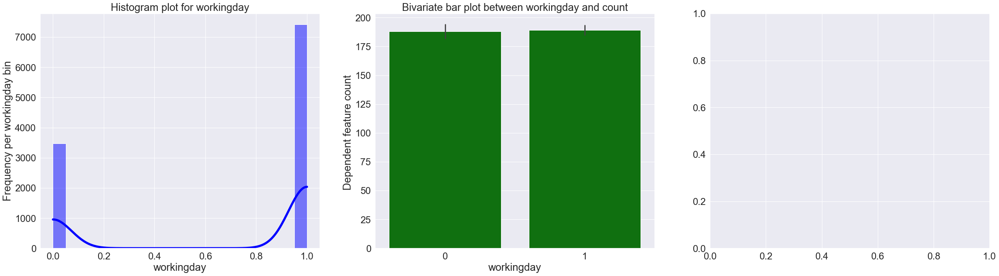

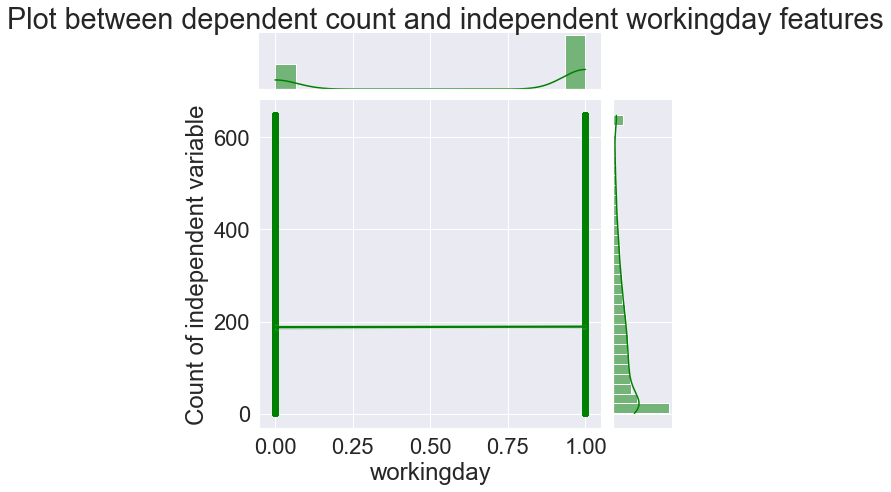






________________________________________Plots between continuous and discrete features________________________________________
________________________________________weather________________________________________







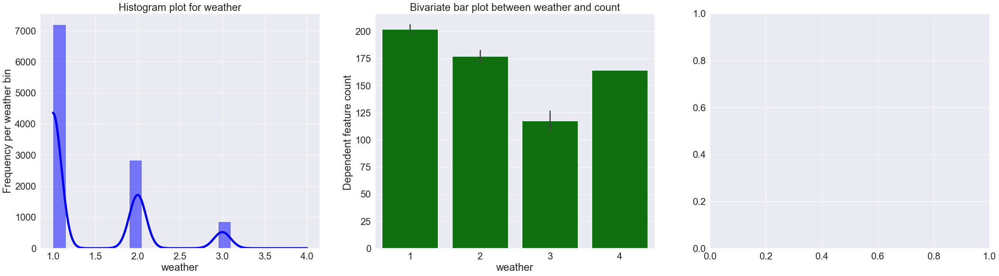

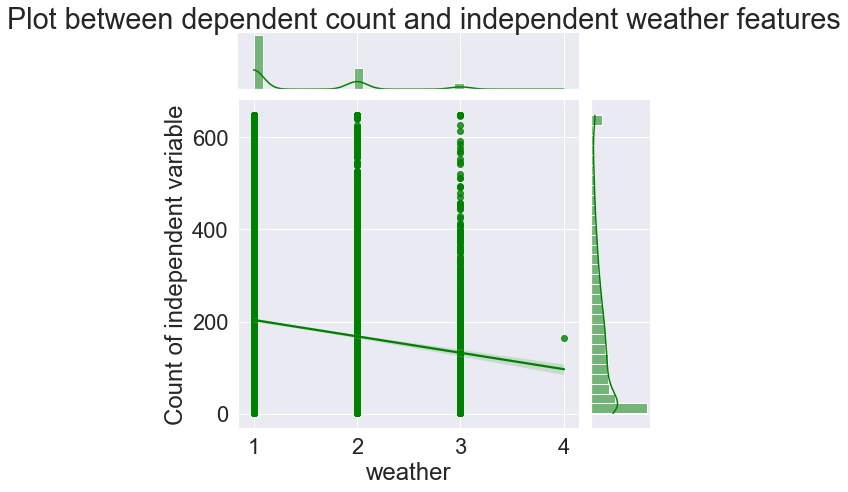






________________________________________Plots between continuous and discrete features________________________________________
________________________________________windspeed________________________________________







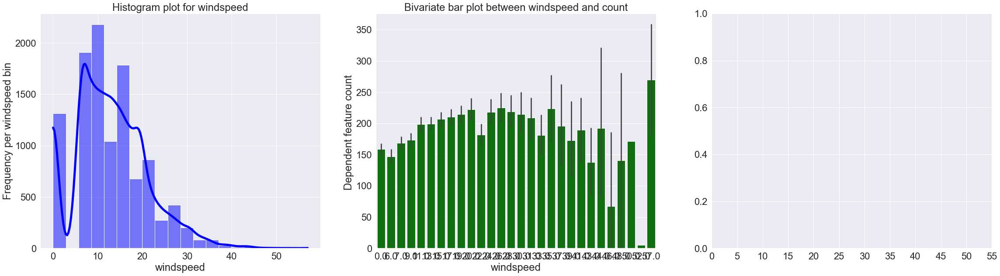

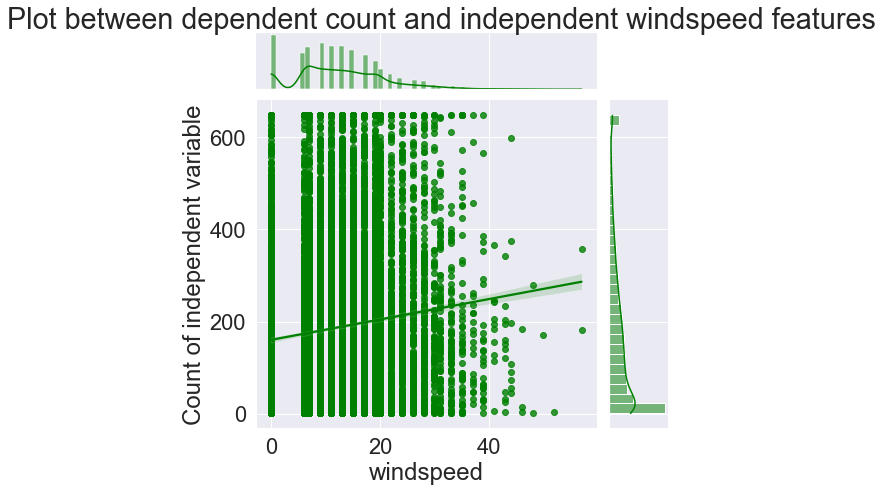






________________________________________Count of rented cycles based on datetime features________________________________________







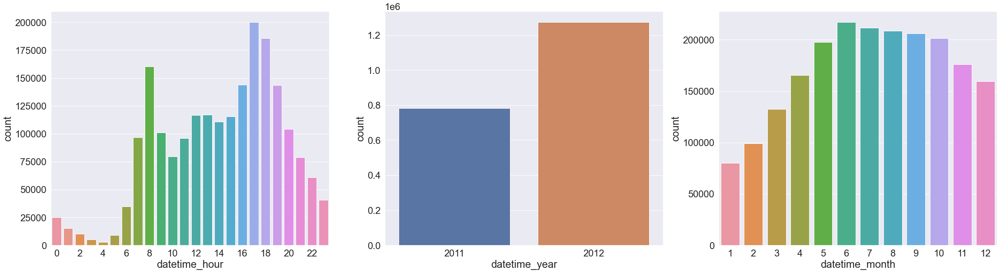

In [21]:
# Visualize the relation between dependent and independent features
dependent_independent_visualization(df,cont,dis, cat,t,'count')

In [22]:
# Create bins for the humidity feature
df['humidity_level']=np.nan
df.loc[df['humidity']<=20,'humidity_level']='low'
df.loc[(df['humidity']<=40) & (df['humidity']>20),'humidity_level']='perfect'
df.loc[(df['humidity']<=60) & (df['humidity']>40),'humidity_level']='comfortable'
df.loc[(df['humidity']<=80) & (df['humidity']>60),'humidity_level']='uncomfortable'
df.loc[df['humidity']>80,'humidity_level']='extreme'
# Create bins based on the hour feature
df['datetime_hour_level']=np.nan
df.loc[df['datetime_hour']<=6,'datetime_hour_level']='night'
df.loc[(df['datetime_hour']>20),'datetime_hour_level']='night'
df.loc[(df['datetime_hour']<=11) & (df['datetime_hour']>6),'datetime_hour_level']='morning'
df.loc[(df['datetime_hour']<=16) & (df['datetime_hour']>11),'datetime_hour_level']='afternoon'
df.loc[(df['datetime_hour']<=20) & (df['datetime_hour']>16),'datetime_hour_level']='evening'
# Create bins based on the windflow
df['windspeed_level']=np.nan
df.loc[df['windspeed']<=2,'windspeed_level']='calm'
df.loc[(df['windspeed']<=15) & (df['windspeed']>2),'windspeed_level']='light'
df.loc[(df['windspeed']<=30) & (df['windspeed']>15),'windspeed_level']='strong'
df.loc[df['windspeed']>30,'windspeed_level']='gale'
# Create bins for the dependent variable to convert the problems statement in classification
df['count_level']=np.nan
df.loc[df['count']<=50,'count_level']='low'
df.loc[(df['count']<=150) & (df['count']>50),'count_level']='fine'
df.loc[(df['count']<=300) & (df['count']>150),'count_level']='good'
df.loc[df['count']>300,'count_level']='Excellent'
# Temperature has very less unique values and act as a discrete numerical, so we convert its values in bins
df['temp']=df['temp'].astype('int')//5
df['atemp']=df['atemp'].astype('int')//5

# Perform ordinal encoding on dependent feature
cat_trans1={'one_hot_encoding':[],'frequency_encoding':[],'mean_encoding':[],'target_guided_ordinal_encoding':{'low':0,'fine':1,'good':2,'Excellent':3}}
y=categorical_transformation(df['count_level'],cat_trans1)

# Perform encoding on categorical features
cat_trans={'one_hot_encoding':['season','humidity_level','weather','datetime_year','windspeed_level','datetime_hour_level'],'frequency_encoding':[],'mean_encoding':[],'target_guided_ordinal_encoding':{}}
df=categorical_transformation(df,cat_trans)

# Drop unnecessary features
df.drop(['humidity', 'windspeed','casual', 'registered', 'count', 'datetime_hour'],axis=1,inplace=True)
x=df.drop('count_level',axis=1)



# Classification with feature selection

In [23]:
# Perform feature selection, where input and output are in the categorical from
feature_selection_tech={'in_num_out_num':{'linear':['pearson'],'non-linear':['spearman']},
                   'in_num_out_cat':{'linear':['ANOVA'],'non-linear':['kendall']},
                   'in_cat_out_num':{'linear':['ANOVA'],'non-linear':['kendall']},
                   'in_cat_out_cat':{'chi_square_test':True,'mutual_info':True},}
x,feature_list=feature_selection(x,y, 0.7, feature_selection_tech,'chi_square_test', 'in_cat_out_cat')
feature_list=feature_list.sort_values(by=0, ascending=False)
feature_list

 You have to manually delete the Highly corelated features from the dataset


,0
weather_4,4.165400e-01
holiday,3.037867e-01
humidity_level_low,8.699641e-02
windspeed_level_gale,4.404159e-03
season_4,3.736701e-03
weather_2,1.124283e-03
workingday,1.083217e-05
windspeed_level_light,8.083966e-06
season_2,3.031995e-11
humidity_level_uncomfortable,8.639393e-14


In [24]:
# Drop unnecessary features
x.drop(list(feature_list.index[:6]),axis=1,inplace=True)
x.drop('datetime_hour_level_night',axis=1,inplace=True)

In [25]:
# Split the dataset in train and test
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=0)

# Initialize the GridSearchCV
param_test = {'n_estimators': [200, 400, 600],'max_features': ['auto', 'sqrt', 'log2'],'max_depth' : [4,8,12,16],'criterion' :['gini', 'entropy']}
search=GridSearchCV(RandomForestClassifier(),param_grid = param_test, scoring='accuracy', cv=10)
# perform the search
results = search.fit(x_train, y_train)


In [26]:
# summarize best
print('Best Mean Accuracy: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)

Best Mean Accuracy: 0.595
Best Config: {'criterion': 'gini', 'max_depth': 12, 'max_features': 'log2', 'n_estimators': 600}


In [30]:
print('Predicting score {a}'.format(a=results.score(x_test,y_test)))

Predicting score 0.5998162890385793


# Classification without feature selection






________________________________________temp________________________________________







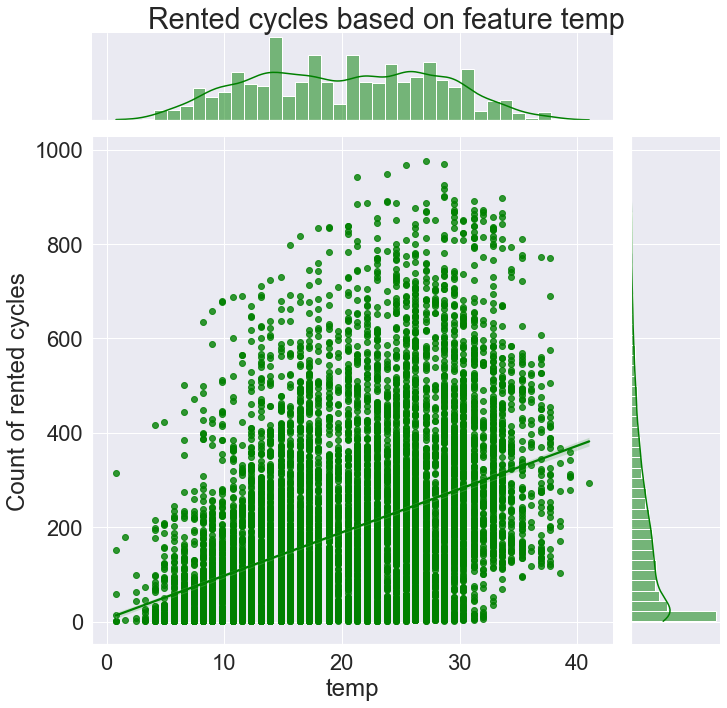

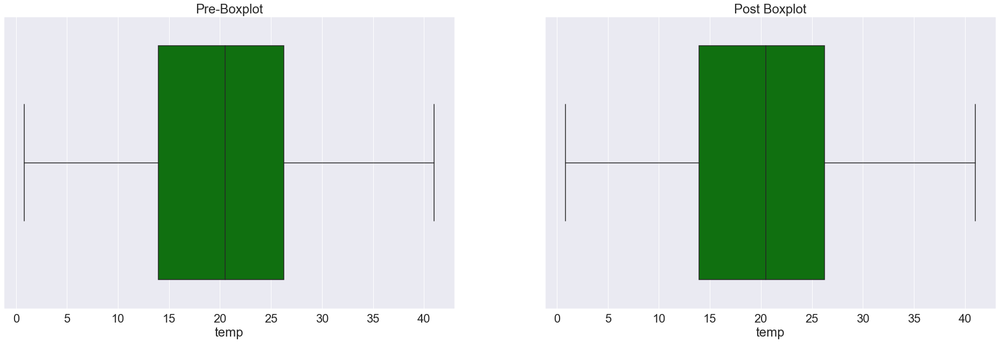




The change in standard deviation for feature temp after outlier treatment is 0.0





________________________________________atemp________________________________________







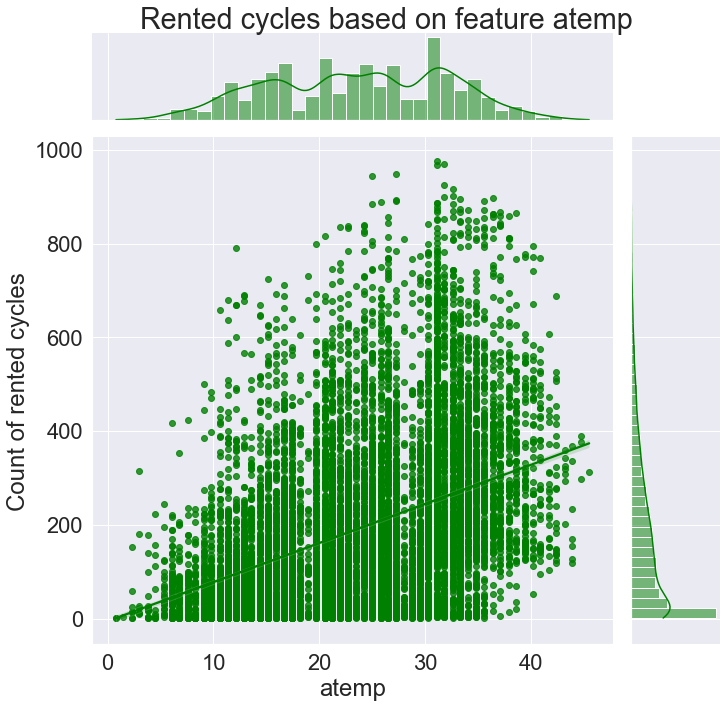

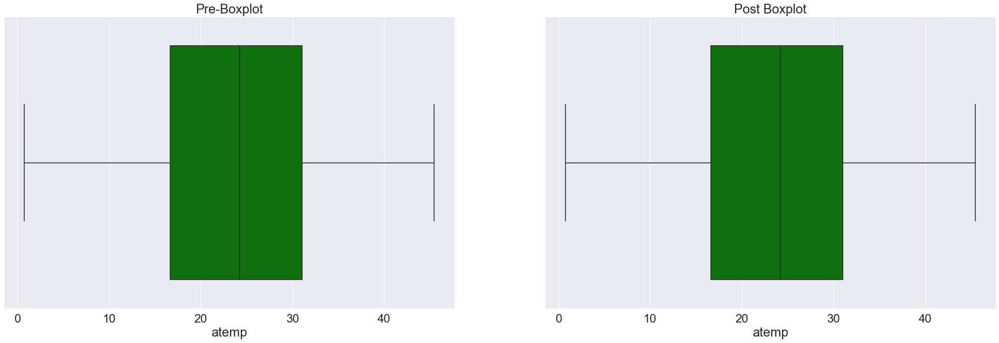




The change in standard deviation for feature atemp after outlier treatment is 0.0





________________________________________humidity________________________________________







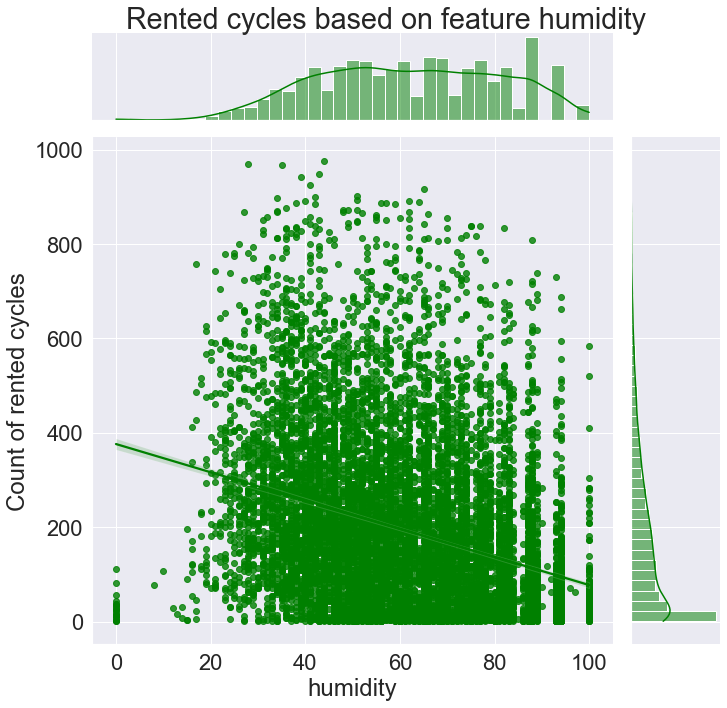

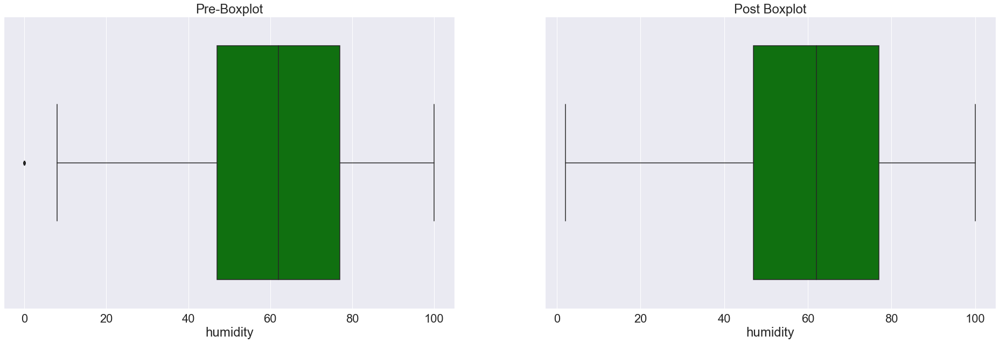




The change in standard deviation for feature humidity after outlier treatment is -0.012793373789399709


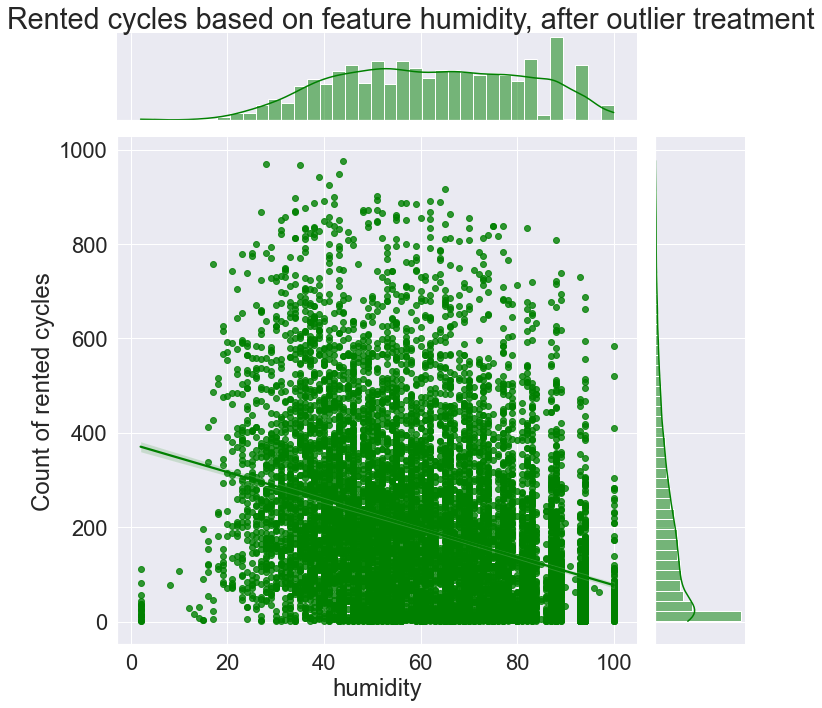






________________________________________casual________________________________________







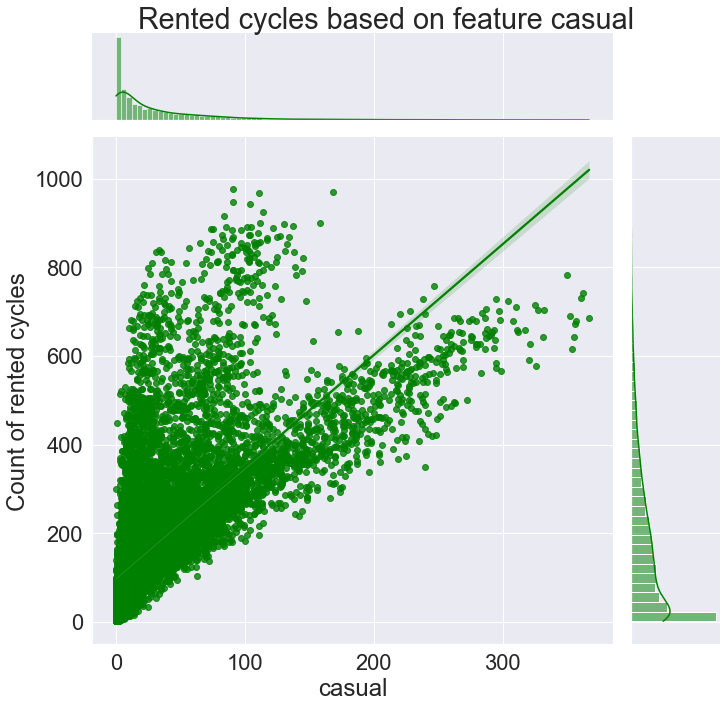

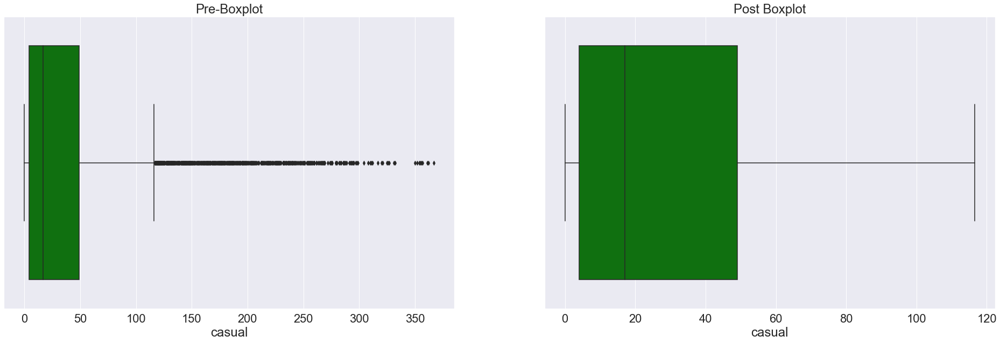




The change in standard deviation for feature casual after outlier treatment is -14.458368493640783


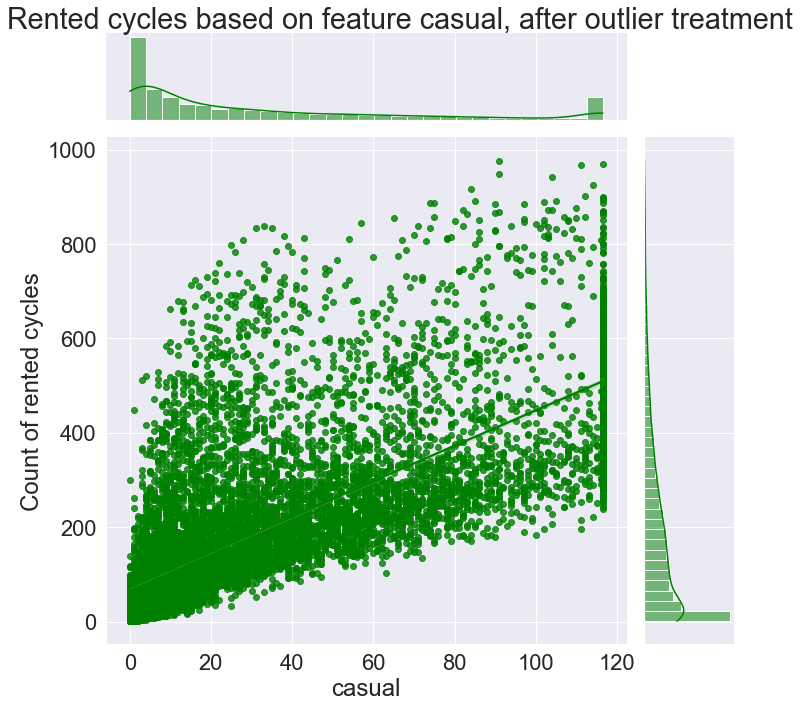






________________________________________registered________________________________________







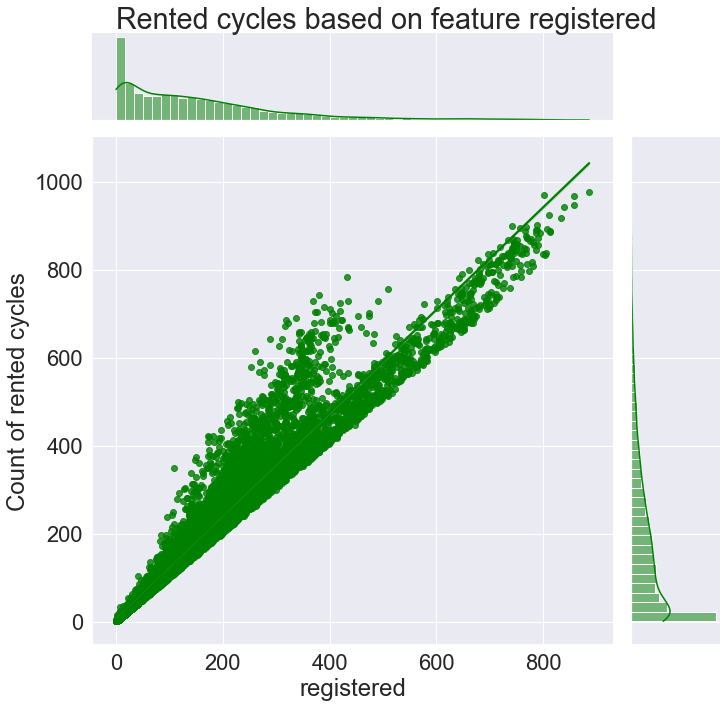

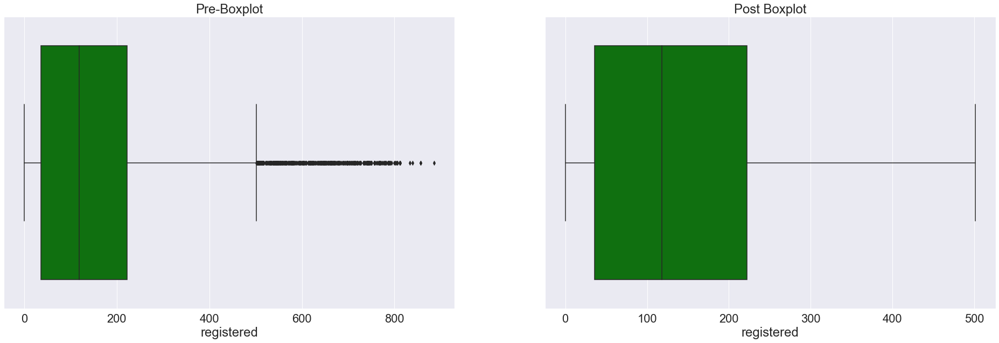




The change in standard deviation for feature registered after outlier treatment is -15.66893084560536


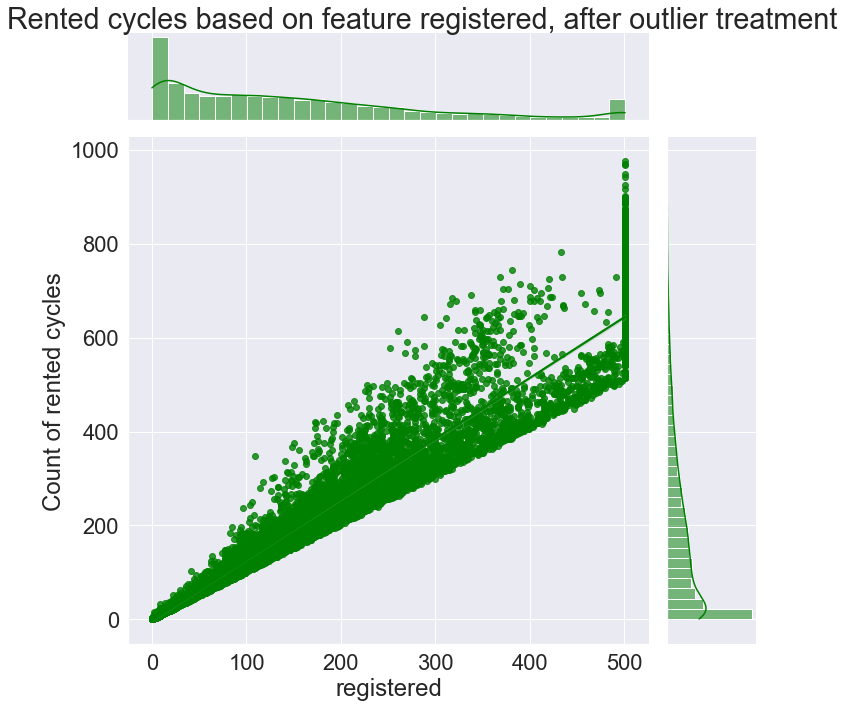

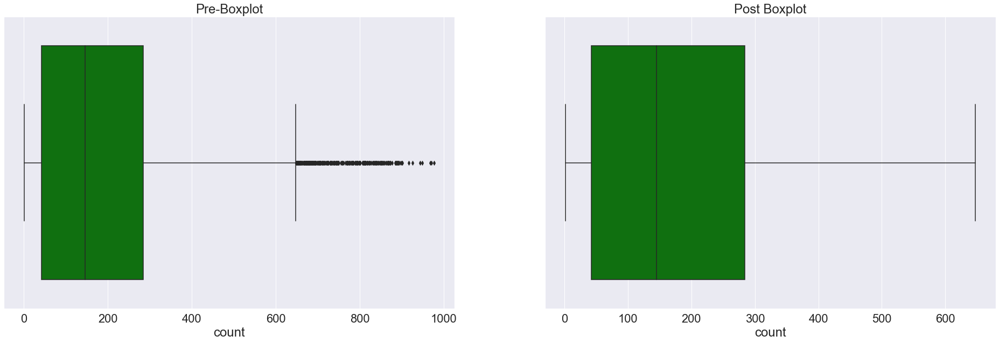




The change in standard deviation for feature count after outlier treatment is -8.72805262365938
Best Mean Accuracy: 0.643
Best Config: {'criterion': 'gini', 'max_depth': 12, 'max_features': 'auto', 'n_estimators': 600}


In [31]:
# Read the dataset
df = pd.read_csv('train_bikes.csv')

# Identify the colums names containg numeric (continuous or discrete) or categorical features
df,cont, dis,cat, t=identify_feature(df)

# Treat the outliers present in the dataset
df=outlier_removal1(df,cont,dis,'count','classification','not-remove')

# Create bins for the humidity feature
df['humidity_level']=np.nan
df.loc[df['humidity']<=20,'humidity_level']='low'
df.loc[(df['humidity']<=40) & (df['humidity']>20),'humidity_level']='perfect'
df.loc[(df['humidity']<=60) & (df['humidity']>40),'humidity_level']='comfortable'
df.loc[(df['humidity']<=80) & (df['humidity']>60),'humidity_level']='uncomfortable'
df.loc[df['humidity']>80,'humidity_level']='extreme'
df['datetime_hour_level']=np.nan
# Create bins based on the hour feature
df.loc[df['datetime_hour']<=6,'datetime_hour_level']='night'
df.loc[(df['datetime_hour']>20),'datetime_hour_level']='night'
df.loc[(df['datetime_hour']<=11) & (df['datetime_hour']>6),'datetime_hour_level']='morning'
df.loc[(df['datetime_hour']<=16) & (df['datetime_hour']>11),'datetime_hour_level']='afternoon'
df.loc[(df['datetime_hour']<=20) & (df['datetime_hour']>16),'datetime_hour_level']='evening'
# Create bins based on the windflow
df['windspeed_level']=np.nan
df.loc[df['windspeed']<=2,'windspeed_level']='calm'
df.loc[(df['windspeed']<=15) & (df['windspeed']>2),'windspeed_level']='light'
df.loc[(df['windspeed']<=30) & (df['windspeed']>15),'windspeed_level']='strong'
df.loc[df['windspeed']>30,'windspeed_level']='gale'
# Create bins for the dependent variable to convert the problems statement in classification
df['count_level']=np.nan
df.loc[df['count']<=50,'count_level']='low'
df.loc[(df['count']<=150) & (df['count']>50),'count_level']='fine'
df.loc[(df['count']<=300) & (df['count']>150),'count_level']='good'
df.loc[df['count']>300,'count_level']='Excellent'

# Temperature has very less unique values and act as a discrete numerical, so we convert its values in bins
df['temp']=df['temp'].astype('int')//5
df['atemp']=df['atemp'].astype('int')//5

# Perform ordinal encoding on dependent feature
cat_trans1={'one_hot_encoding':[],'frequency_encoding':[],'mean_encoding':[],'target_guided_ordinal_encoding':{'low':0,'fine':1,'good':2,'Excellent':3}}
y=categorical_transformation(df['count_level'],cat_trans1)

# Perform encoding on categorical features
cat_trans={'one_hot_encoding':['season','humidity_level','weather','datetime_year','windspeed_level','datetime_hour_level'],'frequency_encoding':[],'mean_encoding':[],'target_guided_ordinal_encoding':{}}
df=categorical_transformation(df,cat_trans)

# Drop unnecessary features
df.drop(['humidity', 'windspeed','casual', 'registered', 'count', 'datetime_hour'],axis=1,inplace=True)
x=df.drop('count_level',axis=1)

# Split the dataset in train and test
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=0)

# Initialize the GridSearchCV
param_test = {'n_estimators': [200, 400, 600],'max_features': ['auto', 'sqrt', 'log2'],'max_depth' : [4,8,12,16],'criterion' :['gini', 'entropy']}
search=GridSearchCV(RandomForestClassifier(),param_grid = param_test, scoring='accuracy', cv=10)
# perform the search
results = search.fit(x_train, y_train)
# summarize best
print('Best Mean Accuracy: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)

In [32]:
print('Best Mean Accuracy: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)

Best Mean Accuracy: 0.643
Best Config: {'criterion': 'gini', 'max_depth': 12, 'max_features': 'auto', 'n_estimators': 600}


In [33]:
print('Predicting score {a}'.format(a=results.score(x_test,y_test)))

Predicting score 0.6481935088793631


# Problem statement as Regression

In [34]:
def rmse(predict,actual):
    return np.sqrt(np.mean(np.square(predict - actual)))

In [35]:
# Read the dataset
df = pd.read_csv('train_bikes.csv')

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [37]:
df.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [38]:
df.isnull().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

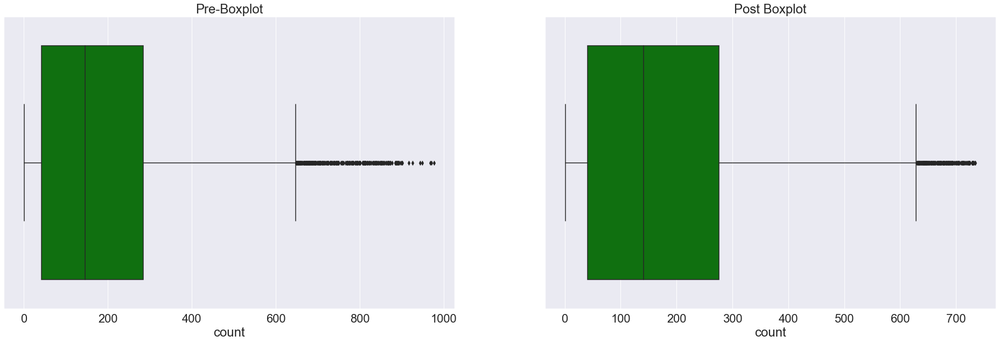




The change in standard deviation for feature count after outlier removal is -14.463024994039387


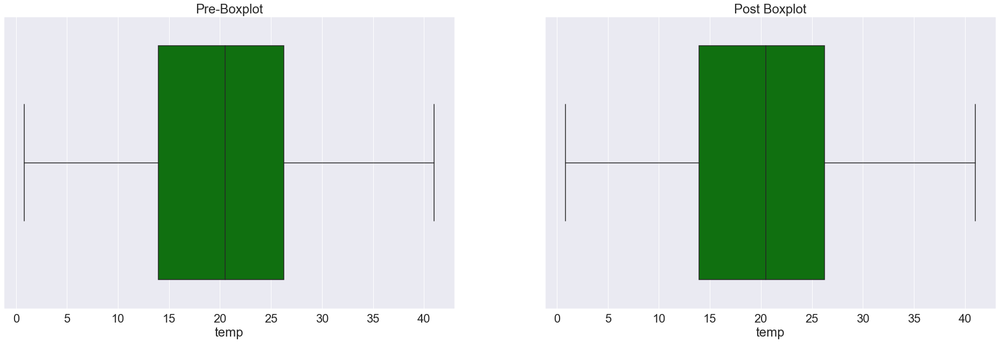




The change in standard deviation for feature count after outlier removal is -158.90385782507056


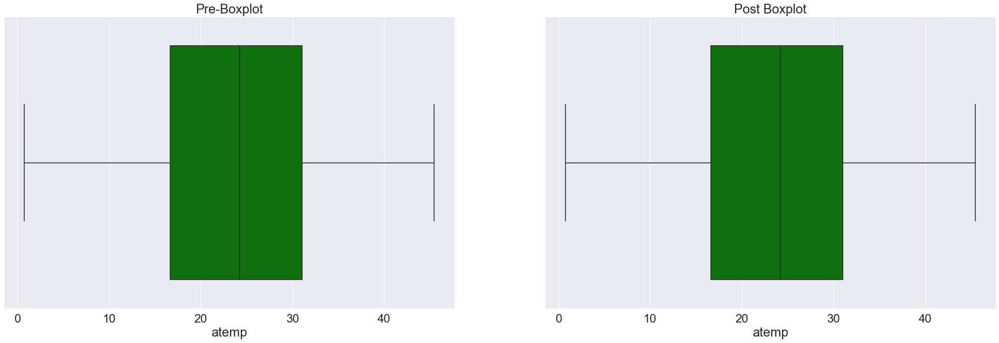




The change in standard deviation for feature count after outlier removal is -158.21824957185663


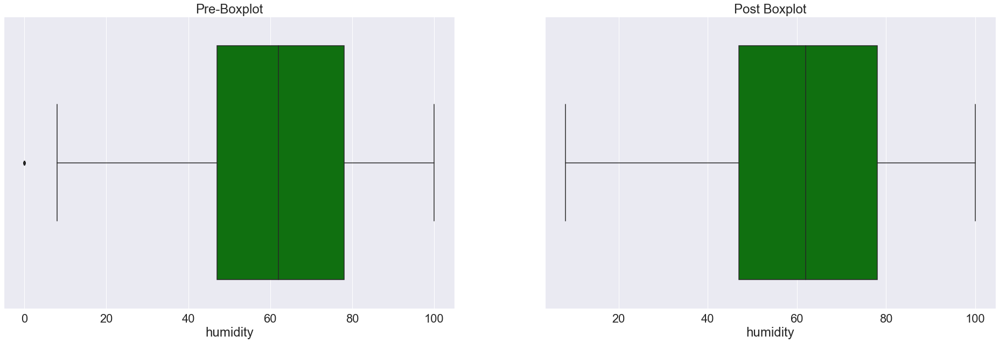




The change in standard deviation for feature count after outlier removal is -147.6270450292796


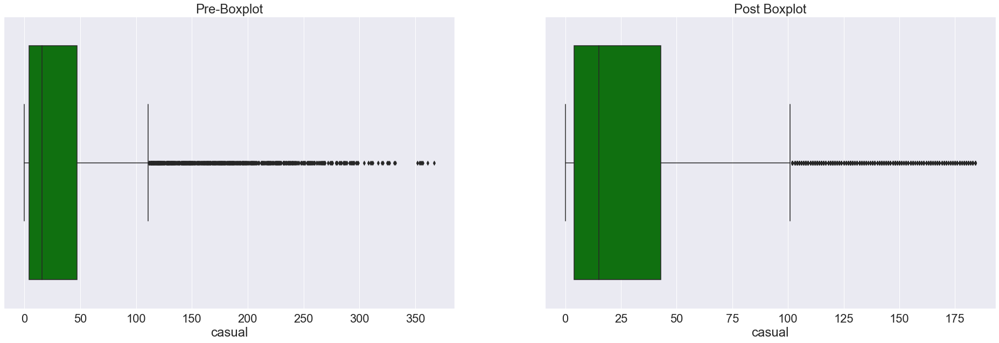




The change in standard deviation for feature count after outlier removal is -130.34983713861416


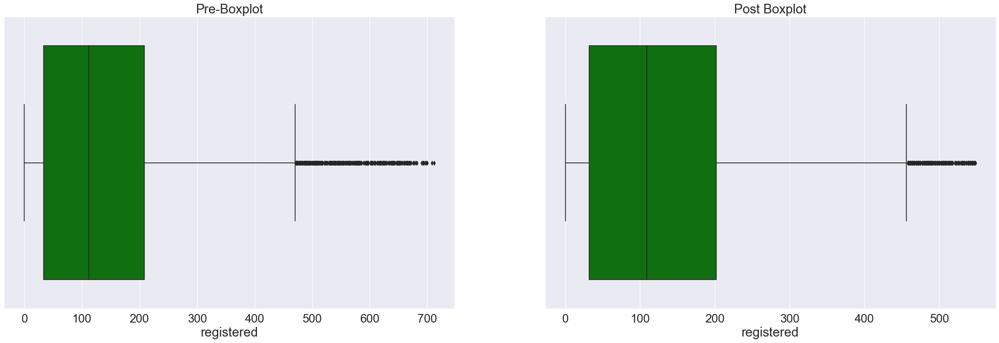




The change in standard deviation for feature count after outlier removal is -35.65602912938128


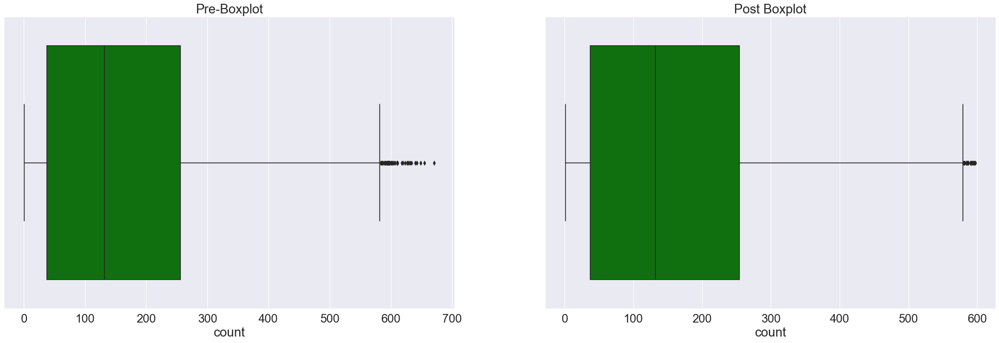




The change in standard deviation for feature count after outlier removal is -1.7934469215705064





________________________________________temp________________________________________







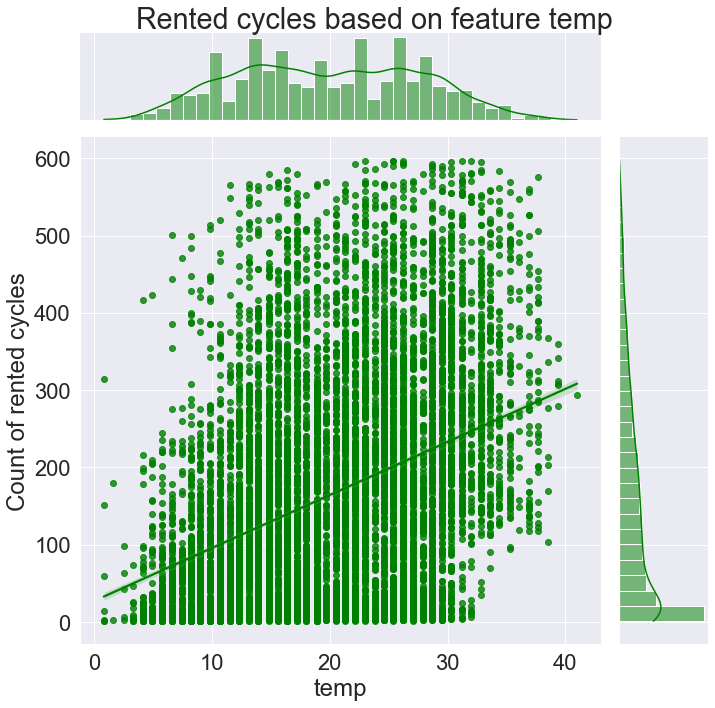

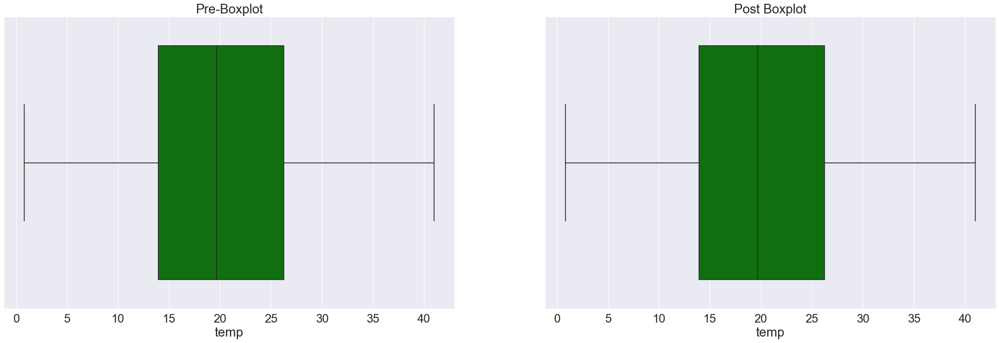




The change in standard deviation for feature temp after outlier treatment is 0.0





________________________________________atemp________________________________________







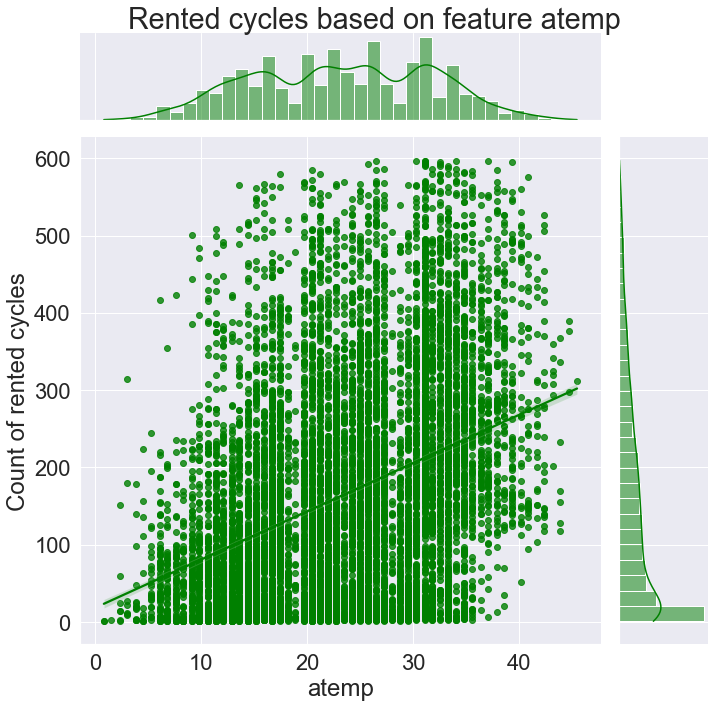

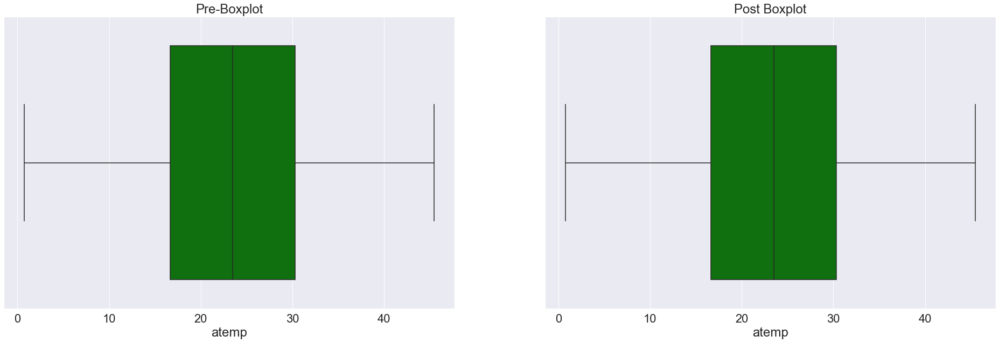




The change in standard deviation for feature atemp after outlier treatment is 0.0





________________________________________humidity________________________________________







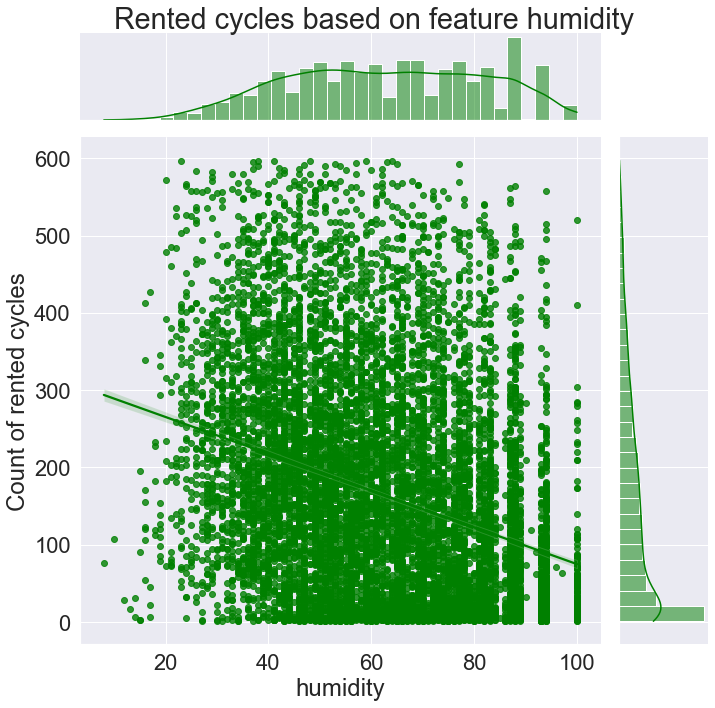

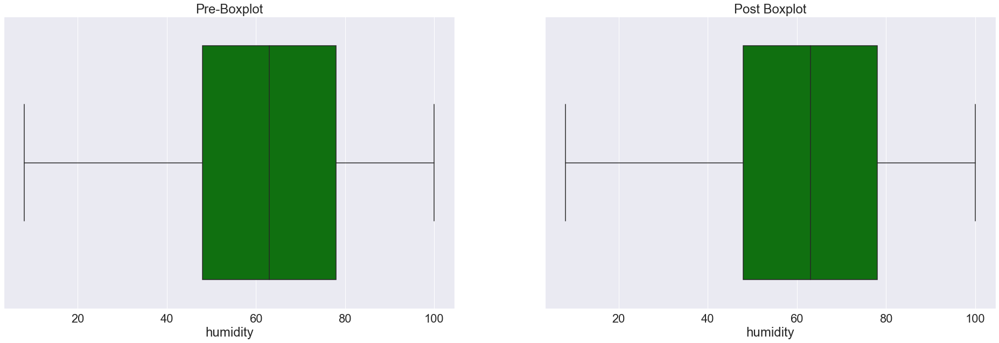




The change in standard deviation for feature humidity after outlier treatment is 0.0





________________________________________casual________________________________________







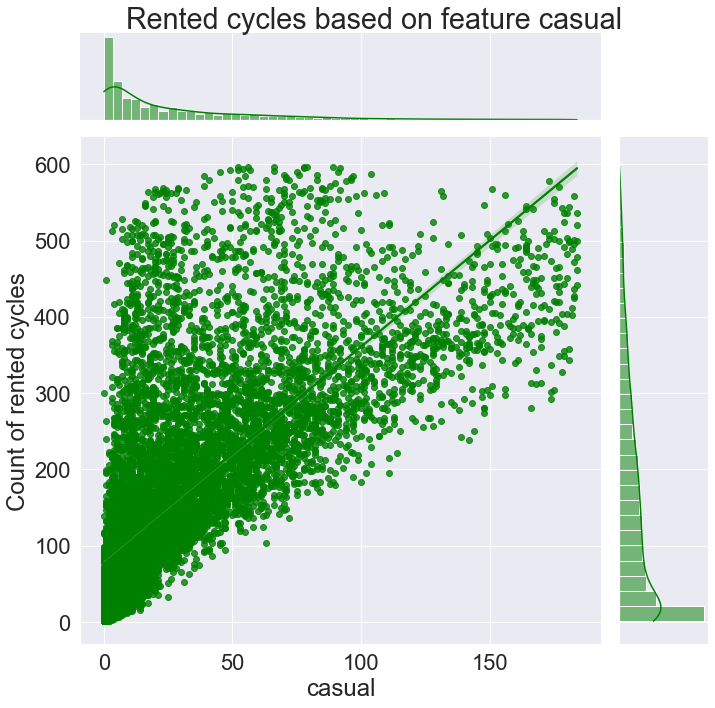

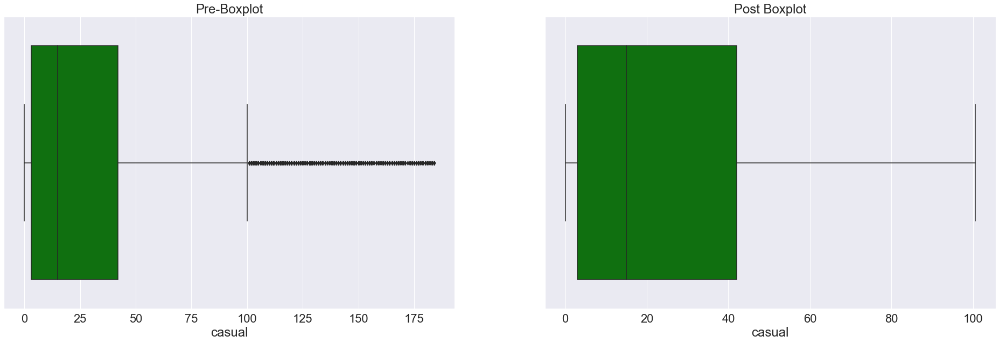




The change in standard deviation for feature casual after outlier treatment is -6.122985593082433


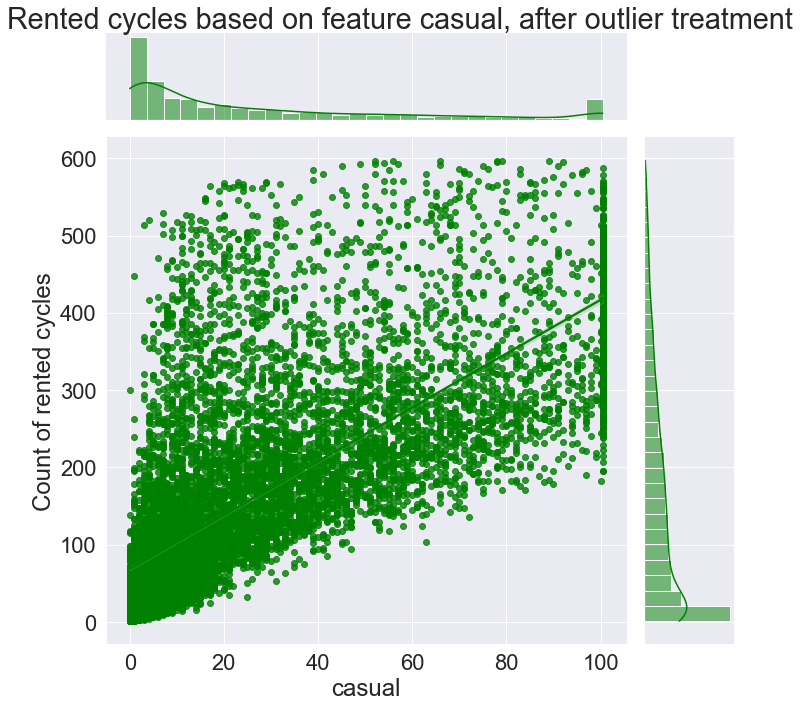






________________________________________registered________________________________________







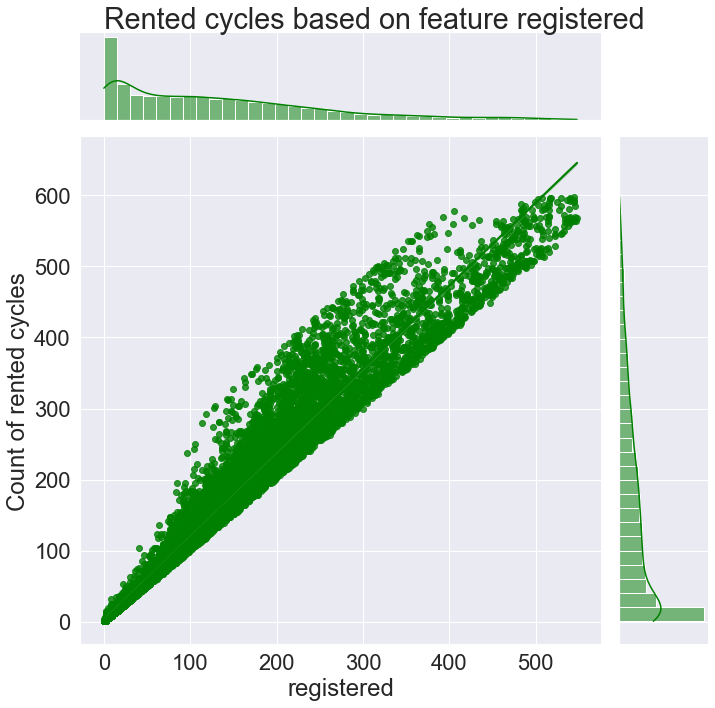

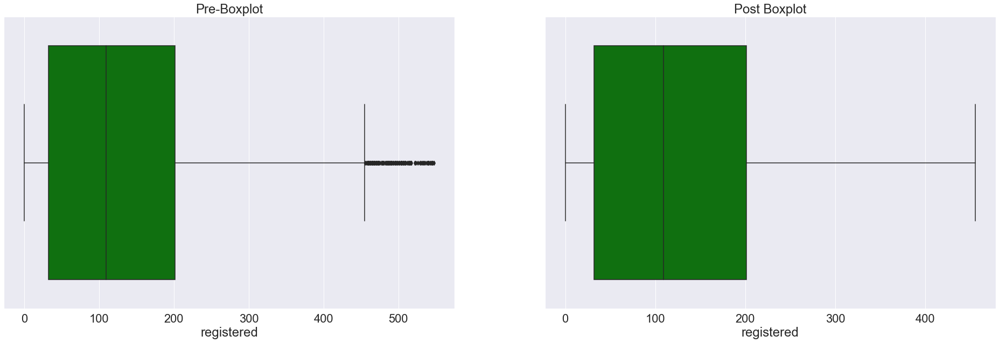




The change in standard deviation for feature registered after outlier treatment is -2.378681688647333


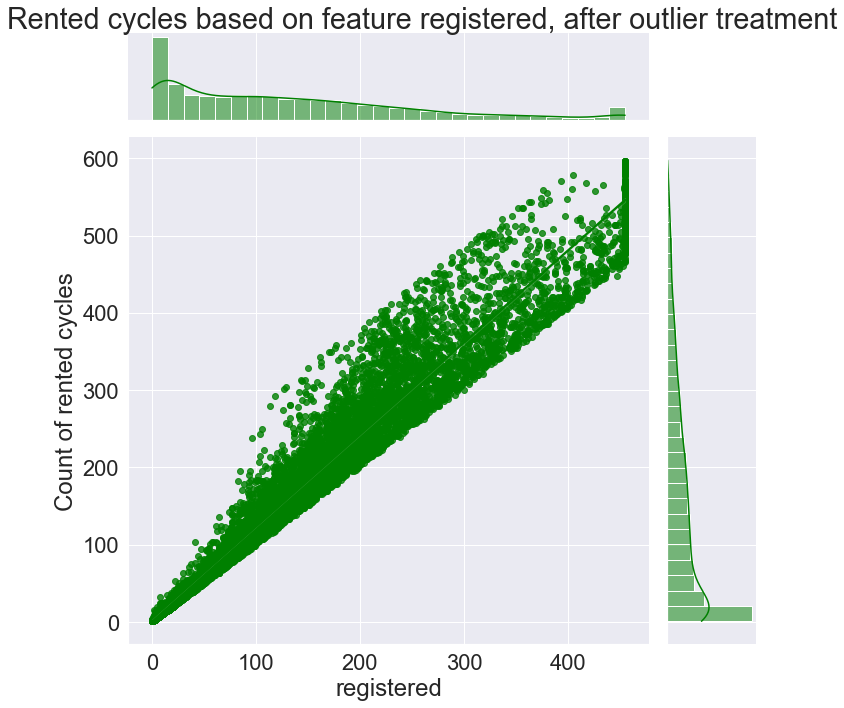

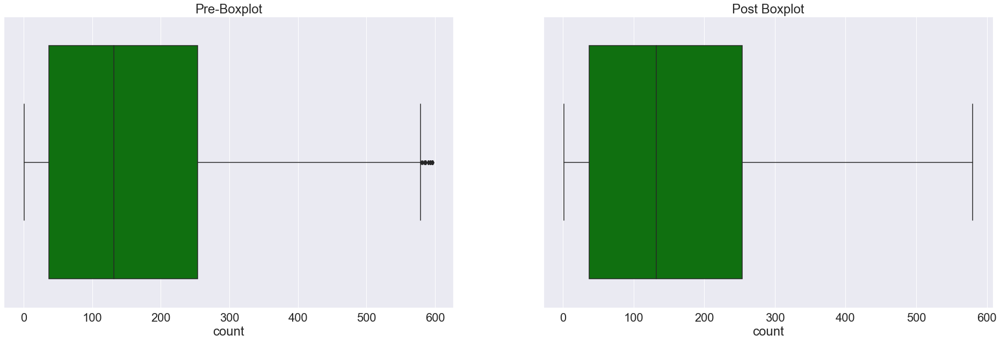




The change in standard deviation for feature count after outlier treatment is -0.0814431157298543


In [39]:
# Identify the colums names containg numeric (continuous or discrete) or categorical features
df,cont, dis,cat, t=identify_feature(df)

# Treat the outliers present in the dataset
df=outlier_removal(df,cont,dis,'count','Regression','remove')




________________________________________season________________________________________
____________________Comparision of feature season with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

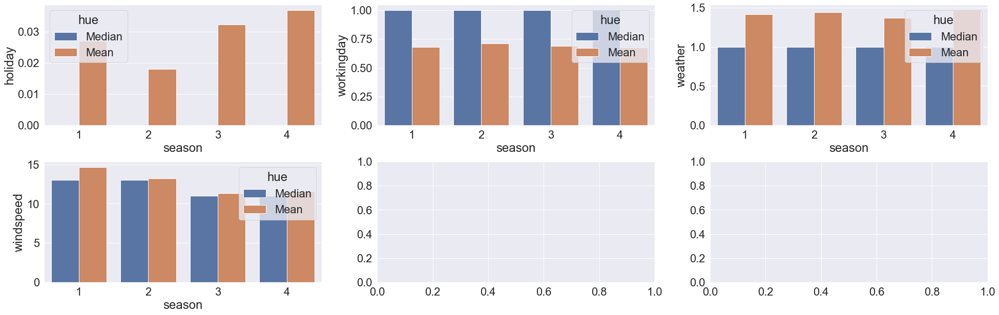




________________________________________holiday________________________________________
____________________Comparision of feature holiday with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

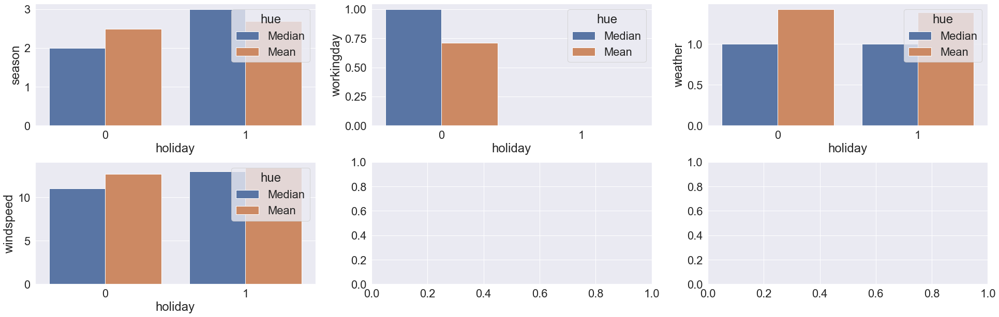




________________________________________workingday________________________________________
____________________Comparision of feature workingday with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

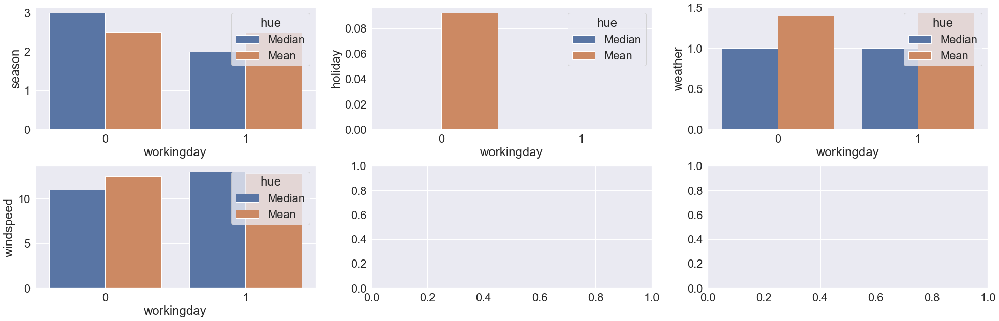




________________________________________weather________________________________________
____________________Comparision of feature weather with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

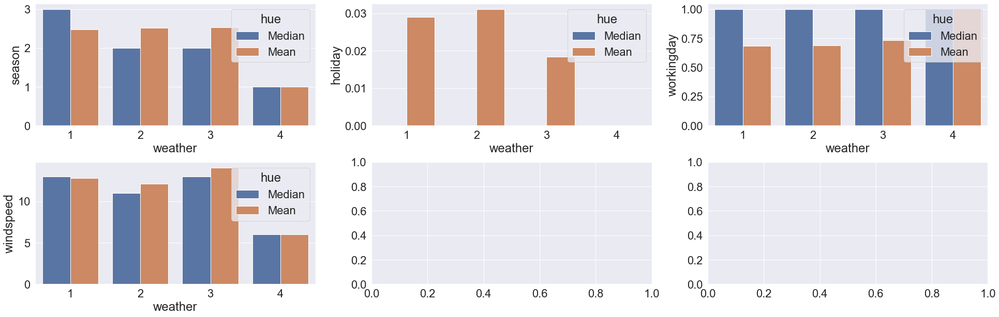




________________________________________windspeed________________________________________
____________________Comparision of feature windspeed with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

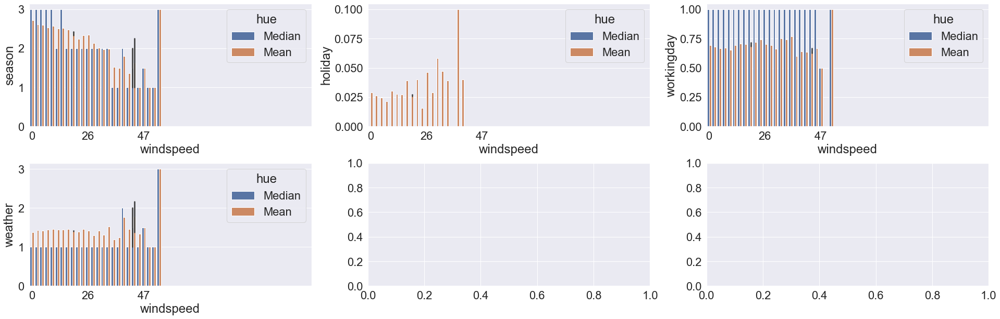




________________________________________temp________________________________________
____________________Comparision of feature temp with all the other continuous features____________________





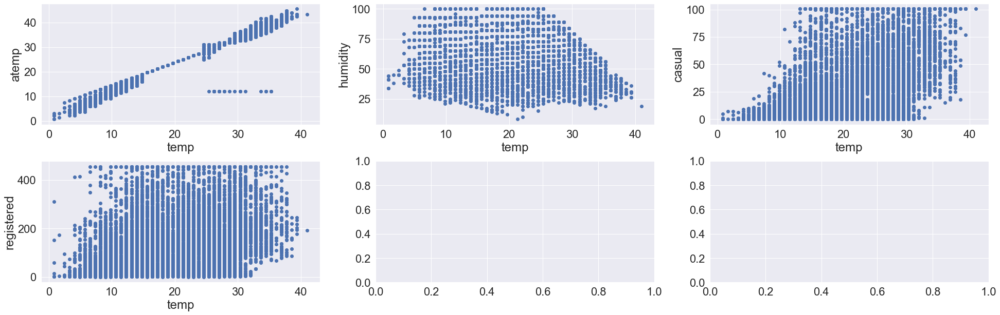




____________________Comparision of feature temp with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

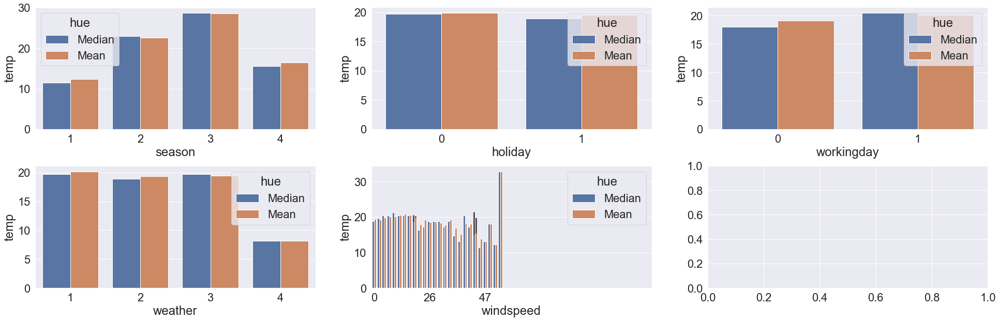




____________________Comparision of feature temp with all the other categotical features____________________


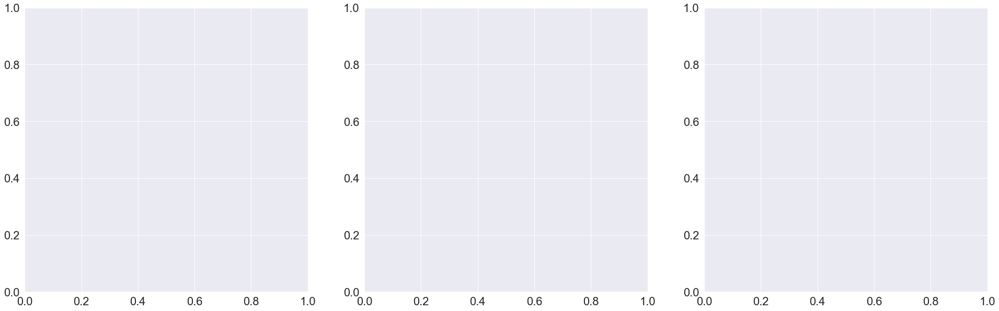




________________________________________atemp________________________________________
____________________Comparision of feature atemp with all the other continuous features____________________





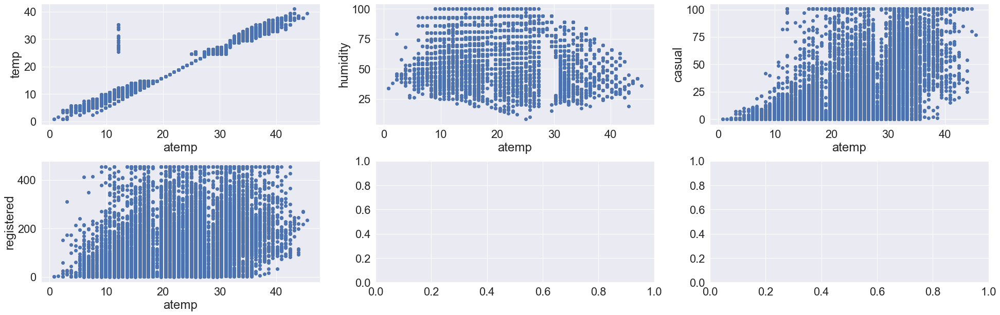




____________________Comparision of feature atemp with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

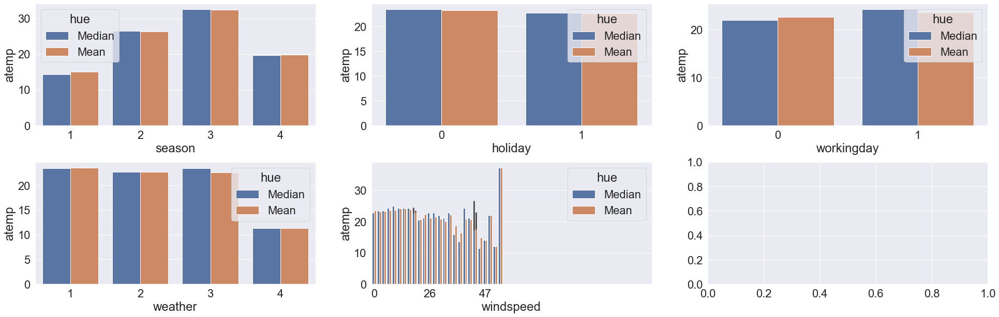




____________________Comparision of feature atemp with all the other categotical features____________________


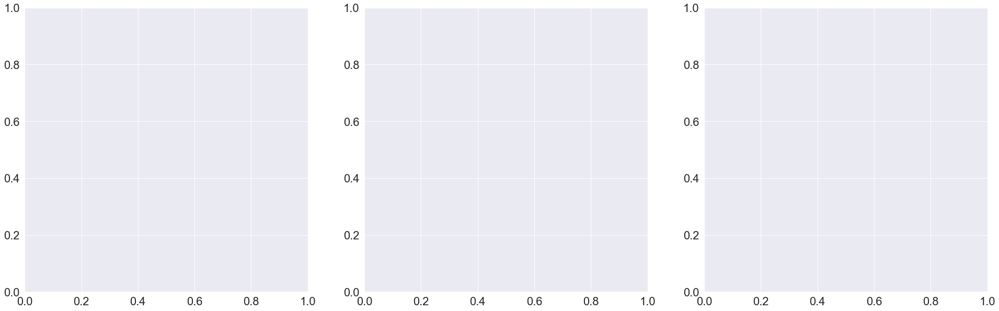




________________________________________humidity________________________________________
____________________Comparision of feature humidity with all the other continuous features____________________





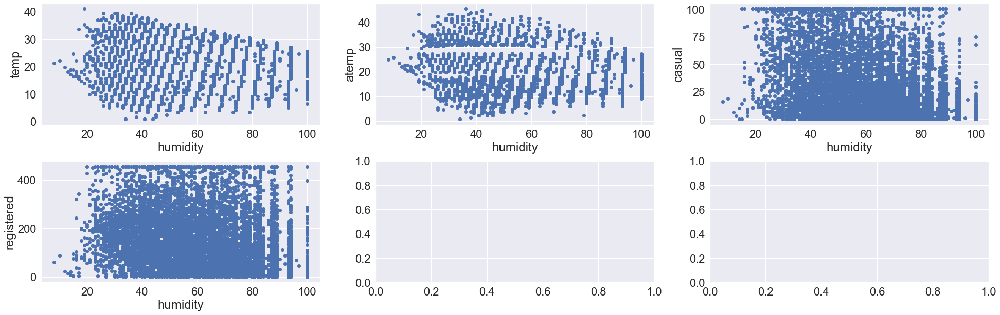




____________________Comparision of feature humidity with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

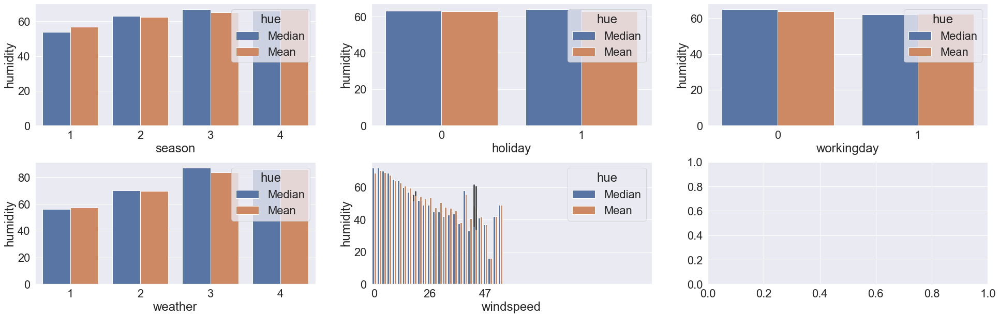




____________________Comparision of feature humidity with all the other categotical features____________________


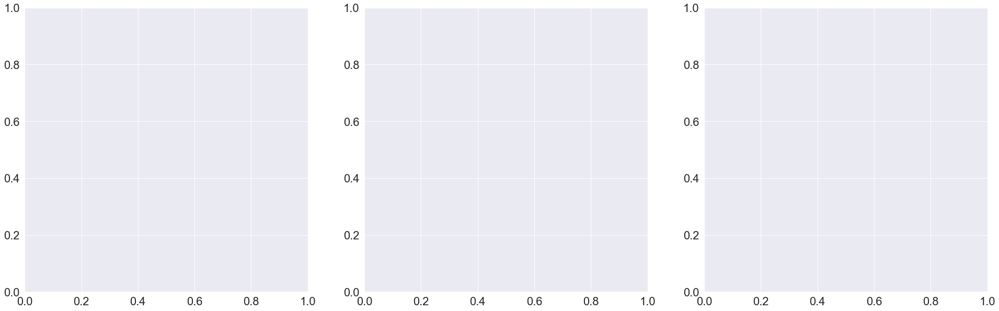




________________________________________casual________________________________________
____________________Comparision of feature casual with all the other continuous features____________________





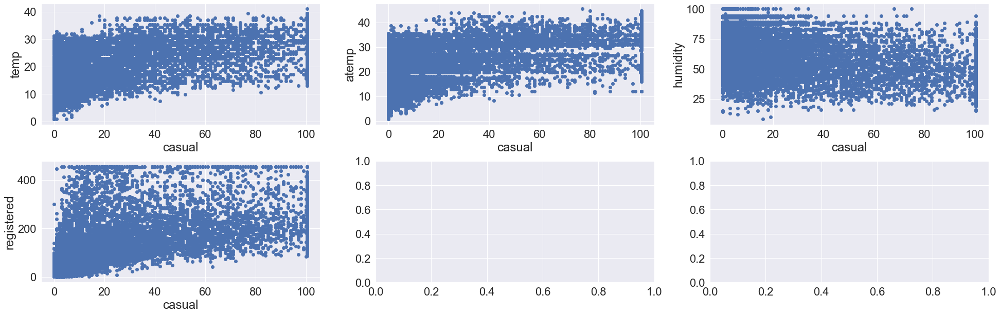




____________________Comparision of feature casual with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

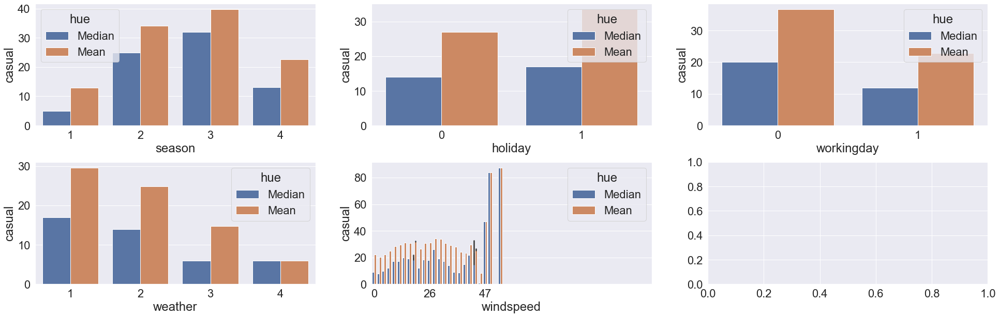




____________________Comparision of feature casual with all the other categotical features____________________


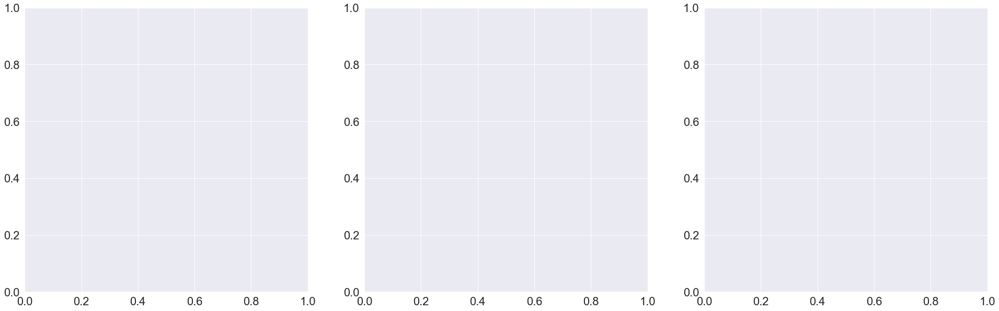




________________________________________registered________________________________________
____________________Comparision of feature registered with all the other continuous features____________________





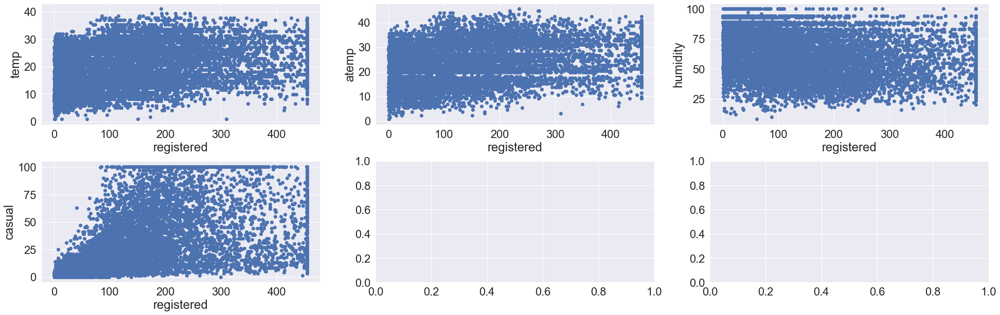




____________________Comparision of feature registered with all the other discrete features____________________


C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

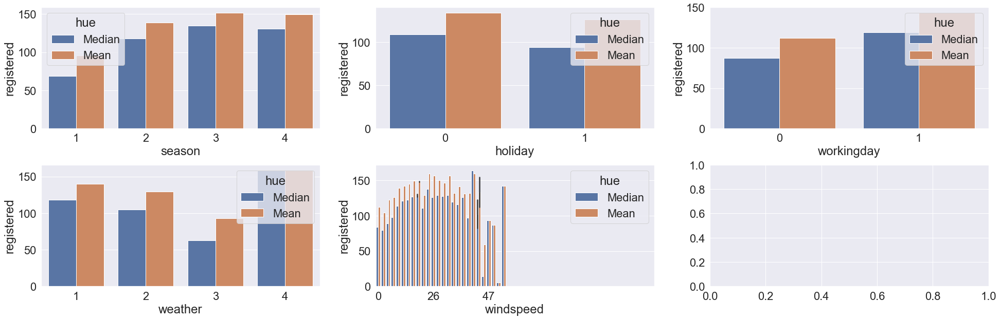




____________________Comparision of feature registered with all the other categotical features____________________


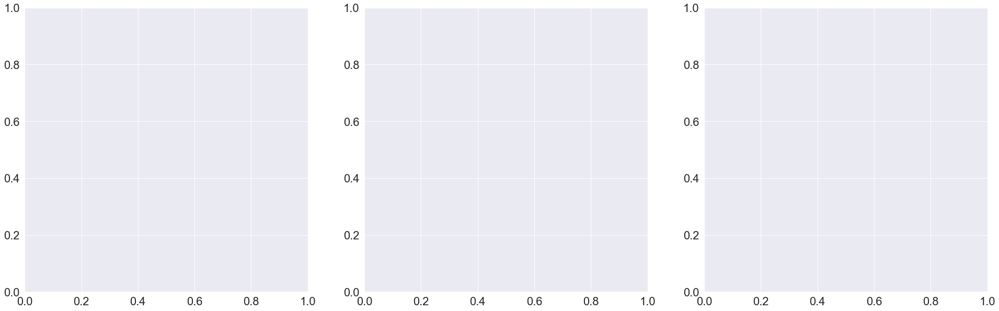




________________________________________datetime_hour________________________________________
____________________Comparision of feature datetime_hour with all the other continuous features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

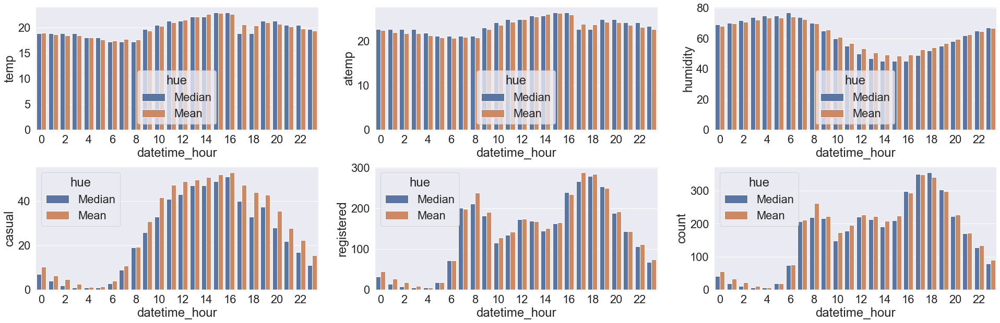

____________________Comparision of feature datetime_hour with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

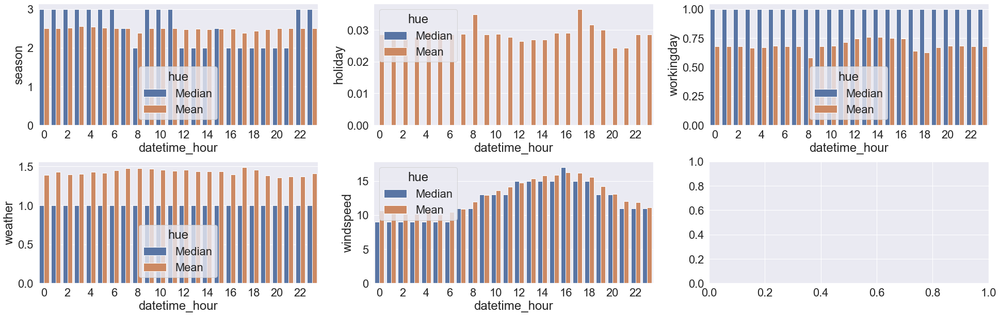




________________________________________datetime_year________________________________________
____________________Comparision of feature datetime_year with all the other continuous features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

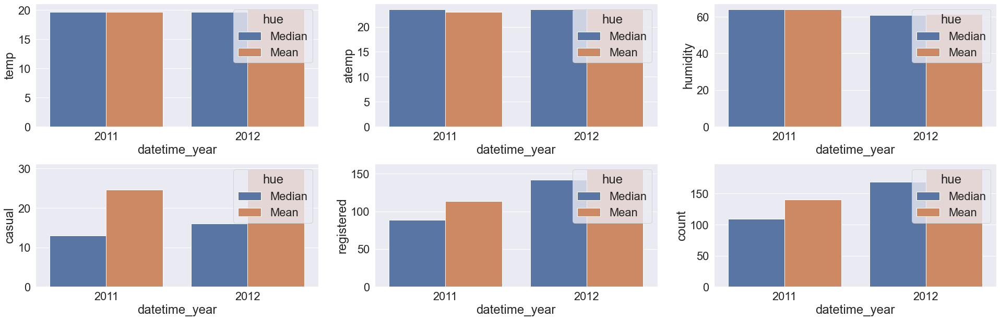

____________________Comparision of feature datetime_year with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

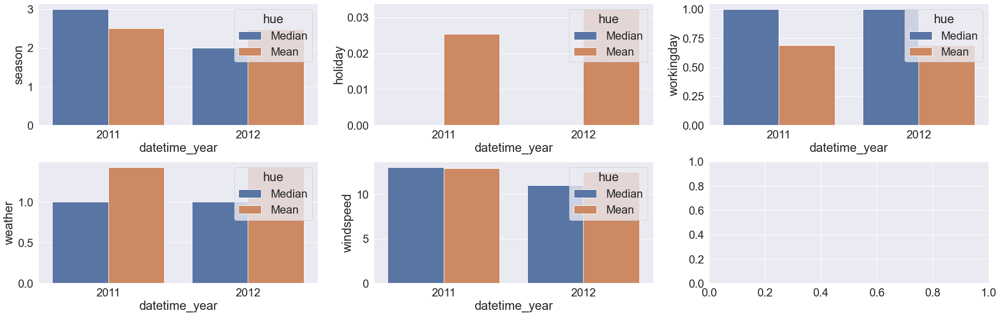




________________________________________datetime_month________________________________________
____________________Comparision of feature datetime_month with all the other continuous features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

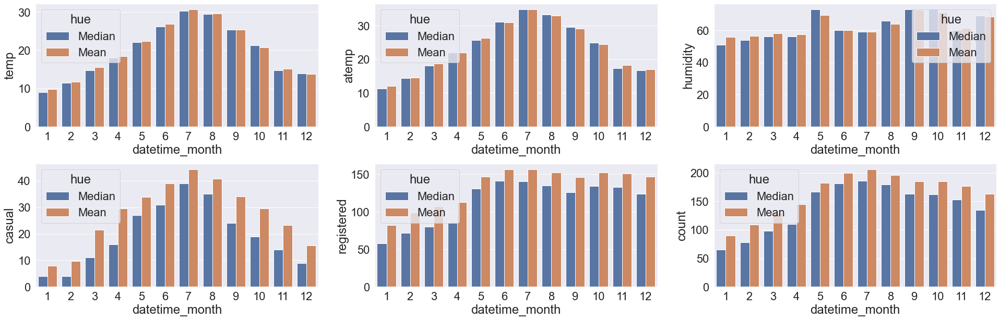

____________________Comparision of feature datetime_month with all the other discrete features____________________





C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\anaconda\envs\eda\lib\site-pack

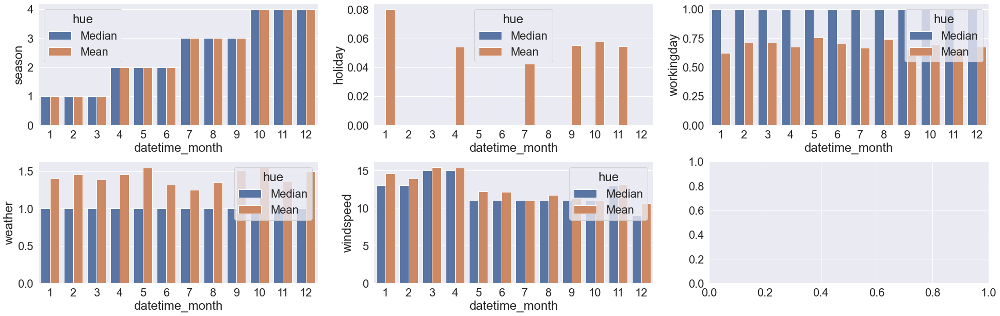

In [40]:
# Plot the feature with other independent features
cont2=cross_visualization(df,cont,dis,cat,t)






________________________________________Plots between continuous and discrete features________________________________________
________________________________________temp________________________________________







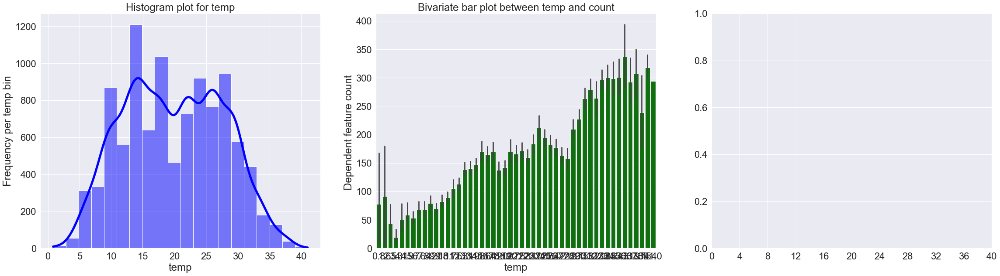

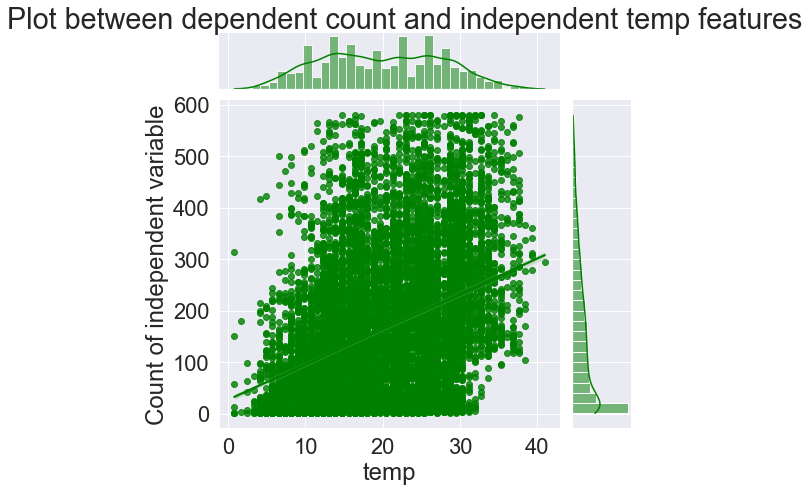






________________________________________Plots between continuous and discrete features________________________________________
________________________________________atemp________________________________________







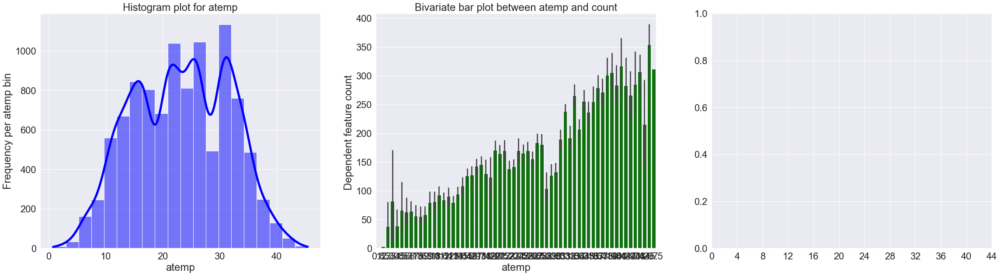

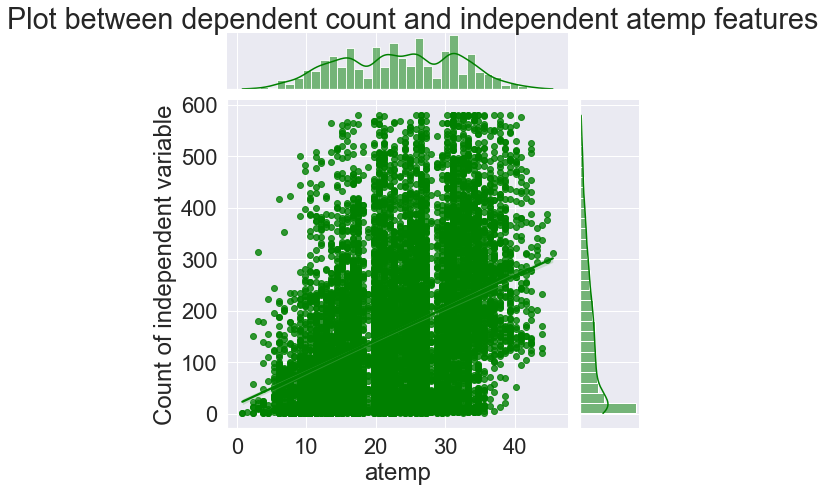






________________________________________Plots between continuous and discrete features________________________________________
________________________________________humidity________________________________________







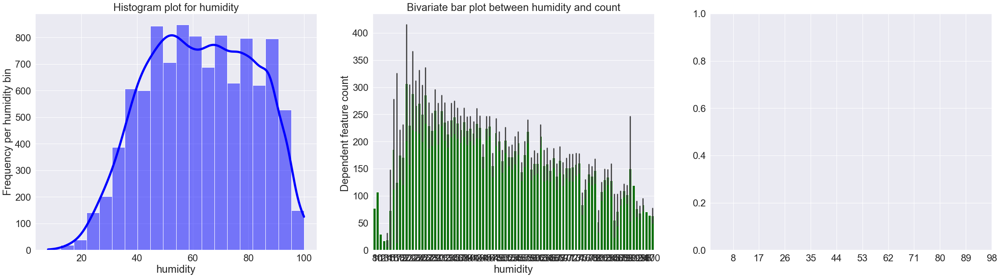

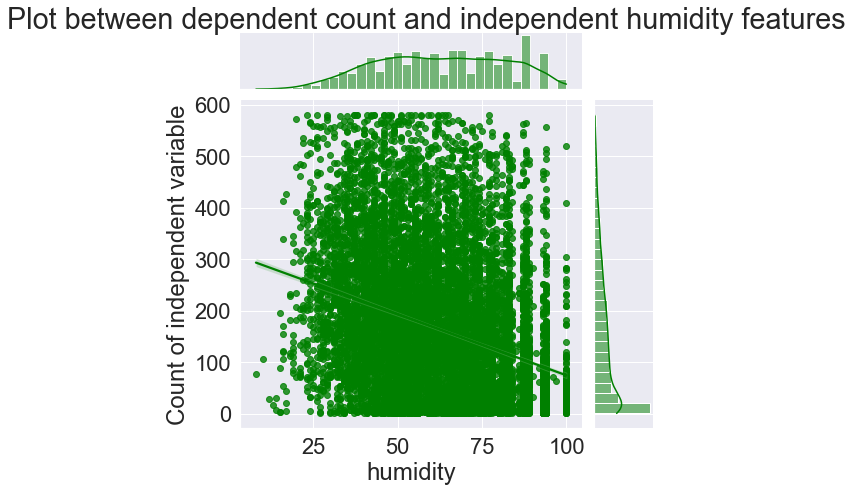






________________________________________Plots between continuous and discrete features________________________________________
________________________________________casual________________________________________







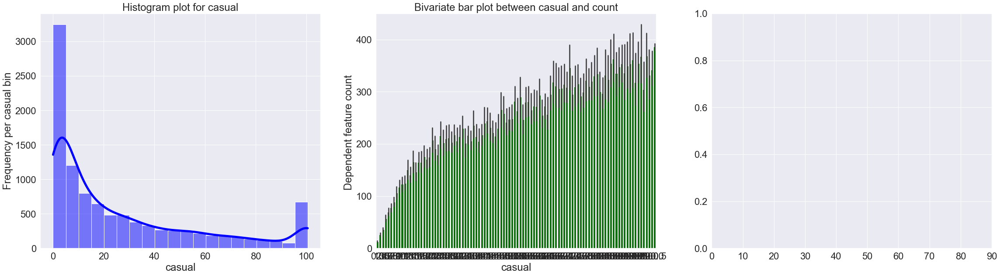

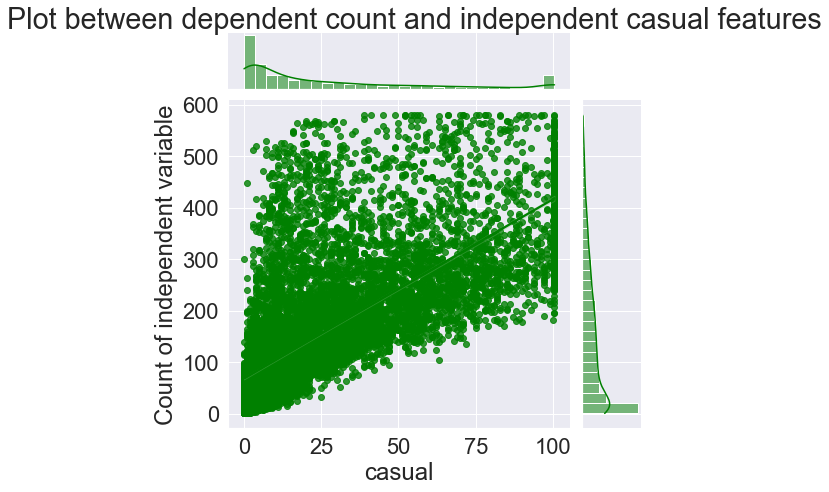






________________________________________Plots between continuous and discrete features________________________________________
________________________________________registered________________________________________







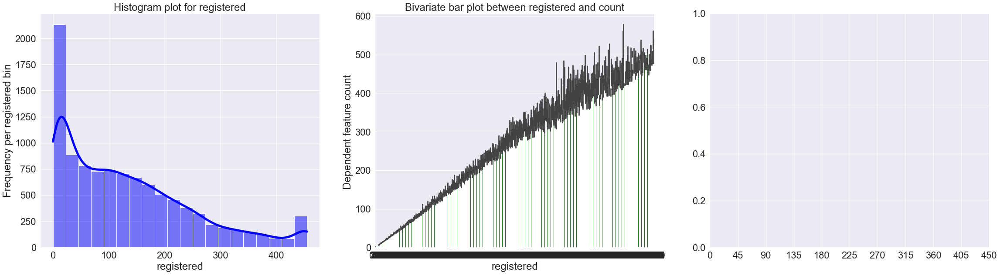

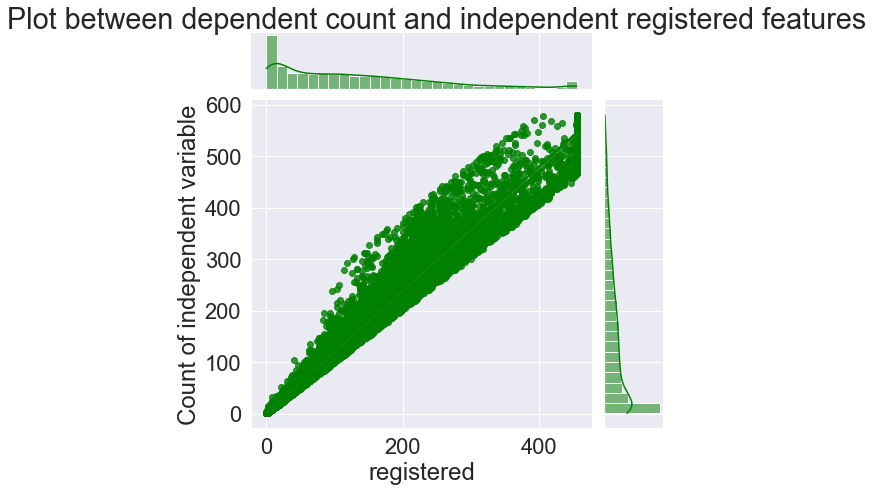






________________________________________Plots between continuous and discrete features________________________________________
________________________________________season________________________________________







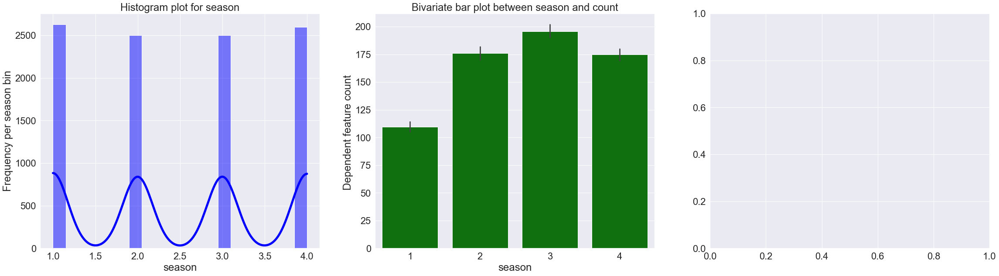

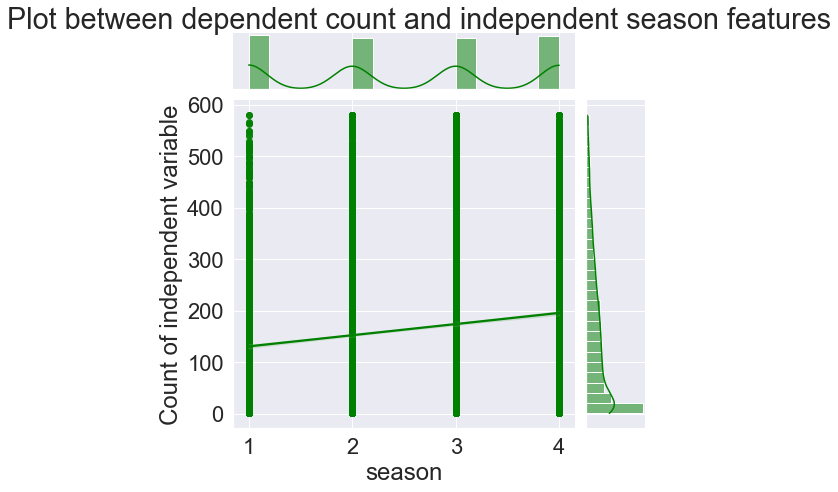






________________________________________Plots between continuous and discrete features________________________________________
________________________________________holiday________________________________________







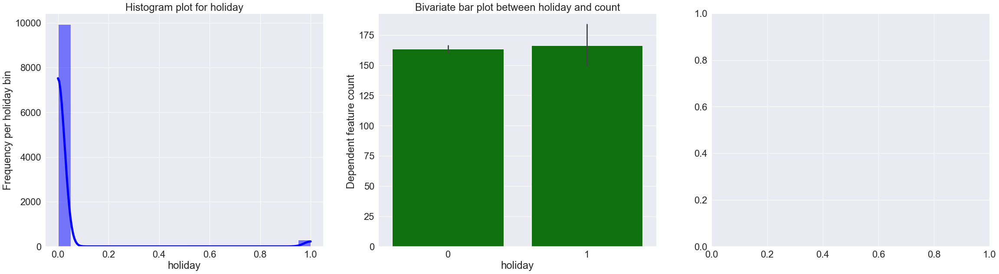

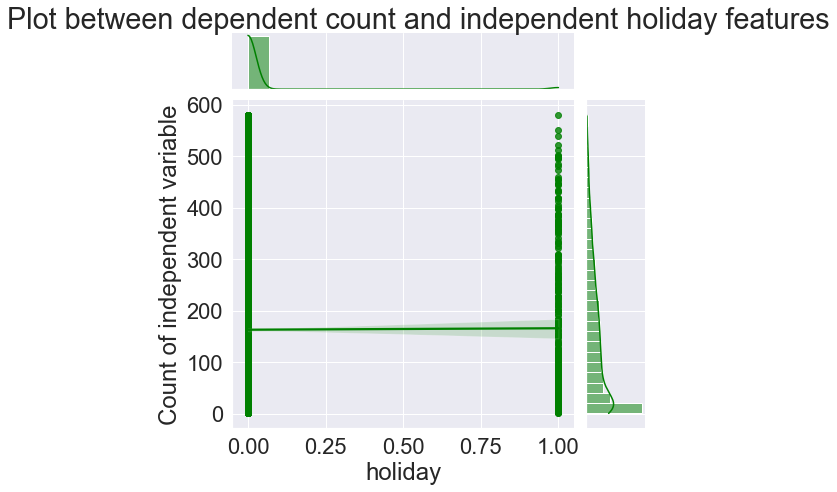






________________________________________Plots between continuous and discrete features________________________________________
________________________________________workingday________________________________________







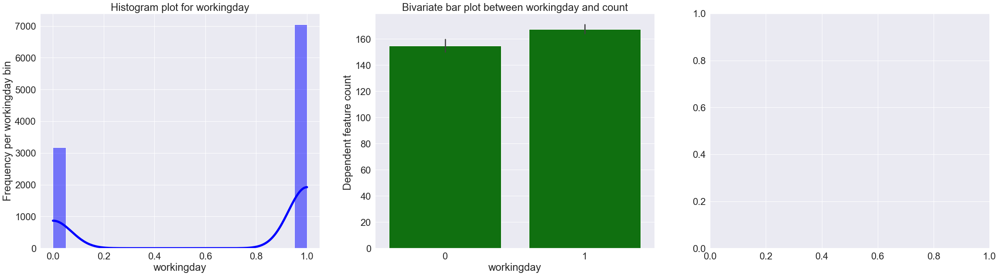

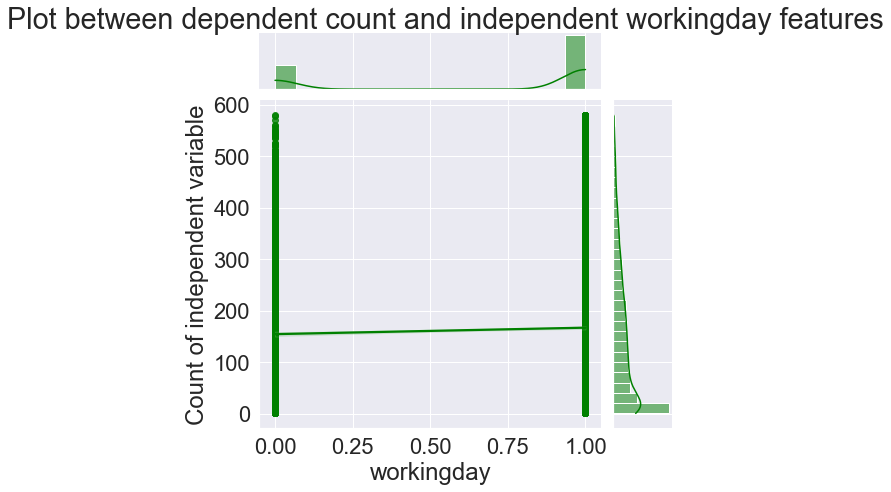






________________________________________Plots between continuous and discrete features________________________________________
________________________________________weather________________________________________







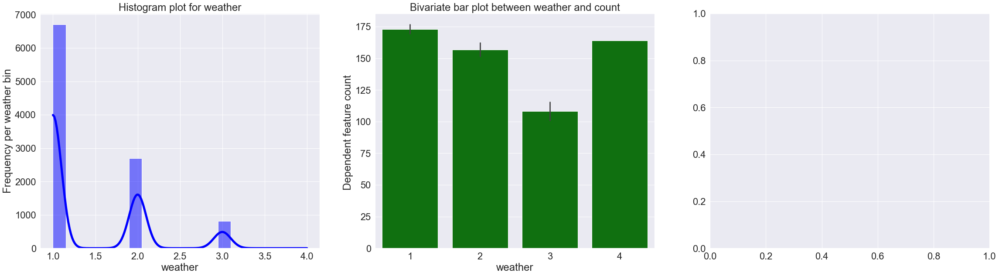

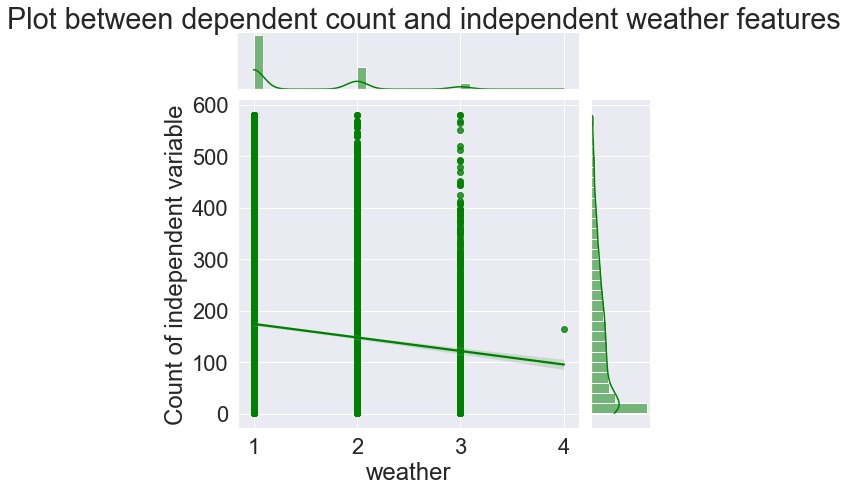






________________________________________Plots between continuous and discrete features________________________________________
________________________________________windspeed________________________________________







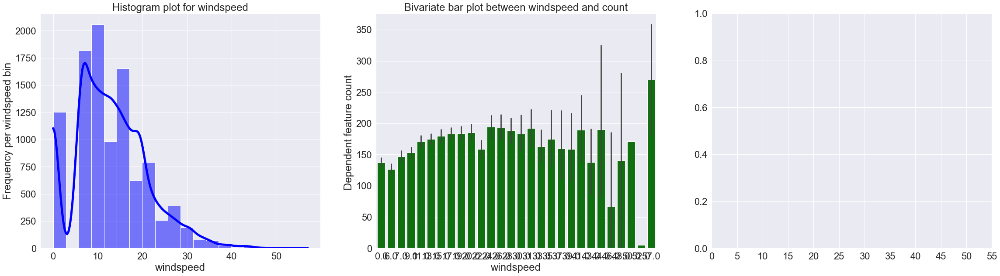

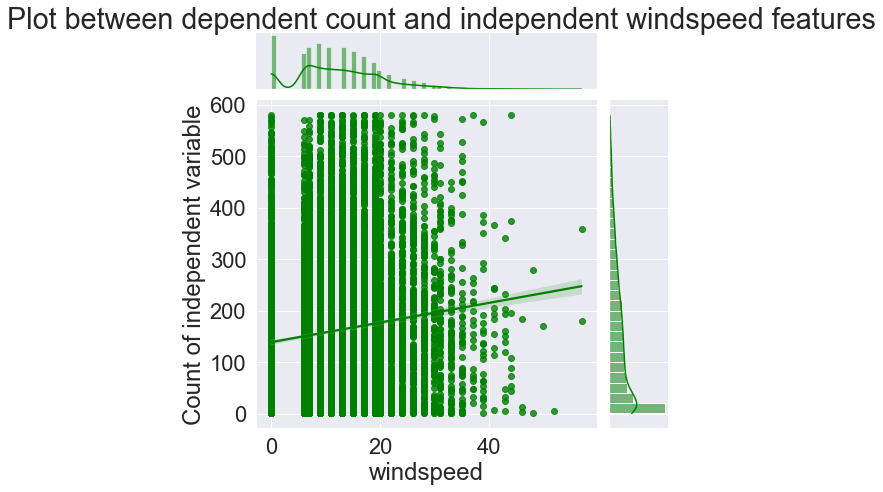






________________________________________Count of rented cycles based on datetime features________________________________________







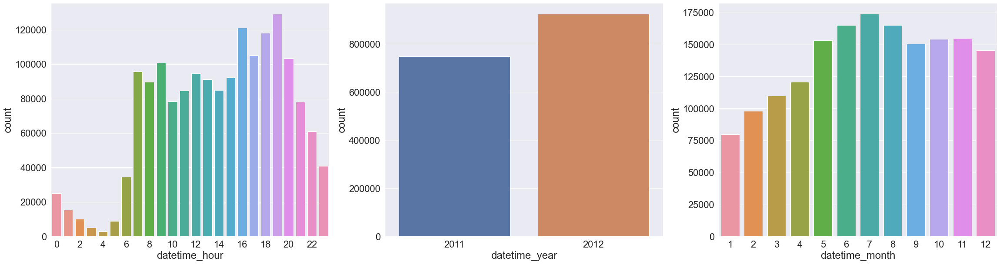

In [41]:
# Visualize the relation between dependent and independent features
dependent_independent_visualization(df,cont,dis, cat,t,'count')

In [42]:
# Create bins for the humidity feature
df['humidity_level']=np.nan
df.loc[df['humidity']<=20,'humidity_level']='low'
df.loc[(df['humidity']<=40) & (df['humidity']>20),'humidity_level']='perfect'
df.loc[(df['humidity']<=60) & (df['humidity']>40),'humidity_level']='comfortable'
df.loc[(df['humidity']<=80) & (df['humidity']>60),'humidity_level']='uncomfortable'
df.loc[df['humidity']>80,'humidity_level']='extreme'
# Create bins based on the hour feature
df['datetime_hour_level']=np.nan
df.loc[df['datetime_hour']<=6,'datetime_hour_level']='night'
df.loc[(df['datetime_hour']>20),'datetime_hour_level']='night'
df.loc[(df['datetime_hour']<=11) & (df['datetime_hour']>6),'datetime_hour_level']='morning'
df.loc[(df['datetime_hour']<=16) & (df['datetime_hour']>11),'datetime_hour_level']='afternoon'
df.loc[(df['datetime_hour']<=20) & (df['datetime_hour']>16),'datetime_hour_level']='evening'
# Create bins based on the windflow
df['windspeed_level']=np.nan
df.loc[df['windspeed']<=2,'windspeed_level']='calm'
df.loc[(df['windspeed']<=15) & (df['windspeed']>2),'windspeed_level']='light'
df.loc[(df['windspeed']<=30) & (df['windspeed']>15),'windspeed_level']='strong'
df.loc[df['windspeed']>30,'windspeed_level']='gale'
# Temperature has very less unique values and act as a discrete numerical, so we convert its values in bins
df['temp']=df['temp'].astype('int')//5
df['atemp']=df['atemp'].astype('int')//5
# Dependent  feauture
y=df['count']
# Perform encoding on categorical features
cat_trans={'one_hot_encoding':['season','humidity_level','weather','datetime_year','windspeed_level','datetime_hour_level'],'frequency_encoding':[],'mean_encoding':[],'target_guided_ordinal_encoding':{}}
df=categorical_transformation(df,cat_trans)

# Drop unnecessary features
df.drop(['humidity', 'windspeed','casual', 'registered', 'count', 'datetime_hour'],axis=1,inplace=True)
x=df.copy()


# Regression with feature selection

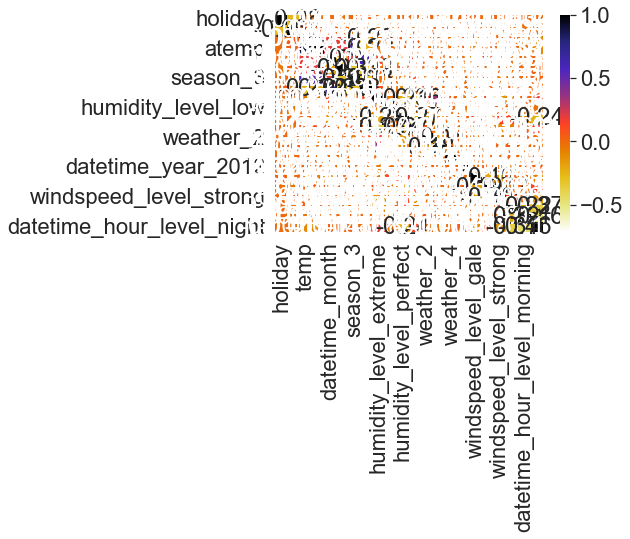

 Highly corelated features have been dropped from the dataset


In [43]:
# Perform feature selection, where input and output are in the categorical from
feature_selection_tech={'in_num_out_num':{'linear':['pearson'],'non-linear':['spearman']},
                   'in_num_out_cat':{'linear':['ANOVA'],'non-linear':['kendall']},
                   'in_cat_out_num':{'linear':['ANOVA'],'non-linear':['kendall']},
                   'in_cat_out_cat':{'chi_square_test':True,'mutual_info':True},}
x,feature_list=feature_selection(x,y, 0.7, feature_selection_tech,'non-linear', 'in_cat_out_num')


In [44]:
# Split the dataset in train and test
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=0)
# Initialize the GridSearchCV
param_test = {'max_iter':[5000],'alpha':[1e-10, 1e-8, 1e-4,1e-2, 1, 5, 10, 100, 500, 1000]}
search=GridSearchCV(Lasso(fit_intercept=True, normalize=True, selection='random'),param_grid = param_test, scoring='r2', cv=10)
# perform the search
results = search.fit(x_train, y_train)

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

In [45]:
# summarize best
print('Best Mean Accuracy: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)

Best Mean Accuracy: 0.582
Best Config: {'alpha': 0.01, 'max_iter': 5000}


In [46]:
print('Predicting score {a}'.format(a=rmse(results.predict(x_test),y_test)))

Predicting score 90.69163477378689


# Regression without feature selection

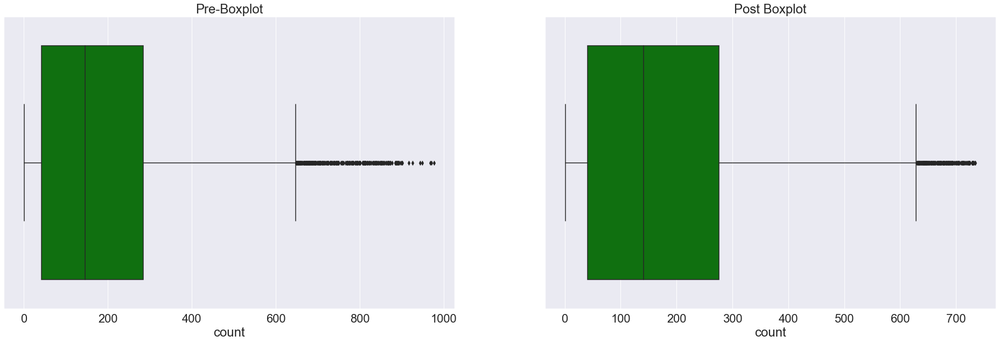




The change in standard deviation for feature count after outlier removal is -14.463024994039387


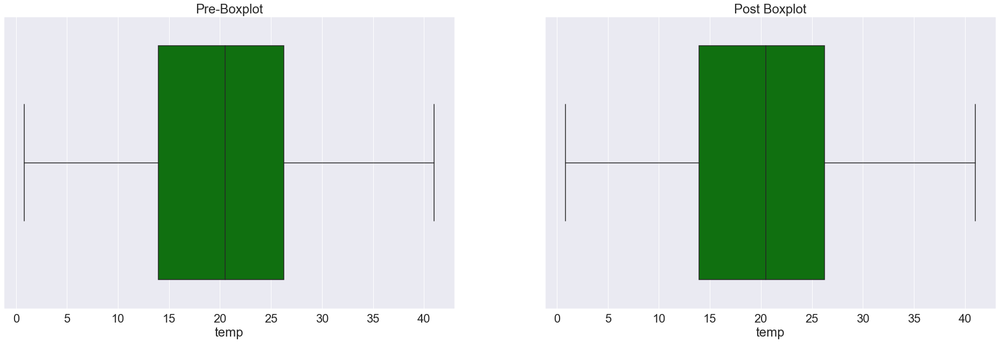




The change in standard deviation for feature count after outlier removal is -158.90385782507056


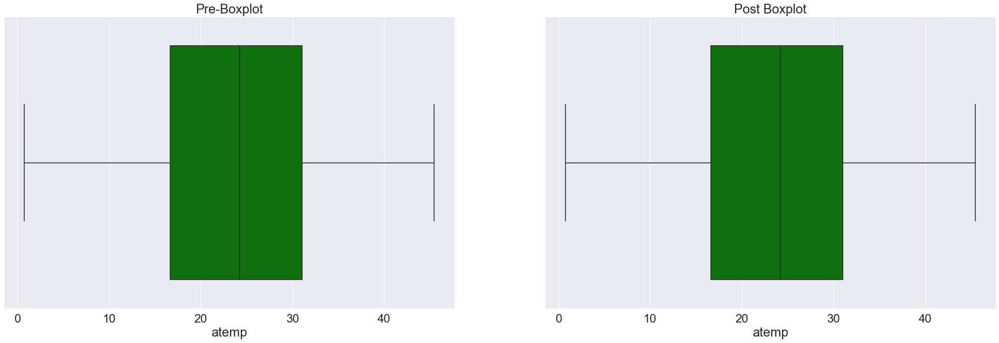




The change in standard deviation for feature count after outlier removal is -158.21824957185663


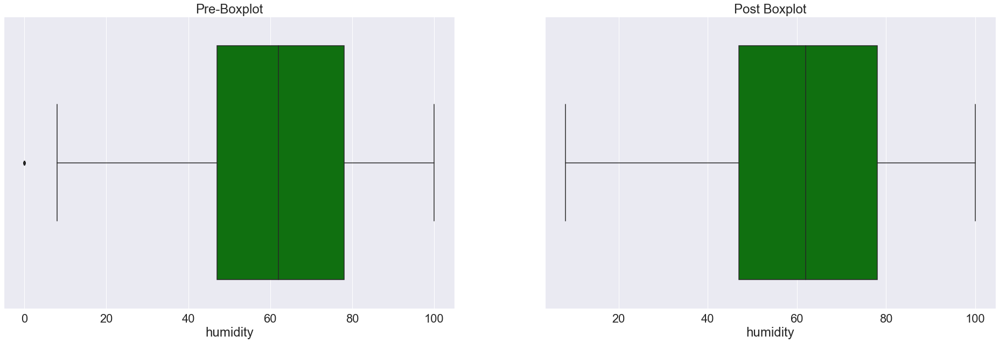




The change in standard deviation for feature count after outlier removal is -147.6270450292796


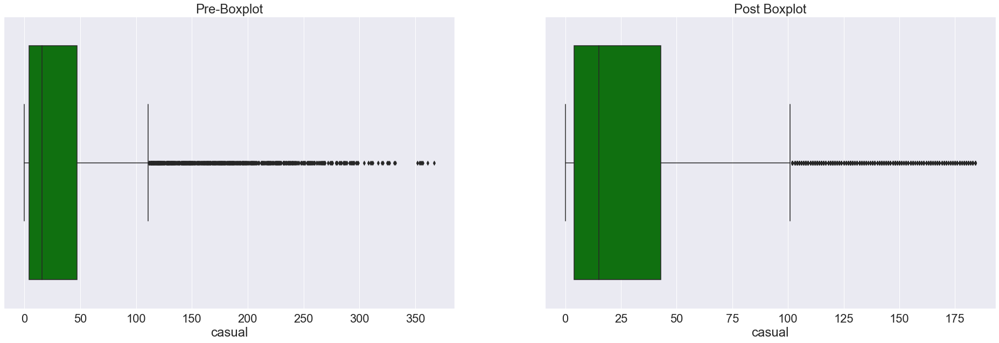




The change in standard deviation for feature count after outlier removal is -130.34983713861416


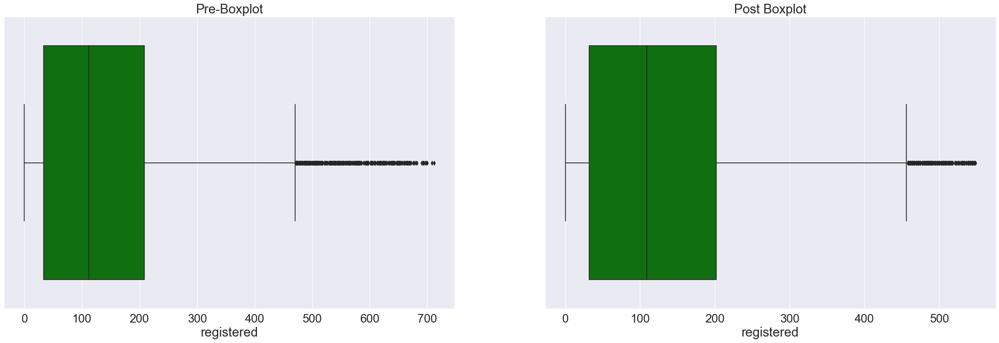




The change in standard deviation for feature count after outlier removal is -35.65602912938128


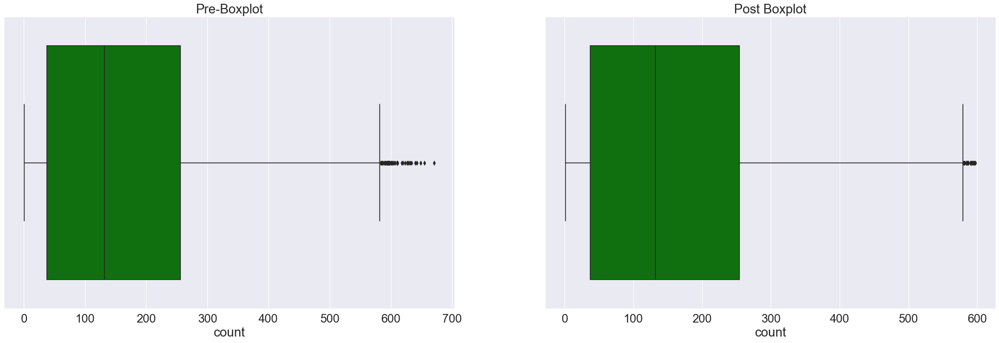




The change in standard deviation for feature count after outlier removal is -1.7934469215705064





________________________________________temp________________________________________







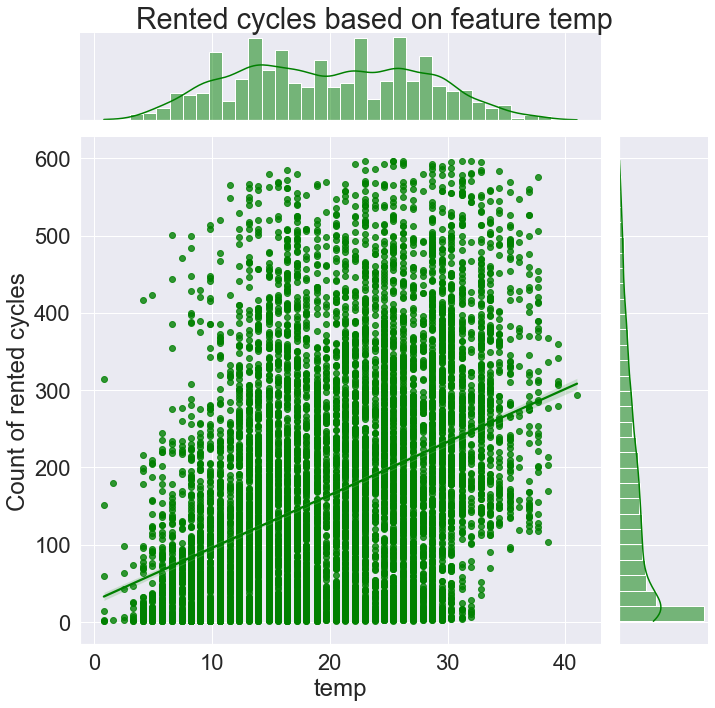

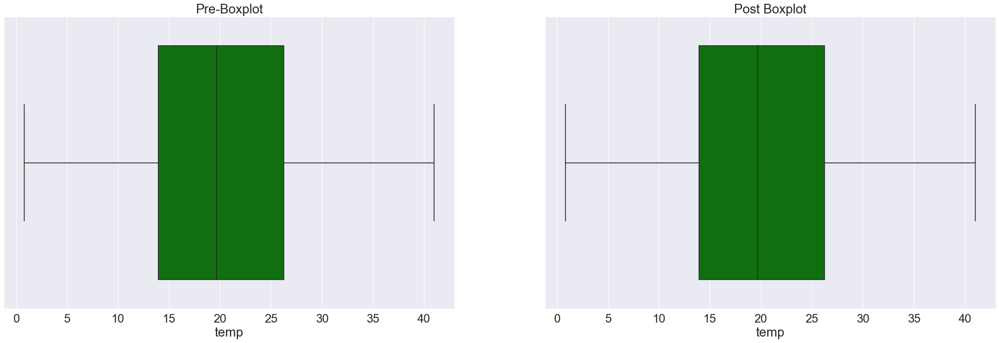




The change in standard deviation for feature temp after outlier treatment is 0.0





________________________________________atemp________________________________________







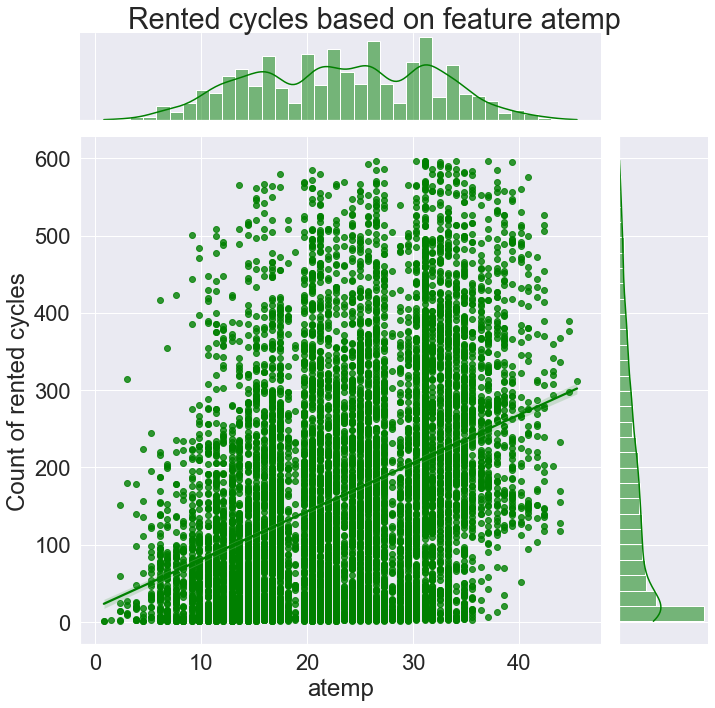

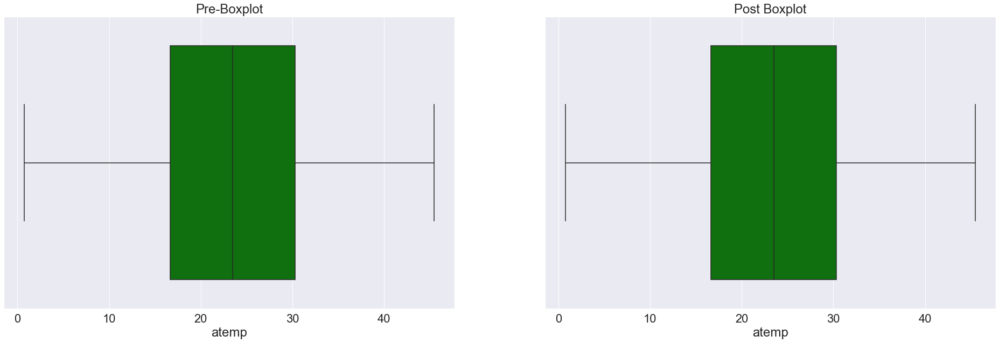




The change in standard deviation for feature atemp after outlier treatment is 0.0





________________________________________humidity________________________________________







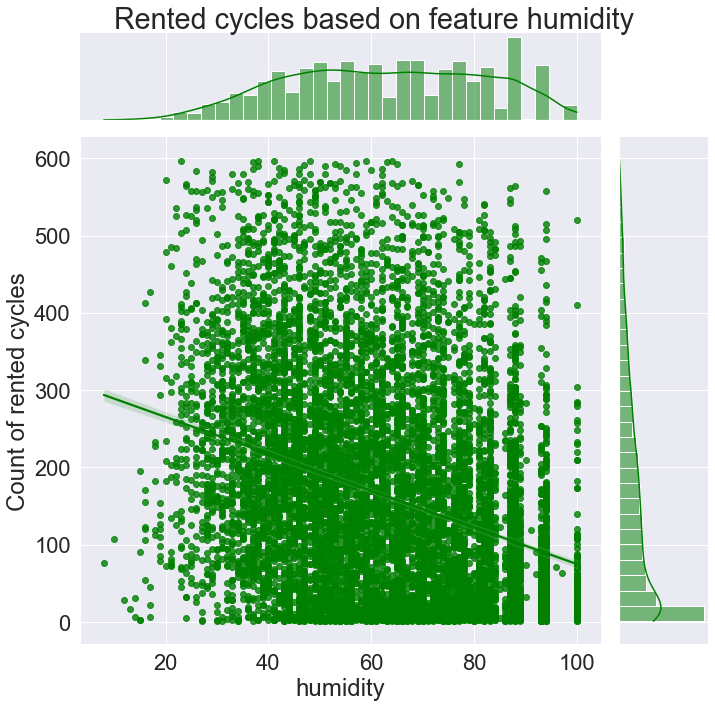

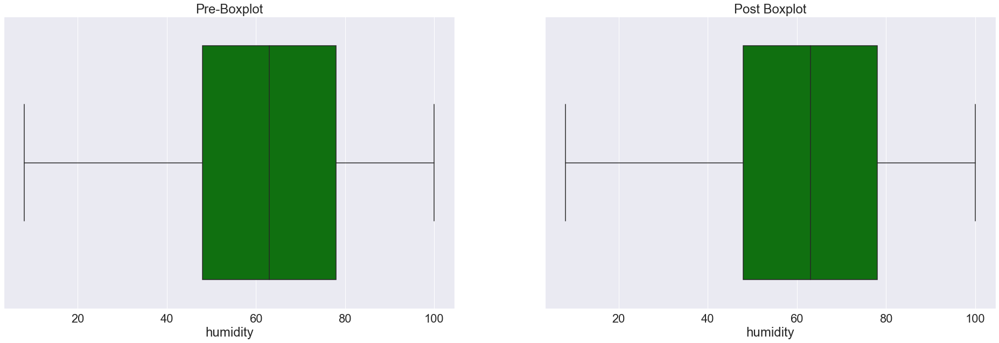




The change in standard deviation for feature humidity after outlier treatment is 0.0





________________________________________casual________________________________________







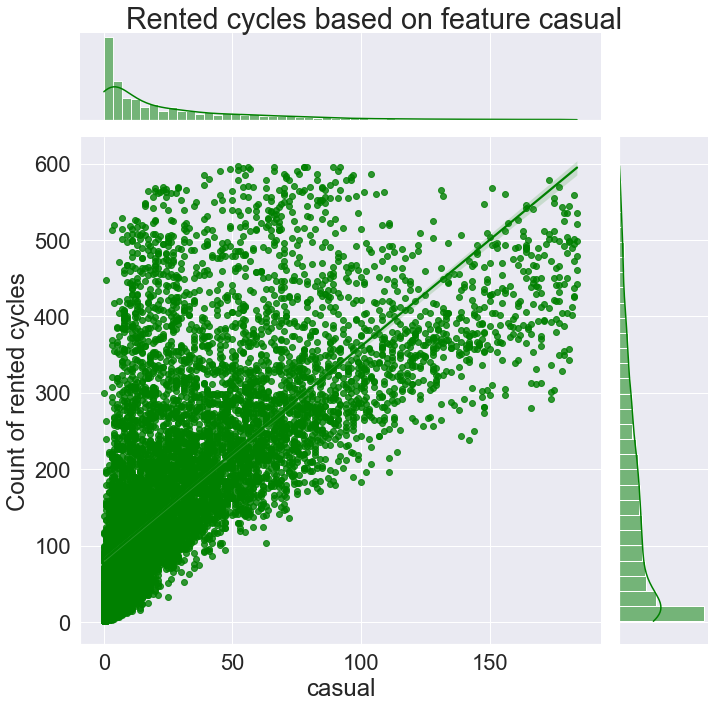

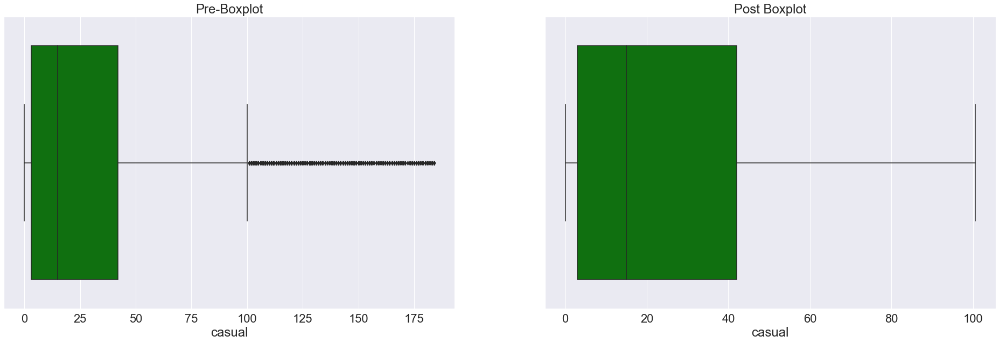




The change in standard deviation for feature casual after outlier treatment is -6.122985593082433


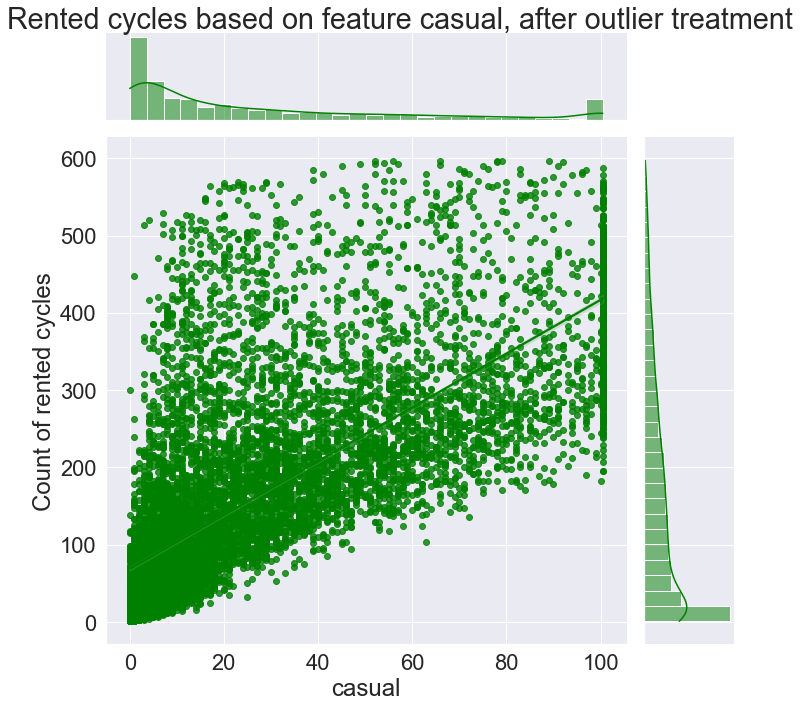






________________________________________registered________________________________________







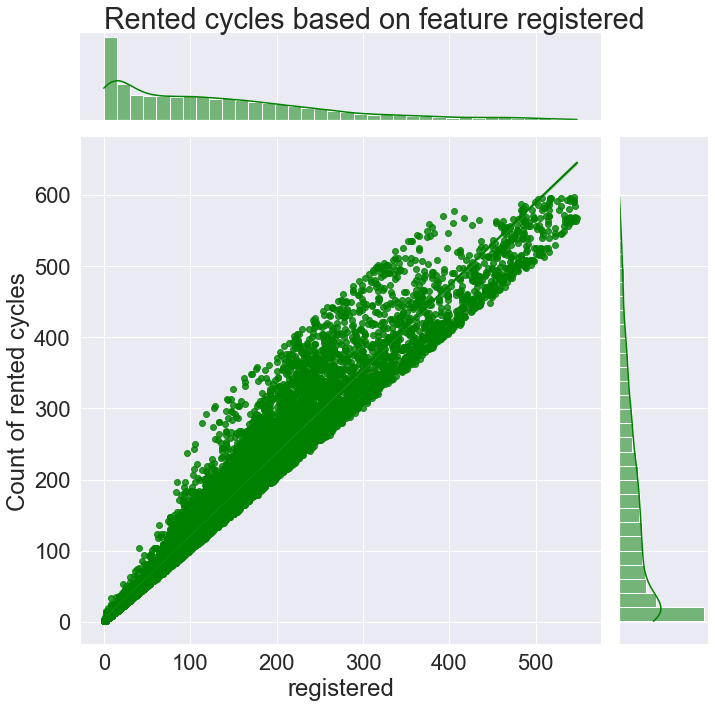

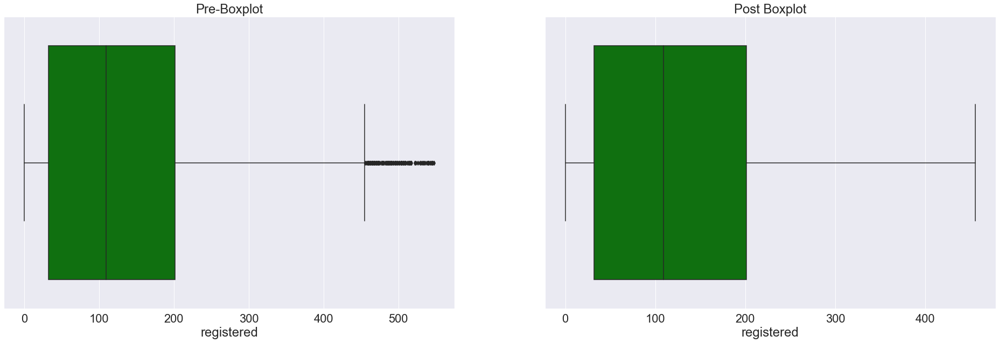




The change in standard deviation for feature registered after outlier treatment is -2.378681688647333


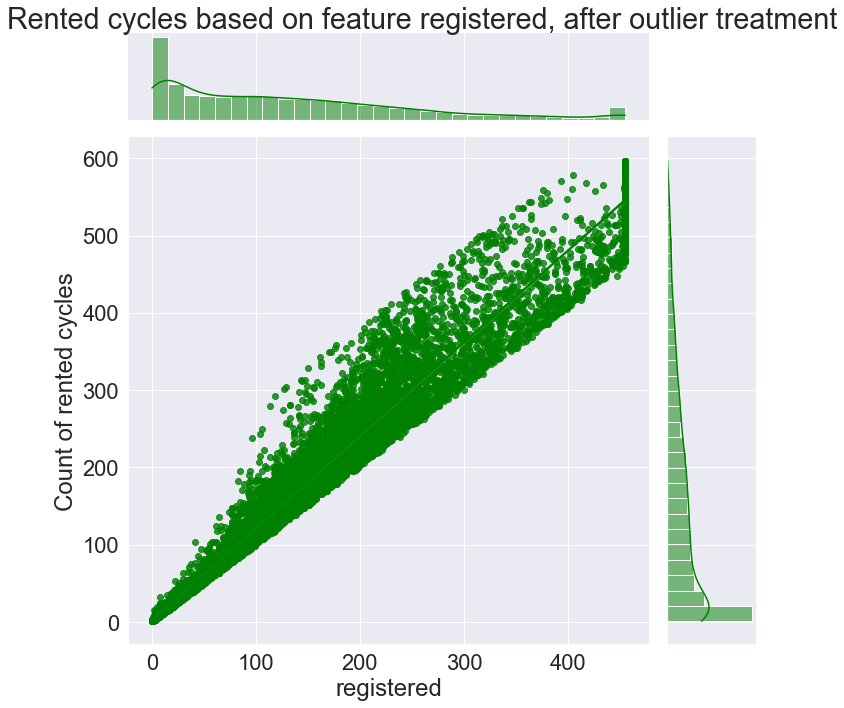

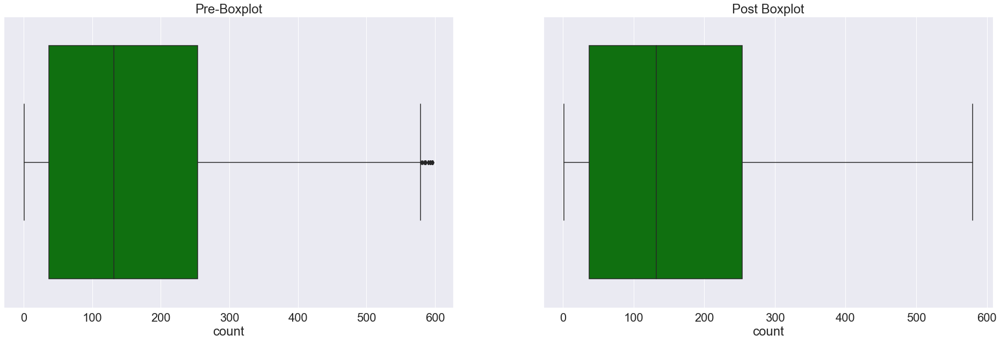




The change in standard deviation for feature count after outlier treatment is -0.0814431157298543


C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
C:\anaconda\envs\eda\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

In [47]:
# Read the dataset
df = pd.read_csv('train_bikes.csv')

# Identify the colums names containg numeric (continuous or discrete) or categorical features
df,cont, dis,cat, t=identify_feature(df)

# Treat the outliers present in the dataset
df=outlier_removal(df,cont,dis,'count','Regression','remove')

# Create bins for the humidity feature
df['humidity_level']=np.nan
df.loc[df['humidity']<=20,'humidity_level']='low'
df.loc[(df['humidity']<=40) & (df['humidity']>20),'humidity_level']='perfect'
df.loc[(df['humidity']<=60) & (df['humidity']>40),'humidity_level']='comfortable'
df.loc[(df['humidity']<=80) & (df['humidity']>60),'humidity_level']='uncomfortable'
df.loc[df['humidity']>80,'humidity_level']='extreme'
# Create bins based on the hour feature
df['datetime_hour_level']=np.nan
df.loc[df['datetime_hour']<=6,'datetime_hour_level']='night'
df.loc[(df['datetime_hour']>20),'datetime_hour_level']='night'
df.loc[(df['datetime_hour']<=11) & (df['datetime_hour']>6),'datetime_hour_level']='morning'
df.loc[(df['datetime_hour']<=16) & (df['datetime_hour']>11),'datetime_hour_level']='afternoon'
df.loc[(df['datetime_hour']<=20) & (df['datetime_hour']>16),'datetime_hour_level']='evening'
# Create bins based on the windflow
df['windspeed_level']=np.nan
df.loc[df['windspeed']<=2,'windspeed_level']='calm'
df.loc[(df['windspeed']<=15) & (df['windspeed']>2),'windspeed_level']='light'
df.loc[(df['windspeed']<=30) & (df['windspeed']>15),'windspeed_level']='strong'
df.loc[df['windspeed']>30,'windspeed_level']='gale'

# Temperature has very less unique values and act as a discrete numerical, so we convert its values in bins
df['temp']=df['temp'].astype('int')//5
df['atemp']=df['atemp'].astype('int')//5

# Dependent  feauture
y=df['count']

# Perform encoding on categorical features
cat_trans={'one_hot_encoding':['season','humidity_level','weather','datetime_year','windspeed_level','datetime_hour_level'],'frequency_encoding':[],'mean_encoding':[],'target_guided_ordinal_encoding':{}}
df=categorical_transformation(df,cat_trans)

# Drop unnecessary features
df.drop(['humidity', 'windspeed','casual', 'registered', 'count', 'datetime_hour'],axis=1,inplace=True)
x=df.copy()

# Split the dataset in train and test
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=0)

# Initialize the GridSearchCV
param_test = {'max_iter':[5000],'alpha':[1e-10, 1e-8, 1e-4,1e-2, 1, 5, 10, 100, 500, 1000]}
search=GridSearchCV(Lasso(fit_intercept=True, normalize=True, selection='random'),param_grid = param_test, scoring='r2', cv=10)
# perform the search
results = search.fit(x_train, y_train)

In [48]:
# summarize best
print('Best Mean Accuracy: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)

Best Mean Accuracy: 0.584
Best Config: {'alpha': 0.0001, 'max_iter': 5000}


In [49]:
print('Predicting score {a}'.format(a=rmse(results.predict(x_test),y_test)))

Predicting score 90.63140853430933
